In [1]:
import os
import inspect
import seaborn
import matplotlib
import matplotlib.pyplot as plt
import torch
import scanpy as sc
import tqdm
import sys
import pickle
import PyComplexHeatmap as pch
import scvi
import IPython
import numpy as np
import pandas as pd
import scipy
import gseapy
import sklearn
import glasbey

sc.settings.figdir=os.path.expanduser('~/WbFigures/DevAnalysis')
sc._settings.settings._vector_friendly=True

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

if torch.cuda.is_available():
    print("GPU is available")
    print("Number of GPUs:", torch.cuda.device_count())
    print("GPU Name:", torch.cuda.get_device_name(0))
else:
    print("GPU is not available")

sys.path.append('/home/matthew.schmitz/utils/mts-utils/')
from genomics import sc_analysis


import sys
import sys
import antipode
from antipode.antipode_model import *
import antipode.model_functions
from antipode.model_functions import *
import antipode.model_distributions
from antipode.model_distributions import *
import antipode.model_modules
from antipode.model_modules import *
import antipode.train_utils
from antipode.train_utils import *
import antipode.plotting
from antipode.plotting import *
import antipode.post
from antipode.post import uniqlist

try:
    import cuml
except:
    print('no rapids')

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


GPU is not available


/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/cudf/utils/_ptxcompiler.py:64: UserWarning: Error getting driver and runtime versions:

stdout:



stderr:

Traceback (most recent call last):
  File "<string>", line 4, in <module>
  File "/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/numba_cuda/numba/cuda/cudadrv/driver.py", line 272, in __getattr__
    raise CudaSupportError("Error at driver init: \n%s:" %
numba.cuda.cudadrv.error.CudaSupportError: Error at driver init: 

CUDA driver library cannot be found.
If you are sure that a CUDA driver is installed,
try setting environment variable NUMBA_CUDA_DRIVER
with the file path of the CUDA driver shared library.
:


Not patching Numba
  warnings.warn(msg, UserWarning)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/cudf/utils/gpu_utils.py:62: UserWarning: Failed to dlopen libcuda.so.1
  warnings.warn(

# File Load Fixes

not needed if anndata doesn't do silly things like converting strings to binary for no reason...

In [ ]:
data_uns = antipode.anndata_utils.read_h5ad_backed_selective(os.path.expanduser('/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/taxtest/HvQvM/HvQvMall_cere_clean_nodoublets.h5ad'),
    mode='r', selected_keys=['uns','general_region','index','_index','obs'])
data_uns.obs.index = data_uns.obs.index.to_series().astype(str).str.replace('-[0-9]+$','',regex=True).str.replace('-[0-9]+$','',regex=True)

In [ ]:
model_tag = '1.9.1.8.5_Dev_final_noQ_INP_moredim_regionsample'
model_path='/home/matthew.schmitz/Matthew/models/'+model_tag
leaf_key='level_2'


In [ ]:
# if not os.path.exists(os.path.join(model_path,'no_o.h5ad')):
#     antipode_model=antipode.antipode_model.ANTIPODE.load(model_path,prefix='p7_',device=device,load_kw_args={'backed': None})#,load_kw_args={'backed': 'r'}
#     adata=antipode_model.adata_manager.adata
#     adata.obs.index = data_uns.obs.index
#     adata.obs.index=adata.obs.index.to_series().str.replace('-[0-9]+$','',regex=True).str.replace('-[0-9]+$','',regex=True)
#     adata.obs_names_make_unique()
#     adata.obs['neg_log10_singlet']=-np.log10(data_uns.obs['singlet'])
#     new_annos = pd.read_csv('/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/taxtest/annotations/review_annotation_3.csv',index_col=0,skiprows=2)
#     adata.obs['new_ccl'] = new_annos['new_ccl']
#     adata.obs['new_neighborhood'] = new_annos['new_neighborhood']
#     adata.obs['ccl_extended']=adata.obs[leaf_key].replace(adata.obs.groupby(leaf_key)['new_ccl'].value_counts().unstack().idxmax(1).to_dict())
#     adata.obs['new_neighborhood_extended']=adata.obs[leaf_key].replace(adata.obs.groupby(leaf_key)['new_neighborhood'].value_counts().unstack().idxmax(1).to_dict())
#     adata.obs.loc[adata.obs['level_2']=='62','ccl_extended']='Progen_Astro-Ependymal'
#     adata[~adata.obs['new_neighborhood_extended'].isin(['O']),:].write(os.path.join(model_path,'p7_no_o.adata'))
#     del adata

In [ ]:
adata = sc.read_h5ad(os.path.join(model_path,'p4_adata.h5ad'))
antipode_model=antipode.antipode_model.ANTIPODE.load(model_path,prefix='p4_',device=device,adata=adata)#,load_kw_args={'backed': 'r'}
adata=antipode_model.adata_manager.adata
adata.obs.index=adata.obs.index.to_series().str.replace('-[0-9]+$','',regex=True).str.replace('-[0-9]+$','',regex=True)

In [6]:
adata

AnnData object with n_obs × n_vars = 1913938 × 16738
    obs: 'G2M_score', 'S_score', 'batch_name', 'general_region', 'log10_n_counts', 'phase', 'region', 'species', 'female', 'general_region_species', '_scvi_discov_ind', '_scvi_batch_ind', 'psi_0', 'psi_1', 'psi_2', 'q_score', 'level_0', 'level_1', 'level_2', 'antipode_cluster', 'kmeans'
    var: 'highly_variable', 'highly_variable_intersection', 'highly_variable_nbatches', 'highly_variable_rank', 'mean', 'means', 'n_cells', 'std', 'variances', 'variances_norm'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'antipode_cluster_colors', 'general_region_color_dict', 'level_0_colors', 'level_1_colors', 'level_2_colors', 'param_store', 'phase_colors', 'region_colors', 'species_colors'
    obsm: 'X_antipode', 'X_antipode_UMAP', 'discov_onehot', 'kmeans_onehot', 'phase_sex', 'taxon_probs'
    layers: 'spliced'

In [7]:
for x in ['general_region_color_dict','region_colors_dict','region_colors_dict']:
    try:
        data_uns.uns[x] = dict(zip(data_uns.uns[x].keys(),[y.decode() for y in data_uns.uns[x].values()]))
        adata.uns[x] = data_uns.uns[x]
    except:
        print(data_uns.uns[x].values())
        adata.uns[x] = data_uns.uns[x]
        
for x in ['general_region_colors','region_cats','region_colors','species_colors']:
    try:
        data_uns.uns[x] = [y.decode() for y in data_uns.uns[x]]
        adata.uns[x] = data_uns.uns[x]
    except:
        print(data_uns.uns[x])
        adata.uns[x] = data_uns.uns[x]


dict_values(['#08509b', '#840711', '#73c476', 'magenta', '#f4811d', '#fff4b6', '#fee99e', '#fec859', '#feda7e', '#feb23f', '#bc4503', '#ffface', '#d55607', '#fe9829', '#e76b11', '#5b3495', '#228a44', 'goldenrod', '#b51318', '#6aaed6', '#40aa5d', 'tan', '#9e9ac8', '#a10e15', 'cyan', '#c7171c', '#006c2c', '#9dcae1', '#a0d99b', '#4191c6', '#2070b4', '#796eb2'])


In [8]:
adata.obs['region'] = adata.obs['region'].astype('category')


In [9]:
for x in data_uns.uns.keys():
    adata.uns[x] = data_uns.uns[x]
adata.obs['general_region'] = data_uns.obs['general_region']

In [10]:
adata.uns['species_color_dict'] = {'human': 'dodgerblue', 'macaque': 'darkorange', 'mouse': 'limegreen'}

In [17]:
batch_key='batch_name'
discov_key='species'
layer_key='spliced'
MDE_KEY = "X_antipode_UMAP"
leaf_key = 'level_2'

In [12]:
# np.savetxt(os.path.join(model_path,"X_umap.csv"), adata.obsm[MDE_KEY], delimiter=",")

In [13]:
mappings=pd.read_csv('/home/matthew.schmitz/Matthew/data/taxtest/annotations/many_mappings2.txt.gz',index_col=0)
mappings=mappings.rename({leaf_key:'anno_level_2'},axis=1)
adata.obs.loc[:,mappings.columns] = mappings
adata.obs.loc[:,mappings.columns] = adata.obs.loc[:,mappings.columns].astype(str)

/scratch/fast/47904/ipykernel_2102555/238262838.py:1: DtypeWarning: Columns (2,7,8,9) have mixed types. Specify dtype option on import or set low_memory=False.
  mappings=pd.read_csv('/home/matthew.schmitz/Matthew/data/taxtest/annotations/many_mappings2.txt.gz',index_col=0)
/scratch/fast/47904/ipykernel_2102555/238262838.py:4: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '['376' '376' '157' ... '78' '108' '73']' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  adata.obs.loc[:,mappings.columns] = adata.obs.loc[:,mappings.columns].astype(str)
/scratch/fast/47904/ipykernel_2102555/238262838.py:4: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '['False' 'False' 'False' ... 'False' 'False' 'False']' has dtype incompatible with category, please explicitly cast to a compatible dtype first.
  adata.obs.loc[:,mappin

In [14]:
# new_annos = pd.read_csv('/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/taxtest/annotations/review_annotation.csv',index_col=0,skiprows=2)
new_annos = pd.read_csv('/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/taxtest/annotations/review_annotation_3.csv',index_col=0,skiprows=2)
adata.obs['new_ccl'] = new_annos['new_ccl']
adata.obs['new_neighborhood'] = new_annos['new_neighborhood']
adata.obs['ccl_extended']=adata.obs[leaf_key].replace(adata.obs.groupby(leaf_key)['new_ccl'].value_counts().unstack().idxmax(1).to_dict())
adata.obs['new_neighborhood_extended']=adata.obs[leaf_key].replace(adata.obs.groupby(leaf_key)['new_neighborhood'].value_counts().unstack().idxmax(1).to_dict())

/scratch/fast/47904/ipykernel_2102555/1729121816.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata.obs['ccl_extended']=adata.obs[leaf_key].replace(adata.obs.groupby(leaf_key)['new_ccl'].value_counts().unstack().idxmax(1).to_dict())
/scratch/fast/47904/ipykernel_2102555/1729121816.py:5: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  adata.obs['ccl_extended']=adata.obs[leaf_key].replace(adata.obs.groupby(leaf_key)['new_ccl'].value_counts().unstack().idxmax(1).to_dict())
/scratch/fast/47904/ipykernel_2102555/1729121816.py:6: FutureWarning: The default of observed=False is deprecated

In [ ]:
adata.obs.loc[adata.obs['ccl_extended']=='Progen_OPC','new_neighborhood_extended'] = 'P'

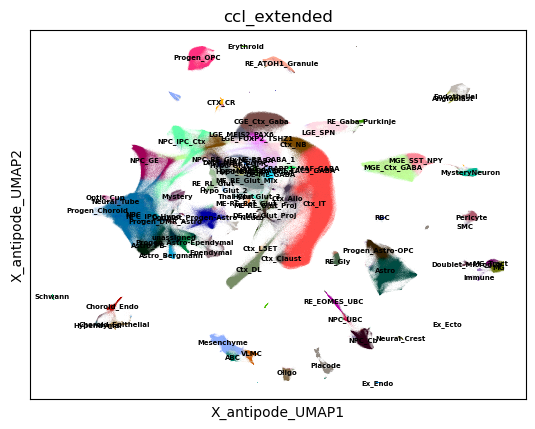


KeyboardInterrupt



Error in callback <function _draw_all_if_interactive at 0x7fe693063060> (for post_execute), with arguments args (),kwargs {}:



KeyboardInterrupt



Error in callback <function flush_figures at 0x7fcffd218fe0> (for post_execute), with arguments args (),kwargs {}:



KeyboardInterrupt



In [15]:
sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    legend_loc='on data',palette=sc.pl.palettes.godsnot_102,legend_fontsize=5,
    color=['ccl_extended'],save='_new_ccl_original_ondata.svg'
)
sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    palette=sc.pl.palettes.godsnot_102,legend_fontsize=5,
    color=['ccl_extended'],save='_new_ccl_original.svg'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    legend_fontsize=5,
    color=['new_neighborhood_extended'],save='_new_neighborhood_original.svg'
)


In [16]:
adata = adata[adata.obs['new_neighborhood_extended']!='O',:]

In [17]:
pstore = adata.uns['param_store']
discov_cluster_params,cluster_params, cluster_labels,var_labels, zero_mask,(prop_taxon, prop_locs,prop_discov_di,prop_discov_dm)=antipode_model.calculate_cluster_params(flavor='numpy')
keep_clusters = np.array([x in adata.obs['level_2'].unique() for x in cluster_labels ])
cluster_labels = np.array(cluster_labels)[keep_clusters]
zero_mask = zero_mask[:,keep_clusters,:]
cluster_index = np.array([int(x) for x in cluster_labels])
zero_mask = np.nan_to_num(zero_mask,posinf=np.nan)
discov_cluster_params = discov_cluster_params[:,cluster_index,:] * zero_mask
prop_locs = prop_locs[cluster_index,:]
prop_discov_di = prop_discov_di[:,cluster_index,:] * zero_mask
prop_discov_dm = prop_discov_dm[:,cluster_index,:] * zero_mask
discov_labels=adata.obs[antipode_model.discov_key].cat.categories
latent_labels=[str(x) for x in range(pstore['discov_dc'].shape[1])]
n_clusters=antipode_model.level_sizes[-1]

/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/code/scANTIPODE/antipode/antipode_mixins.py:445: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  zero_mask = (adata.obs.groupby(self.discov_key)[leaf_level].value_counts().unstack().loc[:,cluster_labels]>=cluster_count_threshold).to_numpy()
/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/code/scANTIPODE/antipode/antipode_mixins.py:446: RuntimeWarning: divide by zero encountered in divide
  return discov_cluster_params,cluster_params, cluster_labels,var_labels, 1/zero_mask[...,np.newaxis],(prop_taxon, prop_locs,prop_discov_di,prop_discov_dm)


In [18]:
adata

View of AnnData object with n_obs × n_vars = 1793824 × 16738
    obs: 'G2M_score', 'S_score', 'batch_name', 'general_region', 'log10_n_counts', 'phase', 'region', 'species', 'female', 'general_region_species', '_scvi_discov_ind', '_scvi_batch_ind', 'psi_0', 'psi_1', 'psi_2', 'q_score', 'level_0', 'level_1', 'level_2', 'antipode_cluster', 'kmeans', 'anno_level_2', 'initial_class', 'ic_extended', 'abc_subclass_markercor', 'juv_subclass_markercor', 'linnarson_extended', 'lamanno_class', 'lamanno_subclass', 'lamanno_cluster', 'neighborhood', 'curated_class_label', 'new_ccl', 'new_neighborhood', 'ccl_extended', 'new_neighborhood_extended'
    var: 'highly_variable', 'highly_variable_intersection', 'highly_variable_nbatches', 'highly_variable_rank', 'mean', 'means', 'n_cells', 'std', 'variances', 'variances_norm'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'antipode_cluster_colors', 'general_region_color_dict', 'level_0_colors', 'level_1_colors', 'level_2_colors', 'param_store', 'phase_colo

In [19]:
# for i in [0,42,129,999,2222222]:
#     print(i)
#     umap = cuml.UMAP(n_neighbors = 60,min_dist=0.2,spread=1,metric='manhattan',init='spectral',random_state=i)
#     adata.obsm[MDE_KEY] = clip_latent_dimensions(umap.fit_transform(adata.obsm['X_antipode']),0.05)
#     sc.pl.embedding(
#         adata,
#         basis=MDE_KEY,
#         legend_loc='on data',palette=sc.pl.palettes.godsnot_102,legend_fontsize=5,
#         color=['ccl_extended']
#     )


In [24]:
# MDE_KEY = "X_antipode_UMAP"
# umap = cuml.UMAP(n_neighbors = 60,min_dist=0.2,spread=1,metric='manhattan')
# adata.obsm[MDE_KEY] = clip_latent_dimensions(umap.fit_transform(adata.obsm['X_antipode']),0.05)
# print('done')

done


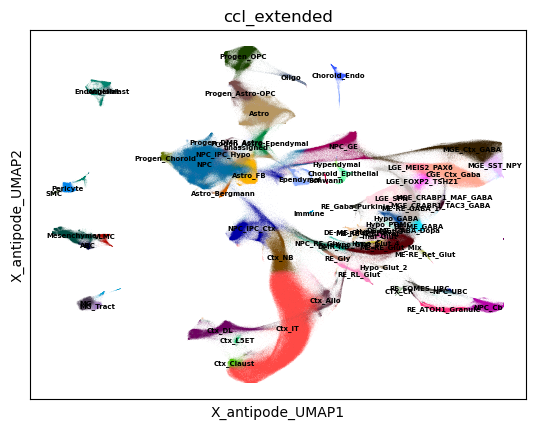

In [25]:
sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    legend_loc='on data',palette=sc.pl.palettes.godsnot_102,legend_fontsize=5,
    color=['ccl_extended']
)

In [97]:
# np.savetxt(os.path.join(model_path,"X_umap.csv"), adata.obsm[MDE_KEY], delimiter=",")

In [ ]:
# adata.obsm['X_umap']=np.loadtxt(os.path.join(model_path,"X_umap.csv"), delimiter=",")

In [27]:
adata.uns['region_colors']=[adata.uns['region_colors_dict'][x] for x in adata.obs['region'].cat.categories]
adata.uns['general_region_colors']=[adata.uns['general_region_color_dict'][x] for x in adata.obs['general_region'].cat.categories]
adata.uns['species_colors']=[adata.uns['species_color_dict'][x] for x in adata.obs[discov_key].cat.categories]
adata.obsm['X_umap']=np.loadtxt(os.path.join(model_path,"X_umap.csv"), delimiter=",")
curateds=pd.read_csv('/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/taxtest/annotations/curated_class.txt',index_col=0)
curateds=curateds.rename({leaf_key:'anno_level_2'},axis=1)
#adata.obs.loc[:,curateds.columns]=adata.obs.loc[:,curateds.columns].astype('string')
adata.obs.loc[:,curateds.columns]=curateds.astype('string')
adata.obs['female']=adata.obs['batch_name'].replace(pd.read_csv('/home/matthew.schmitz/Matthew/data/taxtest/extra/inferred_sex.csv',index_col=0).to_dict()['female'])

/scratch/fast/47904/ipykernel_2102555/1231507651.py:8: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '<StringArray>
['188', '286',  '29', '271', '178', '226',  '57', '123', '223', '267',
 ...
 '242',  '68',  '30',  '52',  '30',  '52',  '68', '187',  '45', '296']
Length: 1793824, dtype: string' has dtype incompatible with category, please explicitly cast to a compatible dtype first.
  adata.obs.loc[:,curateds.columns]=curateds.astype('string')
/scratch/fast/47904/ipykernel_2102555/1231507651.py:9: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  adata.obs['female']=adata.obs['batch_name'].replace(pd.read_csv('/home/matthew.schmitz/Matthew/data/taxtest/extra/inferred_sex.csv',index_col=0).to_d

In [28]:
new_annos

,new_ccl,new_neighborhood
index,,
TCAGACGCACTT_e14-WT8,Placode,O
GTAGCTGGCTTT_e14-WT8,Placode,O
TAGTATGTAATA_e14-WT8,NPC,P
TTCGCATAGGTT_e14-WT8,Ctx_Allo,O
CCTCCAATTGGC_e14-WT8,Ctx_Allo,T
...,...,...
TTTGGTTTCCCTTGTG_SRR13565274_GSM5047783_GW21-04_cerebellum_Homo_sapiens_RNA-Seq_kOut,RE_ATOH1_Granule,DMR
TTTGGTTTCTGCGGCA_SRR13565274_GSM5047783_GW21-04_cerebellum_Homo_sapiens_RNA-Seq_kOut,RE_Gly,DMR
TTTGTCACAGACGCAA_SRR13565274_GSM5047783_GW21-04_cerebellum_Homo_sapiens_RNA-Seq_kOut,RE_EOMES_UBC,DMR


In [29]:
try:
    del adata.uns['hvg']
    del adata.uns['neighbors']
except:
    pass

In [30]:
data_uns

AnnData object with n_obs × n_vars = 1913938 × 16738 backed at '/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/taxtest/HvQvM/HvQvMall_cere_clean_nodoublets.h5ad'
    obs: 'G2M_score', 'S_score', 'batch_name', 'clean_cellname', 'dataset_name', 'doublet', 'full_cellname', 'general_region', 'individual', 'log10_n_counts', 'msregion', 'n_counts', 'n_genes', 'percent_ribo', 'phase', 'region', 'singlet', 'species', 'timepoint'
    uns: 'general_region_color_dict', 'general_region_colors', 'hvg', 'leiden', 'log1p', 'neighbors', 'pca', 'region_cats', 'region_colors', 'region_colors_dict', 'species_color_dict', 'species_colors', 'umap'

In [31]:
adata.obs.loc[:,list(set(data_uns.obs.columns) - set(adata.obs.columns))] = data_uns.obs.loc[:,list(set(data_uns.obs.columns) - set(adata.obs.columns))]

In [32]:
adata.obs['full_cellname'] = adata.obs['full_cellname'].str.decode('utf-8').astype(str)

# Continuing

In [33]:
# model_path='/home/matthew.schmitz/Matthew/models/'+model_tag
# anndata.settings.allow_write_nullable_strings = True

# antipode_model=antipode.antipode_model.ANTIPODE.load(model_path,prefix='p4_',device=device)#adata=adata
# adata=antipode_model.adata_manager.adata
# adata.uns['region_color_dict']=adata.uns['region_colors_dict']

In [34]:
adata.uns['region_color_dict']=adata.uns['region_colors_dict']

In [35]:
batch_key='batch_name'
discov_key='species'
layer_key='spliced'
MDE_KEY = "X_antipode_UMAP"
leaf_key = 'level_2'

In [36]:
log_real_means,real_mean_levels=antipode.model_functions.get_real_leaf_means(adata,discov_key,leaf_key,layer=layer_key)
real_means=pd.DataFrame(log_real_means.mean(0),columns=adata.var.index,index=real_mean_levels[leaf_key])
real_means=real_means.loc[real_mean_levels[leaf_key],:]

100%|██████████| 232/232 [00:51<00:00,  4.51it/s]


In [37]:
to_drop = []
for x in adata.obs.columns:
    # print(x,adata.obs[x].dtype,len(adata.obs[x].unique()))
    cat_col = (adata.obs[x].dtype == object) | (adata.obs[x].dtype == 'category') | (adata.obs[x].dtype == 'string')
    if cat_col & (len(adata.obs[x].unique())>5000):
        to_drop.append(x)
        
adata.obs.drop(to_drop,axis=1,inplace = True)

In [38]:
adata.uns['phase_color_dict'] = {'G1':'teal','G2M':'lightcoral','S':'gold'}
adata.uns['phase_colors'] = [adata.uns['phase_color_dict'][x] for x in adata.obs['phase'].cat.categories]

In [39]:
adata.uns['species_color_dict'] = {'human': 'dodgerblue', 'macaque': 'darkorange', 'mouse': 'limegreen'}
adata.uns['species_colors'] = [adata.uns['species_color_dict'][x] for x in adata.obs[discov_key].cat.categories]

In [56]:
adata.obs['new_neighborhood_extended']=adata.obs['new_neighborhood_extended'].astype('category')
adata.obs['new_neighborhood_extended']=adata.obs['new_neighborhood_extended'].cat.reorder_categories(sorted(adata.obs['new_neighborhood_extended'].cat.categories))
adata.uns['new_neighborhood_extended_color_dict'] = {'O':'slategrey','P':'deeppink','T':'darkorange','NN':'mediumblue','DMR':'seagreen'}
adata.uns['new_neighborhood_extended_colors'] = [adata.uns['new_neighborhood_extended_color_dict'][x] for x in adata.obs['new_neighborhood_extended'].cat.categories]

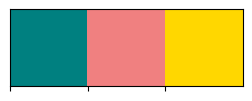

In [48]:

adata.obs['phase'] = adata.obs['phase'].astype('category')
phase_pal = glasbey.extend_palette([adata.uns['phase_color_dict'][x] for x in adata.obs['phase'].cat.categories],palette_size=len(adata.obs['phase'].cat.categories))
seaborn.palplot(phase_pal)
phase_pal_listed = matplotlib.colors.ListedColormap([adata.uns['phase_color_dict'][x] for x in adata.obs['phase'].cat.categories],name='phase_pal')

try:
    matplotlib.colormaps.register(name='phase_pal',cmap=phase_pal_listed)
except:
    pass
gs1=matplotlib.colors.ListedColormap(sc.pl.palettes.godsnot_102,name='godsnot_102')
try:
    matplotlib.colormaps.register(name='godsnot_102',cmap=gs1)
except:
    pass

gs2=matplotlib.colors.ListedColormap(sc.pl.palettes.godsnot_102+sc.pl.palettes.godsnot_102+sc.pl.palettes.godsnot_102,name='godsnot_big')
try:
    matplotlib.colormaps.register(name='godsnot_big',cmap=gs2)
except:
    pass

bog=matplotlib.colors.ListedColormap(list(adata.uns['species_color_dict'].values()),name='bog')
try:
    matplotlib.colormaps.register(name='bog',cmap=bog)
except:
    pass

neighborhood_pal=matplotlib.colors.ListedColormap(list(adata.uns['new_neighborhood_extended_color_dict'].values()),name='neighborhood_pal')
try:
    matplotlib.colormaps.register(name='neighborhood_pal',cmap=neighborhood_pal)
except:
    pass

In [58]:
adata.obs['level_1']=adata.obs['level_1'].astype('int').astype('category')
adata.obs[leaf_key]=adata.obs[leaf_key].astype('int').astype('category')

In [2]:
cluster_meta = pd.read_csv('/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/taxtest/annotations/cluster_meta_0.tsv',sep='\t')

In [47]:
batch_key='batch_name'
discov_key='species'
layer_key='spliced'
MDE_KEY = "X_antipode_UMAP"
leaf_key = 'level_2'
anndata.settings.allow_write_nullable_strings = True

model_tag = '1.9.1.8.5_Dev_final_noQ_INP_moredim_regionsample'
model_path='/home/matthew.schmitz/Matthew/models/'+model_tag
adata = sc.read_h5ad(os.path.join(model_path,'analysis_inprogress.h5ad'))
antipode_model=antipode.antipode_model.ANTIPODE.load(model_path,adata=adata,prefix='p3_',device=device)
antipode_model.save_params_to_uns()
adata=antipode_model.adata_manager.adata
pstore = adata.uns['param_store']

INFO     Generating sequential column names                                                                        


/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/pyro/params/param_store.py:334: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  s

In [9]:
class_dict = dict(zip(cluster_meta['level_2'],cluster_meta['class']))
subclass_dict = dict(zip(cluster_meta['level_2'],cluster_meta['subclass']))
adata.obs['Class'] = adata.obs['level_2'].astype(int).replace(class_dict)
adata.obs['Subclass'] = adata.obs['level_2'].astype(int).replace(subclass_dict)

In [12]:
adata.obs['Class'] = adata.obs['Class'].astype('category')
adata.obs['Subclass'] = adata.obs['Subclass'].astype('category')

In [63]:
# level_1_sizes = (adata.obs.groupby('level_1')[leaf_key].value_counts()
#                    .unstack(fill_value=0)
#                    .gt(0)
#                    .sum(axis=1))

# level_2_pal = glasbey.create_block_palette(list(level_1_sizes))
# level_1_pal = glasbey.create_block_palette([1 for _ in level_1_sizes])
# seaborn.palplot(level_1_pal)
# seaborn.palplot(level_2_pal)

# level_2_color_map = {}
# start_idx = 0
# for i, l1_cat in enumerate(level_1_sizes.index):
#     block_size = level_1_sizes[l1_cat]
#     # blok slice of the level_2 palette
#     block_colors = level_2_pal[start_idx:start_idx + block_size]
#     start_idx += block_size
    
#     # Get the level_2 categories under this level_1
#     l2_cats = adata.obs.loc[adata.obs['level_1'] == l1_cat, leaf_key].unique()
#     l2_cats = sorted(l2_cats)  # or keep as-is if you want the original order
    
#     for j, l2_cat in enumerate(l2_cats):
#         level_2_color_map[str(l2_cat)] = block_colors[j]

# level_1_color_map = {}
# for i, l1_cat in enumerate(level_1_sizes.index):
#     level_1_color_map[str(l1_cat)] = level_1_pal[i]

# level_1_pal = [level_1_color_map[str(x)] for x in adata.obs['level_1'].cat.categories]
# level_2_pal = [level_2_color_map[str(x)] for x in adata.obs[leaf_key].cat.categories]
# level_1_pal_listed=matplotlib.colors.ListedColormap(level_1_pal,name='level_1_pal')
# matplotlib.colormaps.register(name='level_1_pal',cmap=level_1_pal_listed)
# level_2_pal_listed=matplotlib.colors.ListedColormap(level_2_pal,name='level_2_pal')
# matplotlib.colormaps.register(name='level_2_pal',cmap=level_2_pal_listed)

In [64]:
# adata.uns['level_1_color_dict'] = level_1_color_map
# adata.uns['level_1_colors'] = [adata.uns['level_1_color_dict'][str(x)] for x in adata.obs['level_1'].cat.categories]
# adata.uns['level_2_color_dict'] = level_2_color_map
# adata.uns['level_2_colors'] = [adata.uns['level_2_color_dict'][str(x)] for x in adata.obs[leaf_key].cat.categories]

In [65]:
prefix=''
pstore=adata.uns['param_store']
n_clusters=antipode_model.level_sizes[-1]
level_edges=[antipode.model_functions.numpy_hardmax(antipode_model.adata_manager.adata.uns[prefix+'param_store']['edges_'+str(i)],axis=-1) for i in range(len(antipode_model.level_sizes)-1)]
levels=antipode_model.tree_convergence_bottom_up.just_propagate(np.eye(antipode_model.level_sizes[-1]),level_edges)
prop_taxon=np.concatenate(levels,axis=-1)

discov_labels=adata.obs[antipode_model.discov_key].cat.categories
latent_labels=[str(x) for x in range(pstore['discov_dc'].shape[1])]
cluster_index=adata.obs[leaf_key].cat.categories.astype(int)#list(range(antipode_model.level_sizes[-1]))#list(range(pstore['locs'].shape[0]))
cluster_labels=list(adata.obs[leaf_key].cat.categories)
cluster_label_dict=dict(zip(cluster_index,cluster_labels))
var_labels=adata.var.index

prop_locs=prop_taxon@pstore['locs']
prop_cluster_intercept=prop_taxon@pstore['cluster_intercept']
cluster_params=((prop_locs@pstore['z_decoder_weight'])+prop_cluster_intercept+np.mean(pstore['discov_constitutive_de'],0,keepdims=True))
cluster_params=cluster_params[cluster_index,:]

#Need to propagate multilayer tree to discovs
prop_discov_di = np.einsum('pc,dcg->dpg',prop_taxon,pstore['discov_di'])
prop_discov_dm = np.einsum('pc,dcm->dpm',prop_taxon,pstore['discov_dm'])
prop_locs_dynam = np.einsum('pc,cm->pm',prop_taxon,pstore['locs_dynam'])

discov_cluster_params=(np.einsum('dpm,dmg->dpg',prop_locs+prop_discov_dm,pstore['z_decoder_weight']+pstore['discov_dc'])+(prop_cluster_intercept+prop_discov_di+np.expand_dims(pstore['discov_constitutive_de'],1)))-pstore['softmax_shift']
discov_cluster_params=torch.tensor(discov_cluster_params).numpy()

true_locs=antipode.model_functions.group_aggr_anndata(adata,[discov_key,leaf_key],layer='X_antipode',obsm=True,normalize=False)
true_discov_cluster_params=(np.einsum('dpm,dmg->dpg',true_locs[0],pstore['z_decoder_weight']+pstore['discov_dc'])+(prop_cluster_intercept[cluster_index,:]+prop_discov_di[:,cluster_index,:]+np.expand_dims(pstore['discov_constitutive_de'],1)))
true_discov_cluster_params=torch.nn.functional.log_softmax(torch.tensor(true_discov_cluster_params),dim=-1).numpy()



100%|██████████| 696/696 [00:01<00:00, 440.30it/s]


In [66]:
loc_df=pd.DataFrame(prop_locs[cluster_index,:],index=cluster_labels,columns=latent_labels)
leaf_loc_df=pd.DataFrame(pstore['locs'][cluster_index,:],index=cluster_labels,columns=latent_labels)
loc_df=loc_df+(np.random.standard_normal(loc_df.shape)*1e-10)
loc_df.index.name=leaf_key


In [67]:
dynam_var_dict = dict(zip([x for x in range(prop_locs_dynam.shape[0])],np.log(np.absolute(prop_locs_dynam).sum(1).flatten())))
adata.obs['log_abs_sum_dynam'] = [dynam_var_dict[x] for x in adata.obs[leaf_key]]

In [68]:
ordering=list(adata.obs.groupby(leaf_key)['Class'].value_counts().unstack().idxmax(1).sort_values().index)

def add_linkage_adata(adata,df,groupby,cluster_labels,method='average',metric='euclidean',optimal_ordering=False):
    dend_key='dendrogram_'+groupby
    row_linkage=scipy.cluster.hierarchy.linkage(df,method=method,metric=metric,optimal_ordering=optimal_ordering)
    adata.uns[dend_key]={}
    adata.uns[dend_key]['linkage']=row_linkage
    adata.uns[dend_key]['groupby']=[groupby]
    adata.uns[dend_key]['use_rep']=''
    adata.uns[dend_key]['cor_method']=metric
    adata.uns[dend_key]['linkage_method']=method
    adata.uns[dend_key]['categories_idx_ordered']=scipy.cluster.hierarchy.leaves_list(row_linkage)
    adata.uns[dend_key]['categories_ordered']=pd.Series(cluster_labels)[adata.uns['dendrogram_level_2']['categories_idx_ordered']].to_list()
    adata.uns[dend_key]['dendrogram_info']=scipy.cluster.hierarchy.dendrogram(adata.uns['dendrogram_level_2']['linkage'], no_plot=True)

add_linkage_adata(adata,loc_df,groupby=leaf_key,cluster_labels=cluster_labels,optimal_ordering=ordering)#*dim_weights
adata.obs[leaf_key]=adata.obs[leaf_key].cat.reorder_categories(adata.obs[leaf_key].cat.categories[adata.uns['dendrogram_level_2']['categories_idx_ordered']])
ccdict=adata.obs.groupby(leaf_key)['Subclass'].value_counts().unstack().idxmax(1).to_dict()
adata.obs['Subclass']=adata.obs['Subclass'].astype('string').astype('category')
#adata.obs['Subclass']=adata.obs['Subclass'].cat.reorder_categories(uniqlist([ccdict[x] for x in adata.obs[leaf_key].cat.categories]))

ccdict=adata.obs.groupby(leaf_key)['Class'].value_counts().unstack().idxmax(1).to_dict()
adata.obs['Class']=adata.obs['Class'].astype('string').astype('category')
adata.obs['Class']=adata.obs['Class'].cat.reorder_categories(uniqlist([ccdict[x] for x in adata.obs[leaf_key].cat.categories]))

ccdict=adata.obs.groupby(leaf_key)['phase'].value_counts().unstack().idxmax(1).to_dict()
adata.obs['phase']=adata.obs['phase'].cat.reorder_categories(uniqlist([ccdict[x] for x in adata.obs[leaf_key].cat.categories]))



/scratch/fast/50826/ipykernel_1116127/2185611955.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ordering=list(adata.obs.groupby(leaf_key)['Class'].value_counts().unstack().idxmax(1).sort_values().index)
/scratch/fast/50826/ipykernel_1116127/2185611955.py:18: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ccdict=adata.obs.groupby(leaf_key)['Subclass'].value_counts().unstack().idxmax(1).to_dict()
/scratch/fast/50826/ipykernel_1116127/2185611955.py:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current be

In [60]:
import numpy as np
from typing import List, Union, Tuple, Literal
import glasbey
from colorspacious import cspace_convert

# Helper: convert a hex string (e.g. "#RRGGBB") to an sRGB triple in [0, 1].
def hex_to_rgb(hex_color: str) -> np.ndarray:
    hex_color = hex_color.lstrip('#')
    return np.array([int(hex_color[i:i+2], 16)/255.0 for i in (0, 2, 4)], dtype=np.float32)

def create_hierarchical_palette(adata, levels, palette_func, global_hue_bounds=(0, 360), uns_key_prefix="", hue_cushion: float = 0, **palette_kwargs):
    """
    Create hierarchical color palettes for sequential levels such that the lower levels
    are arranged in blocks corresponding to the top-level. For each lower level, the full
    hue range (global_hue_bounds) is divided into as many equal wedges as there are top-level
    categories. Then, each wedge is re-centered on the hue of the corresponding top-level color,
    with an optional cushion (hue_cushion, in degrees) reserved between groups. The restricted
    hue range is passed to palette_func to generate the block for that top-level category.
    
    The function reassigns the categorical order in adata.obs for each level and stores both a
    dictionary mapping and an ordered color list in adata.uns. Probably shouldn't have been based
    on anndata, but here we are...
    
    Parameters
    ----------
    adata : AnnData
        Annotated data object with categorical columns in .obs for each level.
    levels : list of str
        List of level names from top to bottom, e.g.
        ["Class", "Subclass", "Group", "consensus_cluster"].
    palette_func : function
        Function that generates a palette given a block size (an int) and (optionally) hue_bounds.
        (For example, it could be a restricted version of glasbey.create_palette.)
    global_hue_bounds : tuple (float, float)
        The full hue range, e.g. (0, 360).
    uns_key_prefix : str, optional
        Optional prefix for keys in adata.uns.
    hue_cushion : float, optional
        The proportino of color space to reserve as a gap between top-level groups.
        Default is 0.
    **palette_kwargs :
        Additional keyword arguments passed to palette_func (e.g. grid_size, grid_space, lightness_bounds,
        chroma_bounds, colorblind_safe, as_hex, etc.).
    
    Returns
    -------
    palette_mappings : dict
        Dictionary with one entry per level. Each entry is a dict with:
          - "order": list of category names (in hierarchical order)
          - "mapping": dict mapping each category to its assigned color.
    """
    if "theme_color_spacing" in palette_kwargs:
        del palette_kwargs["theme_color_spacing"]
    hue_cushion = min(hue_cushion,0.99)
    hue_cushion = max(hue_cushion,0.)
    
    palette_mappings = {}
    
    # --- Top Level ---
    top_level = levels[0]
    top_order = list(adata.obs[top_level].cat.categories)
    # Generate one color per top-level category in one call.
    top_palette = glasbey.create_palette(len(top_order), **palette_kwargs)
    top_mapping = {cat: col for cat, col in zip(top_order, top_palette)}
    palette_mappings[top_level] = {"order": top_order, "mapping": top_mapping}
    adata.uns[f"{uns_key_prefix}{top_level}_colors_dict"] = top_mapping
    adata.uns[f"{uns_key_prefix}{top_level}_colors"] = [top_mapping[cat] for cat in top_order]
    
    # For each subsequent level, group by the top-level.
    for i in range(1, len(levels)):
        current_level = levels[i]
        current_global_order = list(adata.obs[current_level].cat.categories)
        
        # Group by top-level: determine for each child its top-level parent.
        grouping_dict = (
            adata.obs.groupby(current_level)[top_level]
            .value_counts().unstack()
            .idxmax(1).to_dict()
        )
        
        # Build hierarchical ordering: for each top-level category in order, select those child categories.
        current_order = []
        top_to_children = {}
        for t in top_order:
            children = [child for child in current_global_order if grouping_dict.get(child) == t]
            top_to_children[t] = children
            current_order.extend(children)
        
        adata.obs[current_level] = adata.obs[current_level].cat.reorder_categories(current_order)
        
        # For each top-level category, get its block size.
        block_sizes = [len(top_to_children[t]) for t in top_order]
        wedge_size = (global_hue_bounds[1] - global_hue_bounds[0]) / len(top_order)
        
        current_palette = []
        for idx, t in enumerate(top_order):
            n_children = len(top_to_children[t])
            if n_children == 0:
                continue
            top_color = top_mapping[t]
            if isinstance(top_color, str):
                srgb = hex_to_rgb(top_color)
            else:
                srgb = np.array(top_color, dtype=np.float32)
            top_color_jch = cspace_convert(np.array([srgb]), "sRGB1", "JCh")[0]
            center_hue = top_color_jch[2]
            # Apply hue cushion: available width equals wedge_size minus hue_cushion.
            available_width = wedge_size - wedge_size*hue_cushion
            if available_width < 0:
                available_width = 0
            restricted_hue_bounds = (center_hue - available_width/2, center_hue + available_width/2)
            block_palette = glasbey.create_palette(n_children, hue_bounds=restricted_hue_bounds, **palette_kwargs)
            current_palette.extend(block_palette)
        
        current_mapping = {}
        start_idx = 0
        for t in top_order:
            n_children = len(top_to_children[t])
            block_colors = current_palette[start_idx:start_idx + n_children]
            start_idx += n_children
            for child, col in zip(top_to_children[t], block_colors):
                current_mapping[child] = col
        
        palette_mappings[current_level] = {"order": current_order, "mapping": current_mapping}
        adata.uns[f"{uns_key_prefix}{current_level}_colors_dict"] = current_mapping
        adata.uns[f"{uns_key_prefix}{current_level}_colors"] = [current_mapping[cat] for cat in current_order]
    
    return palette_mappings



palette_mappings = create_hierarchical_palette(
    adata,
    ['Subclass','level_2','level_1'],
    glasbey.create_palette,
    global_hue_bounds=(0, 360),
    grid_size=128,
    grid_space="RGB",
    lightness_bounds=(20, 80),
    chroma_bounds=(20, 360),
    colorblind_safe=False,
    as_hex=True,
    hue_cushion=0.05
)

palette_mappings = create_hierarchical_palette(
    adata,
    ['Class'],
    glasbey.create_palette,
    global_hue_bounds=(0, 360),
    grid_size=128,
    grid_space="RGB",
    lightness_bounds=(20, 80),
    chroma_bounds=(20, 360),
    colorblind_safe=False,
    as_hex=True,
    hue_cushion=0.05
)


/scratch/fast/50826/ipykernel_1116127/1598201637.py:76: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata.obs.groupby(current_level)[top_level]
/scratch/fast/50826/ipykernel_1116127/1598201637.py:76: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata.obs.groupby(current_level)[top_level]


In [92]:


adata.uns['level_1_color_dict'] = dict(zip(adata.obs['level_1'].cat.categories.astype(str),adata.uns['level_1_colors']))
adata.uns['level_2'] = dict(zip(adata.obs['level_2'].cat.categories.astype(str),adata.uns['level_2_colors']))
adata.uns['Class_color_dict'] = dict(zip(adata.obs['Class'].cat.categories,adata.uns['Class_colors']))
adata.uns['Subclass_color_dict'] = dict(zip(adata.obs['Subclass'].cat.categories,adata.uns['Subclass_colors']))
Class_pal=matplotlib.colors.ListedColormap(list(adata.uns['Class_color_dict'].values()),name='Class_pal')
try:
    matplotlib.colormaps.register(name='Class_pal',cmap=Class_pal)
except:
    pass

Subclass_pal=matplotlib.colors.ListedColormap(list(adata.uns['Subclass_color_dict'].values()),name='Subclass_pal')
try:
    matplotlib.colormaps.register(name='Subclass_pal',cmap=Subclass_pal)
except:
    pass


level_1_pal=matplotlib.colors.ListedColormap(list(adata.uns['level_1_color_dict'].values()),name='level_1_pal')
try:
    matplotlib.colormaps.register(name='level_1_pal',cmap=level_1_pal)
except:
    pass

level_2_pal=matplotlib.colors.ListedColormap(list(adata.uns['level_2_color_dict'].values()),name='level_2_pal')
try:
    matplotlib.colormaps.register(name='level_2_pal',cmap=level_2_pal)
except:
    pass


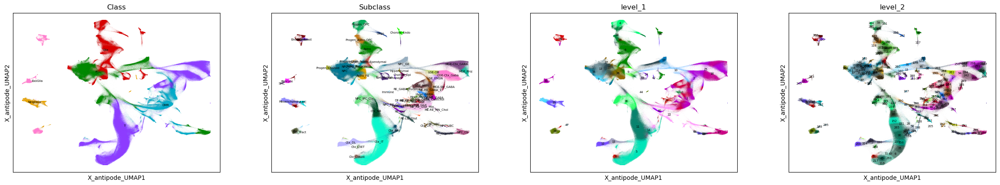

In [62]:
sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=['Class','Subclass','level_1','level_2'],legend_loc='on data',legend_fontsize=5,legend_fontweight='normal'
)


In [69]:
# row_linkage=scipy.cluster.hierarchy.linkage(loc_df,method='average',metric='cityblock')
# cluster_order_inds=scipy.cluster.hierarchy.leaves_list(row_linkage)
# cluster_label_order=pd.Series(cluster_labels)[cluster_order_inds].to_list()

row_linkage=adata.uns['dendrogram_level_2']['linkage']
cluster_order_inds=adata.uns['dendrogram_level_2']['categories_ordered']
cluster_order_inds=adata.uns['dendrogram_level_2']['categories_idx_ordered']

col_linkage=scipy.cluster.hierarchy.linkage(loc_df.abs().T,method='average',metric='correlation')
latent_label_order_inds=scipy.cluster.hierarchy.leaves_list(col_linkage)
latent_label_order=pd.Series(latent_labels)[latent_label_order_inds].to_list()

<Axes: xlabel='psi_2', ylabel='Count'>

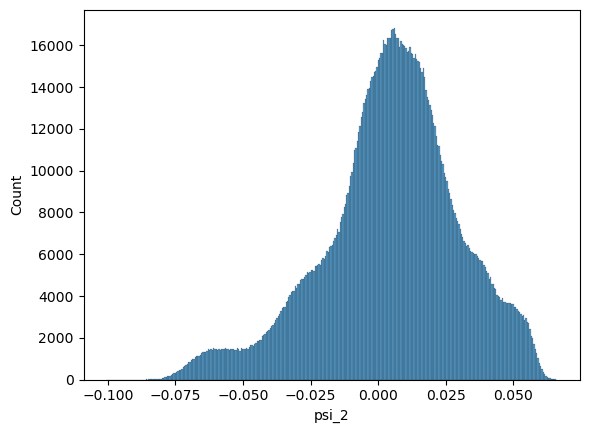

In [70]:
seaborn.histplot(adata.obs['psi_2'])

In [71]:
lowerq = np.quantile(adata.obs['psi_2'],0.01)
upperq = np.quantile(adata.obs['psi_2'],0.99)
qrange = np.max([np.absolute(lowerq),np.absolute(upperq)])
adata.obs['clipped_psi_2'] = np.clip(adata.obs['psi_2'],-qrange,qrange)

In [72]:
adata.uns.keys()

dict_keys(['_scvi_manager_uuid', '_scvi_uuid', 'antipode_cluster_colors', 'batch_name_colors', 'ccl_extended_colors', 'dendrogram_level_2', 'general_region_color_dict', 'general_region_colors', 'leiden', 'level_0_colors', 'level_1_color_dict', 'level_1_colors', 'level_2_color_dict', 'level_2_colors', 'neighborhood_color_dict', 'neighborhood_colors', 'new_neighborhood_extended_color_dict', 'new_neighborhood_extended_colors', 'param_store', 'pca', 'phase_color_dict', 'phase_colors', 'region_cats', 'region_color_dict', 'region_colors', 'region_colors_dict', 'species_color_dict', 'species_colors', 'umap', 'Class_colors_dict', 'Class_colors', 'Subclass_colors_dict', 'Subclass_colors', 'level_2_colors_dict', 'level_1_colors_dict', 'Class_color_dict', 'Subclass_color_dict', 'level_2'])

In [79]:
adata.uns['region_colors']=[adata.uns['region_color_dict'][str(x)] for x in adata.obs['region'].cat.categories]
adata.uns['general_region_colors']=[adata.uns['general_region_color_dict'][str(x)] for x in adata.obs['general_region'].cat.categories]
adata.uns['species_colors']=[adata.uns['species_color_dict'][str(x)] for x in adata.obs[discov_key].cat.categories]
adata.uns['phase_colors']=[adata.uns['phase_color_dict'][str(x)] for x in adata.obs['phase'].cat.categories]
adata.uns['level_1_colors'] = [adata.uns['level_1_color_dict'][str(x)] for x in adata.obs['level_1'].cat.categories]
adata.uns['level_2_colors'] = [adata.uns['level_2_color_dict'][str(x)] for x in adata.obs[leaf_key].cat.categories]


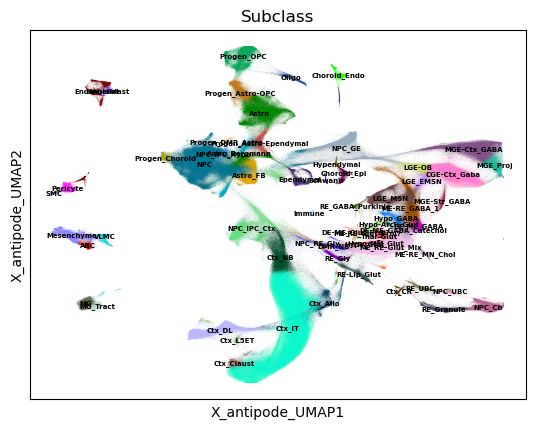

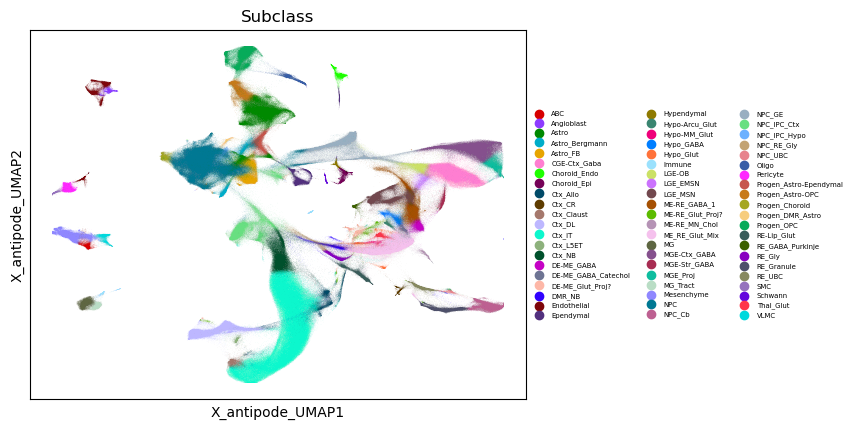

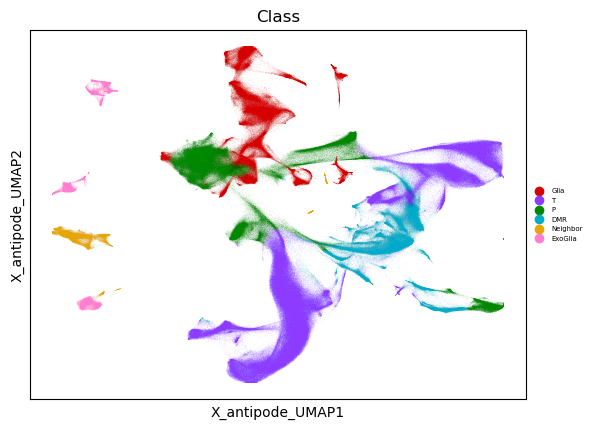

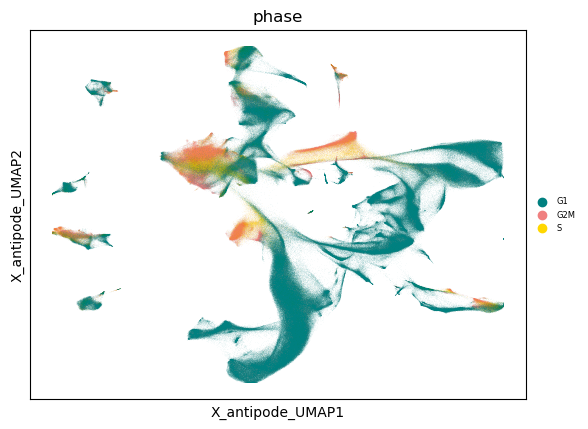

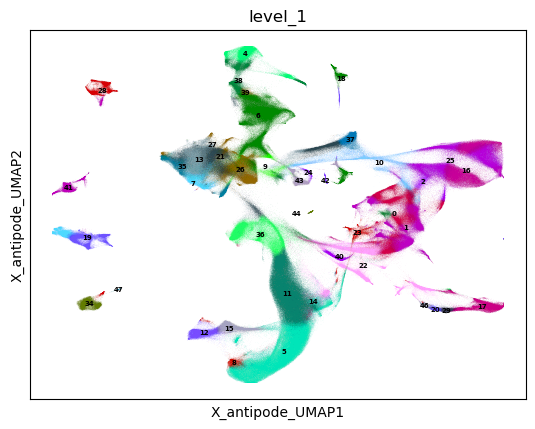

...

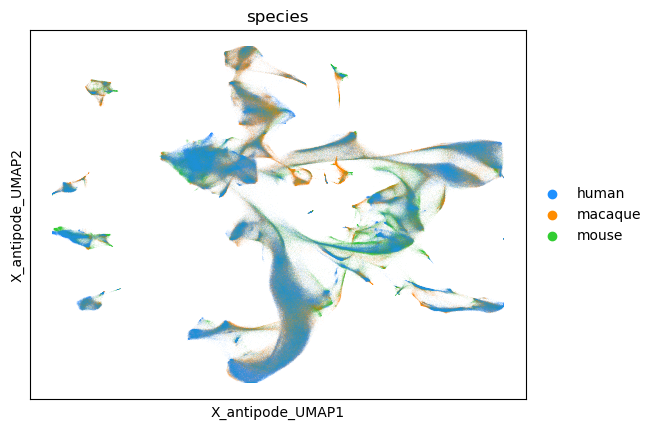

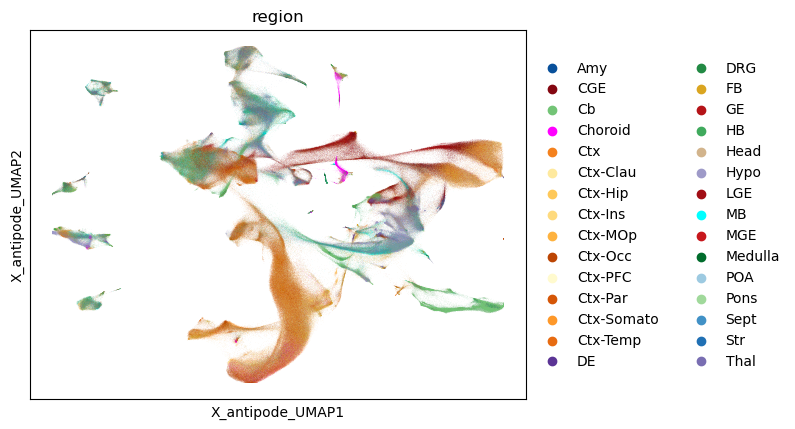

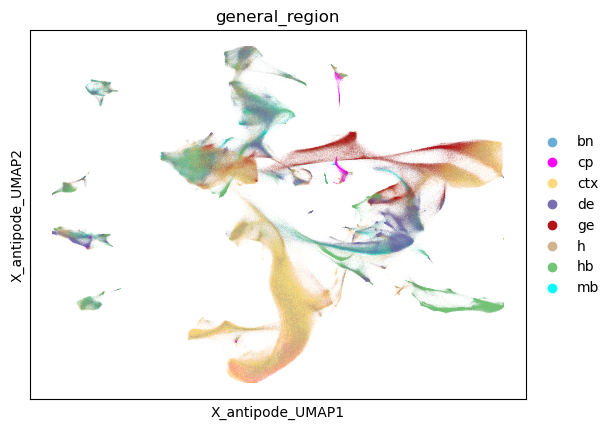

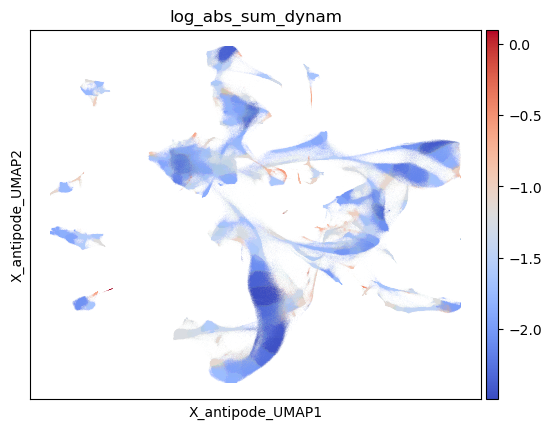

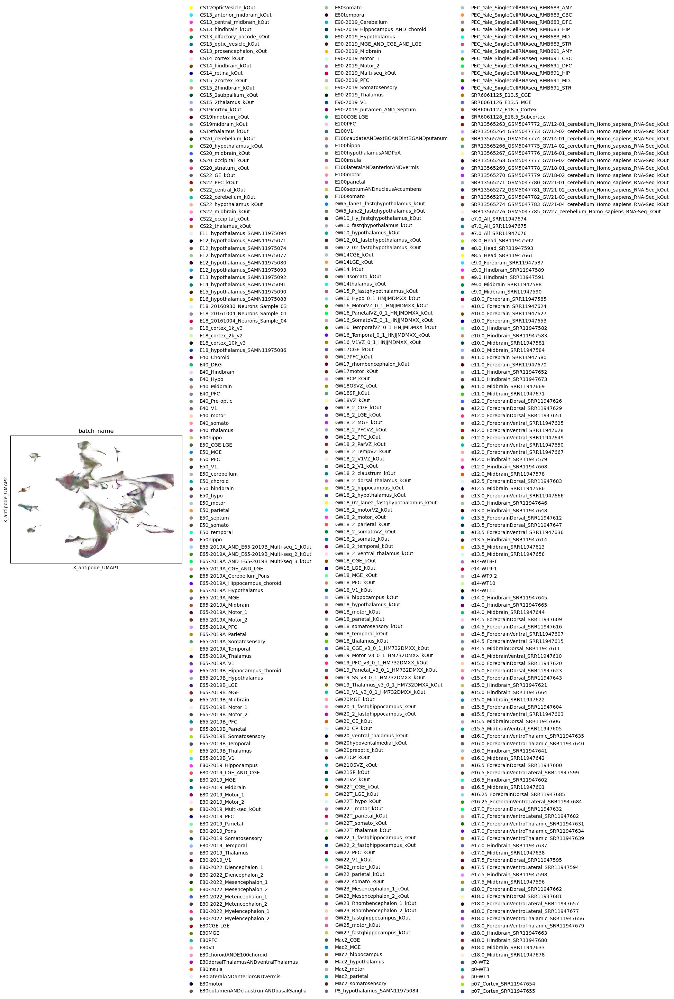

In [80]:
sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    legend_loc='on data',legend_fontsize=5,
    color=['Subclass'],save='_subclass_ondata.svg'
)
sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    legend_fontsize=5,
    color=['Subclass'],save='_subclass.svg'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    legend_fontsize=5,
    color=['Class'],save='_class.svg'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    # palette = 'phase_pal',
    color=["phase"],legend_fontsize=6,legend_fontweight='normal',save='_cc_phase.svg'
)


sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color='level_1',
    legend_fontsize=5,
    legend_loc='on data',save='_level_1.svg'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=leaf_key,
    legend_fontsize=5,
    legend_loc='on data',save='_level_2.svg'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=[x for x in adata.obs.columns if 'psi' in x],
    cmap='coolwarm',
    legend_loc='on data',save='_psi.svg'
)

# sc.pl.embedding(
#     adata,
#     basis=MDE_KEY,
#     color=['q_score'],cmap='coolwarm',save='_q_score.svg'
# )

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    palette = 'bog',
    color=[discov_key],save='_species.svg'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=['region'],save='_region.svg'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=['general_region'],save='_general_region.svg'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color='log_abs_sum_dynam',
    cmap='coolwarm',
    save='_log_abs_sum_dynam.svg'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=['batch_name'],palette=sc.pl.palettes.godsnot_102,save='_batch_name.svg'
)

/scratch/fast/50826/ipykernel_1116127/2503583132.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mat = adata.obs.groupby('level_2')['new_ccl'].value_counts(normalize=True).unstack().T


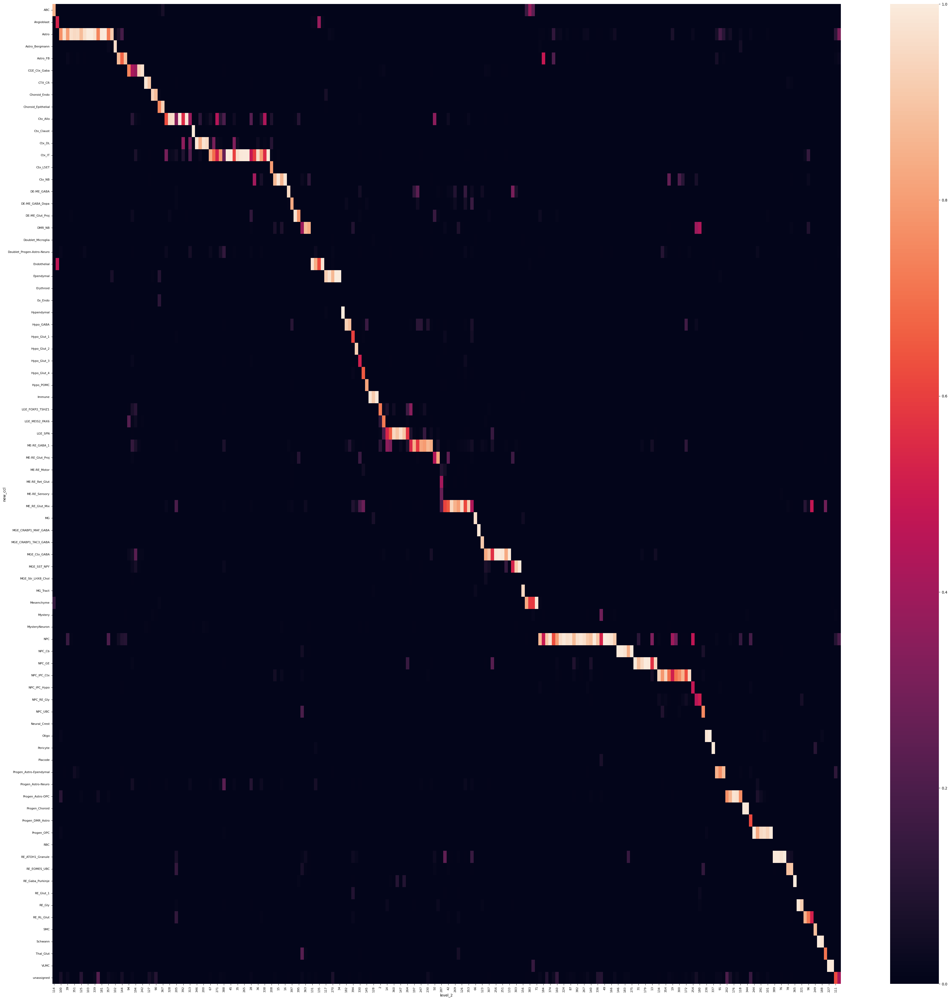

In [81]:
mat = adata.obs.groupby('level_2')['new_ccl'].value_counts(normalize=True).unstack().T
diag_mat = sc_analysis.maximize_diagonality(mat.to_numpy())
diag_df = pd.DataFrame(diag_mat[0],columns = mat.columns[diag_mat[2]],index=mat.index[diag_mat[1]])
sc_analysis.create_heatmap(diag_df)

/scratch/fast/50826/ipykernel_1116127/2418421495.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mat = adata.obs.groupby('level_2')['juv_subclass_markercor'].value_counts(normalize=True).unstack().T


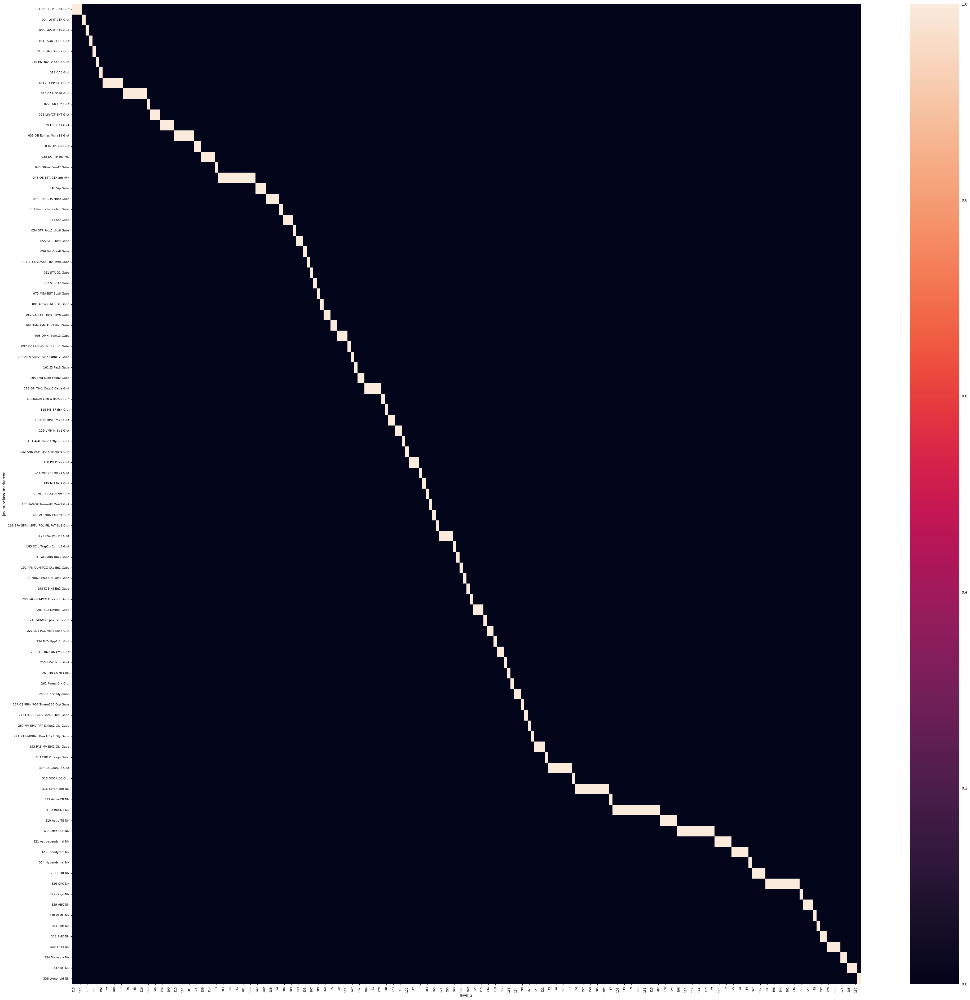

In [82]:
mat = adata.obs.groupby('level_2')['juv_subclass_markercor'].value_counts(normalize=True).unstack().T
diag_mat = sc_analysis.maximize_diagonality(mat.to_numpy())
diag_df = pd.DataFrame(diag_mat[0],columns = mat.columns[diag_mat[2]],index=mat.index[diag_mat[1]])
sc_analysis.create_heatmap(diag_df)


In [83]:
adata

AnnData object with n_obs × n_vars = 1793824 × 16738
    obs: 'G2M_score', 'S_score', 'batch_name', 'general_region', 'log10_n_counts', 'phase', 'region', 'species', 'female', 'general_region_species', '_scvi_discov_ind', '_scvi_batch_ind', 'psi_0', 'psi_1', 'psi_2', 'q_score', 'level_0', 'level_1', 'level_2', 'antipode_cluster', 'kmeans', 'anno_level_2', 'initial_class', 'ic_extended', 'abc_subclass_markercor', 'juv_subclass_markercor', 'linnarson_extended', 'lamanno_class', 'lamanno_subclass', 'lamanno_cluster', 'neighborhood', 'curated_class_label', 'new_ccl', 'new_neighborhood', 'ccl_extended', 'new_neighborhood_extended', 'n_genes', 'percent_ribo', 'msregion', 'singlet', 'individual', 'timepoint', 'n_counts', 'doublet', 'dataset_name', 'log_abs_sum_dynam', 'clipped_psi_2', 'log_n_genes', 'Class', 'Subclass'
    var: 'highly_variable', 'highly_variable_intersection', 'highly_variable_nbatches', 'highly_variable_rank', 'mean', 'means', 'n_cells', 'std', 'variances', 'variances_norm'

In [84]:
# seaborn.histplot(adata.obs['q_score'])

<Axes: ylabel='Count'>

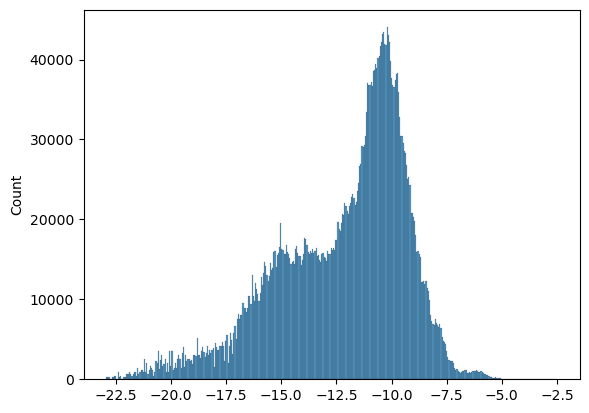

In [85]:
seaborn.histplot(cluster_params.flatten())

In [86]:
import matplotlib.font_manager
print(matplotlib.font_manager.findSystemFonts(fontpaths=None, fontext='ttf'))
matplotlib.font_manager.font_family_aliases

['/usr/share/fonts/dejavu-sans-mono-fonts/DejaVuSansMono-BoldOblique.ttf', '/usr/share/fonts/cantarell/Cantarell-Thin.otf', '/usr/share/fonts/dejavu-sans-fonts/DejaVuSansCondensed-BoldOblique.ttf', '/usr/share/fonts/adobe-source-code-pro/SourceCodePro-BoldIt.otf', '/usr/share/fonts/adobe-source-code-pro/SourceCodePro-ExtraLightIt.otf', '/usr/share/fonts/cantarell/Cantarell-ExtraBold.otf', '/usr/share/fonts/dejavu-sans-fonts/DejaVuSans-BoldOblique.ttf', '/usr/share/fonts/adobe-source-code-pro/SourceCodePro-Regular.otf', '/usr/share/fonts/adobe-source-code-pro/SourceCodePro-BlackIt.otf', '/usr/share/fonts/dejavu-sans-fonts/DejaVuSans.ttf', '/usr/share/fonts/adobe-source-code-pro/SourceCodePro-ExtraLight.otf', '/usr/share/fonts/dejavu-sans-fonts/DejaVuSans-Oblique.ttf', '/usr/share/fonts/cantarell/Cantarell-Light.otf', '/usr/share/fonts/adobe-source-code-pro/SourceCodePro-Semibold.otf', '/usr/share/fonts/dejavu-sans-fonts/DejaVuSans-ExtraLight.ttf', '/usr/share/fonts/adobe-source-code-pro

{'cursive',
 'fantasy',
 'monospace',
 'sans',
 'sans serif',
 'sans-serif',
 'serif'}

In [87]:
%matplotlib inline
plt.rcParams['figure.dpi'] = 100
plt.rcParams['savefig.dpi']=300
plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['font.sans-serif']='DejaVuSansMono'
plt.rcParams['pdf.fonttype']=42


In [88]:
dc_df=pd.DataFrame(pstore['discov_dc'].var(2).T,index=latent_labels,columns=discov_labels)
# dm_df=pd.DataFrame(pstore['discov_dm'][:,cluster_index,:].var(2).T,index=cluster_labels,columns=discov_labels)
# dmt_df=pd.DataFrame((pstore['discov_dm'][:,cluster_index,:].var(1)).T,index=latent_labels,columns=discov_labels)
# di_df=pd.DataFrame(pstore['discov_di'][:,cluster_index,:].var(2).T,index=cluster_labels,columns=discov_labels)
prop_di=np.einsum('lc,scg->slg',prop_taxon,pstore['discov_di'])
prop_dm=np.einsum('lc,scg->slg',prop_taxon,pstore['discov_dm'])
dm_df=pd.DataFrame(prop_dm[:,cluster_index,:].var(2).T,index=cluster_labels,columns=discov_labels)
dmt_df=pd.DataFrame((prop_dm[:,cluster_index,:].var(1)).T,index=latent_labels,columns=discov_labels)
di_df=pd.DataFrame(prop_di[:,cluster_index,:].var(2).T,index=cluster_labels,columns=discov_labels)
# adata.obs[leaf_key] = adata.obs[leaf_key].astype('category')
adata.obs[leaf_key] = adata.obs[leaf_key].cat.reorder_categories(sorted(adata.obs[leaf_key].cat.categories))

In [109]:
#cluster_anno_df=pd.DataFrame([pstore['edges_1'].argmax(-1)[cluster_index].astype(str)]).T
cluster_anno_df=pd.DataFrame(adata.obs.groupby(leaf_key)['level_1'].value_counts(dropna=True).unstack().idxmax(1))
cluster_anno_df.columns=['level_1']
#cluster_anno_df=cluster_anno_df.loc[cluster_label_order,:]
#cluster_anno_df.index=[str(x) for x in range(cluster_anno_df.shape[0])]
#cluster_anno_df['cell_class']=adata.obs.groupby(leaf_key)['cell_class'].value_counts(dropna=True).unstack().idxmax(1)
cluster_anno_df[leaf_key]=adata.obs[leaf_key].cat.categories
# cluster_anno_df['q_score']=adata.obs.groupby(leaf_key)['q_score'].mean()
adata.obs['log_n_genes'] = np.log10((adata.layers[layer_key]>0).sum(1).A1)
cluster_anno_df['log_n_genes']=adata.obs.groupby(leaf_key)['log_n_genes'].mean()
cluster_anno_df['phase']=adata.obs.groupby(leaf_key)['phase'].value_counts(dropna=True).unstack().idxmax(1)
cluster_anno_df['Subclass']=adata.obs.groupby(leaf_key)['Subclass'].value_counts(dropna=True).unstack().idxmax(1)
cluster_anno_df['Class']=adata.obs.groupby(leaf_key)['Class'].value_counts(dropna=True).unstack().idxmax(1)
cluster_anno_df['Class']=cluster_anno_df['Class'].astype('category')
cluster_anno_df['Class']=cluster_anno_df['Class'].cat.reorder_categories(sorted(cluster_anno_df['Class'].cat.categories))

cluster_anno_df['Subclass']=cluster_anno_df['Subclass'].astype('category')
cluster_anno_df['Subclass']=cluster_anno_df['Subclass'].cat.reorder_categories(sorted(cluster_anno_df['Subclass'].cat.categories))
cluster_anno_df.index=list(cluster_anno_df[leaf_key])

left_ha = pch.HeatmapAnnotation(
            #level_2=pch.anno_simple(cluster_anno_df[leaf_key], rasterized=False,cmap='godsnot_102',legend=False),
            Class=pch.anno_simple(cluster_anno_df.Class, rasterized=False,legend=True,cmap='Class_pal'),
            Subclass=pch.anno_simple(cluster_anno_df.Subclass, rasterized=False,legend=False,cmap='Subclass_pal'),
            level_1=pch.anno_simple(cluster_anno_df.level_1, rasterized=False,legend=False,cmap='level_1_pal'),
            phase=pch.anno_simple(cluster_anno_df['phase'], rasterized=False,cmap='phase_pal',legend=True),#
            # q_score=pch.anno_simple(cluster_anno_df.q_score, rasterized=False,legend=False,cmap='coolwarm'),
            log_n_genes=pch.anno_simple(cluster_anno_df.log_n_genes, rasterized=False,legend=False,cmap='Blues'),
            axis=0)

In [94]:
cluster_anno_df

,level_1,level_2,log_n_genes,phase,Subclass,Class
0,0,0,3.182330,G1,Hypo-MM_Glut,DMR
1,1,1,3.216011,G1,DE-ME_GABA,DMR
2,2,2,3.012585,G1,LGE_EMSN,T
6,5,6,3.159625,G1,Ctx_IT,T
8,6,8,3.264995,G1,Progen_Astro-Ependymal,Glia
...,...,...,...,...,...,...
392,5,392,3.193804,G1,Ctx_Allo,T
394,22,394,3.199607,G1,Hypo_Glut,DMR
395,23,395,3.005100,G1,DE-ME_Glut_Proj?,DMR
397,1,397,3.182522,G1,DE-ME_GABA_Catechol,DMR


In [95]:
cell_cutoff=50
species_binary=adata.obs.groupby(leaf_key)[discov_key].value_counts(normalize=False).unstack()>cell_cutoff
zdw_mat=pd.DataFrame(np.absolute(pstore['z_decoder_weight']),index=latent_labels,columns=var_labels).T
species_mat=adata.obs.groupby(leaf_key)[discov_key].value_counts(normalize=False).unstack()
species_mat=(species_mat/species_mat.sum(0))
region_mat=adata.obs.groupby(leaf_key)['general_region'].value_counts(normalize=True).unstack()
#region_mat=(region_mat/region_mat.sum(0))
region_mat=region_mat.loc[:,['ctx','ge','bn','de','mb','hb','cp','h']]

species_ha_dict={}
for col in region_mat.columns:
    species_ha_dict[col]=pch.anno_simple(region_mat[col],cmap='Greens',legend=False)

for col in species_mat.columns:
    species_ha_dict[col+' cell#']=pch.anno_simple(species_mat[col],cmap='Blues',legend=False)

for col in species_binary.columns:
    species_ha_dict[col+'>'+str(cell_cutoff)]=pch.anno_simple(species_binary[col],cmap='Grays',legend=False)

for col in dm_df.columns:
    species_ha_dict[col+'_DM']=pch.anno_simple(dm_df[col],cmap='Purples',legend=False)

for col in di_df.columns:
    species_ha_dict[col+'_DI']=pch.anno_simple(di_df[col],cmap='Reds',legend=False)

species_ha_dict['label']=pch.anno_label(cluster_anno_df[leaf_key], merge=True, rotation=0,adjust_color=False,colors='black',extend=True,relpos=[-6.,0.],fontsize=2,arrowprops = dict(visible=False))

right_ha = pch.HeatmapAnnotation(**species_ha_dict,axis=0)


/scratch/fast/50826/ipykernel_1116127/3371641581.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  species_binary=adata.obs.groupby(leaf_key)[discov_key].value_counts(normalize=False).unstack()>cell_cutoff
/scratch/fast/50826/ipykernel_1116127/3371641581.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  species_mat=adata.obs.groupby(leaf_key)[discov_key].value_counts(normalize=False).unstack()
/scratch/fast/50826/ipykernel_1116127/3371641581.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current beha

In [96]:
div_markers={'G0':list(set([])),#'YWHAG','NNAT'
             'G1':list(set(['CCND1','CCND2','CCND3','CCNE1','CCNE2','MKI67','PCNA'])),
'G1S':list(set(['MCM5', 'PCNA', 'TYMS', 'FEN1', 'MCM2', 'MCM4', 'RRM1', 'UNG', 'GINS2', 'MCM6', 'CDCA7',
      'DTL', 'PRIM1', 'UHRF1', 'MLF1IP', 'HELLS', 'RFC2', 'RPA2', 'RAD51AP1', 'GMNN', 
      'WDR76', 'SLBP', 'UBR7', 'POLD3', 'MSH2', 'ATAD2', 'RAD51', 'RRM2', 'CDC45', 
      'CDC6', 'EXO1', 'TIPIN', 'DSCC1', 'BLM', 'CASP8AP2', 'USP1', 'CLSPN', 'POLA1', 'CHAF1B', 
      'E2F8','H4C3','H1-3','H1-5','H2AC12','H2AC20','H1-2','H1-4','H1-1','FBXO5',
      'SPC25','FAM83D','HIST1H1A','HIST1H1B','HIST1H1C','HIST1H1D','HIST1H1E','CCND1','CCND2','CCND3'])),#,'CCNE1', 'CCNE2'
'G2M':list(set(['HMGB2', 'CDK1', 'NUSAP1', 'UBE2C', 'BIRC5', 'TPX2', 'TOP2A', 'NDC80', 'CKS2', 'NUF2', 
       'CKS1B', 'MKI67', 'TMPO', 'CENPF', 'TACC3', 'FAM64A', 'SMC4', 'CCNB2', 'CKAP2L', 'CKAP2', 
       'AURKB', 'BUB1', 'KIF11', 'ANP32E', 'TUBB4B', 'GTSE1', 'KIF20B', 'HJURP', 'CDCA3', 'HN1', 
       'CDC20', 'TTK', 'CDC25C', 'KIF2C', 'RANGAP1', 'NCAPD2', 'DLGAP5', 'CDCA2', 'CDCA8', 'ECT2', 
       'KIF23', 'HMMR', 'AURKA', 'PSRC1', 'ANLN', 'LBR', 'CKAP5', 'CENPE', 'CTCF', 'NEK2', 'G2E3', 
       'GAS2L3', 'CBX5','ASPM','CENPA','CCND1','CCND2','CCND3']))
        }

gl_path='/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/taxtest/gene_lists/'
vg_genes=pd.read_csv(os.path.join(gl_path,'HGNC_voltage_gated.tsv'),sep='\t')
np_genes=pd.read_csv(os.path.join(gl_path,'MTS_neuropeptides_receptors.tsv'),sep='\t')
np_genes['type'] = np_genes['type'].str.split(',')
np_genes = np_genes.explode('type')
autism_genes=pd.read_csv(os.path.join(gl_path,'SFARI_autism.tsv'),sep='\t')
tf_genes=pd.read_csv(os.path.join(gl_path,'TFs_lambert_pmid29425488_1.01.txt'),sep='\t')

short_gene_lists={
    'G1/S':div_markers['G1S'],
    'G2/M':div_markers['G2M'],
    'TFs':tf_genes['hgnc_symbol'],
    'SFARI Autism':autism_genes.loc[autism_genes['gene-score']>2,'gene-symbol']
}

bp_dict=gseapy.get_library('GO_Biological_Process_2023')
bp_keys=list(bp_dict.keys())

chosen_bp=['Negative Regulation Of Heterochromatin Formation (GO:0031452)',
    'Positive Regulation Of Heterochromatin Formation (GO:0031453)',
'Mitochondrion Distribution (GO:0048311)',
 ]
bp=chosen_bp

for x in bp:
    term=x.split(' (GO:')[0]
    short_gene_lists[term]=bp_dict[x]

for k in short_gene_lists.keys():
    if adata.var.index.isin(short_gene_lists[k]).sum()<5:
        try:
            del gene_lists[k]
        except:
            pass


gene_lists={
    'G1/S':div_markers['G1S'],
    'G2/M':div_markers['G2M'],
    #'Voltage-gated':vg_genes['Approved symbol'],
    #'TFs':tf_genes['hgnc_symbol'],
    'SFARI Autism':autism_genes.loc[autism_genes['gene-score']>1,'gene-symbol'],
}




for k in short_gene_lists.keys():
    if adata.var.index.isin(short_gene_lists[k]).sum()<5:
        try:
            del gene_lists[k]
        except:
            pass


In [97]:
prerank_out=antipode.plotting.get_prerank_from_mat(zdw_mat,short_gene_lists,min_size=3,max_size=max([len(short_gene_lists[k]) for k in short_gene_lists.keys()])+100,permutation_num=1000)
prerank_out_df=prerank_out.pivot_table( index='input_column',columns='Term', values='NES', aggfunc='first').astype(float)
prerank_out_pval_df=prerank_out.pivot_table( index='input_column',columns='Term', values='FDR q-val', aggfunc='first').astype(float)

  0%|          | 0/200 [00:00<?, ?it/s]2025-03-25 23:37:58,864 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
  0%|          | 1/200 [00:01<04:31,  1.36s/it]2025-03-25 23:38:00,182 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
  1%|          | 2/200 [00:02<04:14,  1.28s/it]2025-03-25 23:38:01,410 [WARNING] Duplicated values found in preranked stats: 0.02% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
  2%|▏         | 3/200 [00:03<04:06,  1.25s/it]2025-03-25 23:38:02,621 [WARNING] Duplicated values found in preranked stats: 0.02% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
  2%|▏         | 4/200 [00:04<04:00,  1.23s/it]2025-03-25 23:38:03,817 [WARNING] Duplicated values found in preranked st

In [98]:
term_linkage=scipy.cluster.hierarchy.linkage(prerank_out_df.T,method='average',metric='correlation')
term_linkage_order_inds=scipy.cluster.hierarchy.leaves_list(term_linkage)
term_linkage_order=pd.Series(prerank_out_df.columns)[scipy.cluster.hierarchy.leaves_list(term_linkage)].to_list()

col_linkage=scipy.cluster.hierarchy.linkage(loc_df.T.abs(),method='average',metric='correlation')
latent_label_order_inds=scipy.cluster.hierarchy.leaves_list(col_linkage)
latent_label_order=pd.Series(latent_labels)[latent_label_order_inds].to_list()

# col_linkage=scipy.cluster.hierarchy.linkage(prerank_out_df,method='average',metric='correlation')
# latent_label_order_inds=scipy.cluster.hierarchy.leaves_list(col_linkage)
# latent_label_order=pd.Series(prerank_out_df.index)[latent_label_order_inds].to_list()

In [99]:
prerank_out_df

Term,G1/S,G2/M,Mitochondrion Distribution,Negative Regulation Of Heterochromatin Formation,Positive Regulation Of Heterochromatin Formation,SFARI Autism,TFs
input_column,,,,,,,
0,1.068498,1.005534,1.047701,1.124162,0.942537,1.025021,1.102504
1,0.920642,1.106340,0.901162,0.614130,0.715296,1.042110,1.132617
10,0.859259,0.866879,0.720873,0.833181,0.643171,0.969836,1.120049
100,0.975162,1.071764,1.172260,0.574780,0.768069,0.991667,1.102967
101,1.202519,1.138395,1.094015,0.862369,1.053089,1.030281,1.032080
...,...,...,...,...,...,...,...
95,0.883105,0.909375,0.904060,1.059612,0.782471,0.933735,1.058434
96,0.896021,0.795035,1.064818,-0.784781,0.905697,0.999309,1.048059
97,1.148697,1.364044,1.081013,0.886604,0.852836,1.019020,1.049289


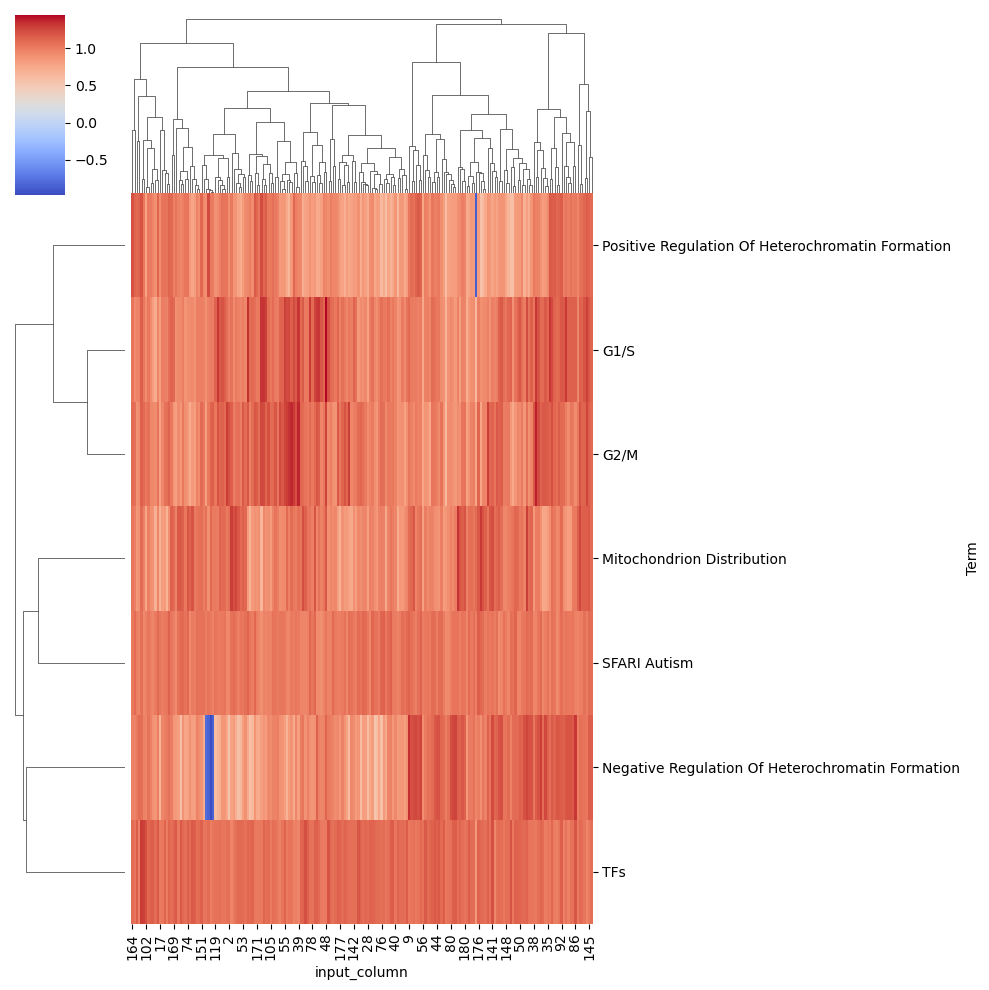

In [100]:
seaborn.clustermap(prerank_out_df.T,col_cluster=True,row_cluster=True,metric='correlation',yticklabels=True,cmap='coolwarm')

Starting plotting..
Starting calculating row orders..
Reordering rows..
Starting calculating col orders..
Reordering cols..
Plotting matrix..
Starting plotting HeatmapAnnotations
Starting plotting HeatmapAnnotations
Starting plotting HeatmapAnnotations
Starting plotting HeatmapAnnotations
Plotting legends..
Estimated legend width: 21.344444444444445 mm


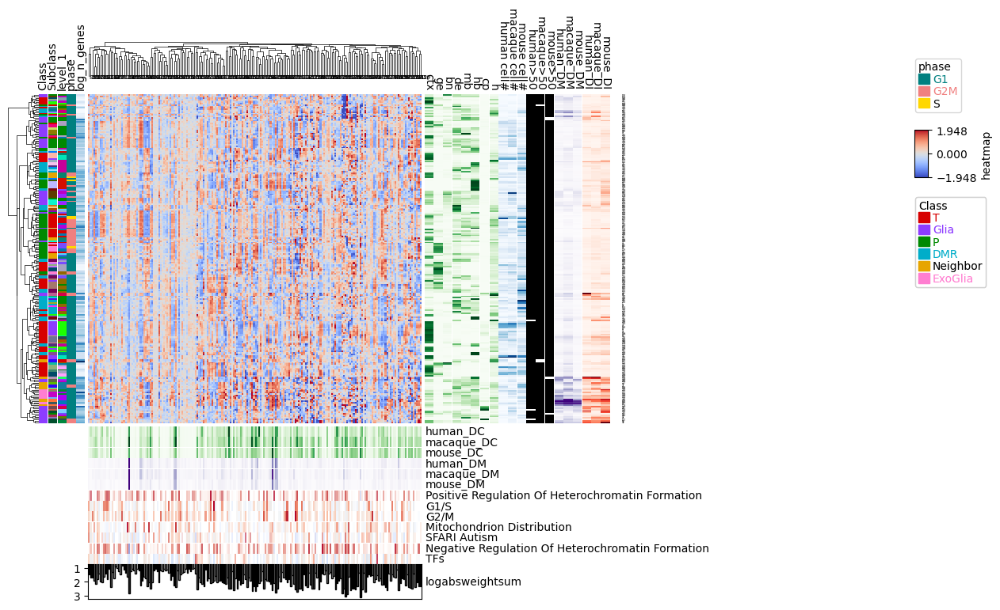

In [110]:
latent_ha_dict={}
breaks=pd.DataFrame({'breaks':[str(int(np.floor(i/20))) for i in range(len(latent_label_order))]},index=latent_label_order)

column_df=dc_df.copy()
column_df.loc[:,prerank_out_df.columns]=prerank_out_df
column_df.loc[:,breaks.columns]=breaks
column_df['index']=column_df.index
column_df=column_df.loc[latent_label_order,:]

for col in dc_df.columns:
    latent_ha_dict[col+'_DC']=pch.anno_simple(column_df[col],cmap='Greens',legend=False,rasterized=True)

for col in dmt_df.columns:
    latent_ha_dict[col+'_DM']=pch.anno_simple(dmt_df[col],cmap='Purples',legend=False,rasterized=True)

for k in term_linkage_order:#gl_preranks.keys():
    latent_ha_dict[k]=pch.anno_simple(column_df[k],cmap='coolwarm',legend=False,alpha=(1-prerank_out_pval_df.loc[column_df.index,k]))#vmin=prerank_out_df[k].min(),vmax=column_df[k].max(),

#latent_ha_dict['breaks']=pch.anno_simple(column_df['breaks'])

mat_anno_df=pd.DataFrame(np.log10(1.+np.absolute(pstore['z_decoder_weight']).sum(1)),columns=['logabsweightsum'],index=latent_labels)
column_df['logabsweightsum']=mat_anno_df
latent_ha_dict['logabsweightsum']=pch.anno_barplot(mat_anno_df['logabsweightsum'], cmap='Greys',rasterized=True,legend=False)
bottom_ha = pch.HeatmapAnnotation(**latent_ha_dict,axis=1,orientation='down',plot=False)


top_anno_dict={}
top_anno_dict['label']=pch.anno_label(column_df['index'], merge=True, rotation=0,adjust_color=False,colors='black',extend=True,relpos=[-1.,-5.],fontsize=5,arrowprops = dict(visible=False))
top_anno = pch.HeatmapAnnotation(**top_anno_dict,axis=1,orientation='up',plot=False)


plt.figure(figsize=(10,8))
#.loc[:,latent_label_order]
#,col_dendrogram=True,col_dendrogram_kws={'linkage':col_linkage}, col_split_order="cluster_between_groups",col_split=breaks['breaks']
#row_cluster=False,row_dendrogram=True,row_dendrogram_kws={'linkage':row_linkage},
#cm1 = pch.ClusterMapPlotter(data=loc_df,cmap='coolwarm',row_cluster=True,row_dendrogram=True,row_dendrogram_kws={'linkage':row_linkage},left_annotation=left_ha,top_annotation=top_anno,right_annotation=right_ha,bottom_annotation=bottom_ha,col_cluster=True,col_dendrogram=True,col_dendrogram_kws={'linkage':col_linkage},rasterized=True)#,col_dendrogram=True,col_dendrogram_kws={'linkage':col_linkage})
#scaleddf=loc_df
scaleddf=((loc_df-loc_df.mean(0))/(np.quantile(loc_df.std(0),0.25)+loc_df.std(0)))
max_val=np.max(np.absolute(scaleddf.min(),scaleddf.max()))*0.5 #clip to 0.5 of max to make more visible
cm1 = pch.ClusterMapPlotter(data=scaleddf,cmap='coolwarm',row_cluster=True,row_dendrogram=True,row_dendrogram_kws={'linkage':row_linkage},left_annotation=left_ha,top_annotation=top_anno,right_annotation=right_ha,bottom_annotation=bottom_ha,col_cluster=True,col_dendrogram=True,col_dendrogram_kws={'linkage':col_linkage},rasterized=True,vmin=-max_val,vmax=max_val)#,col_dendrogram=True,col_dendrogram_kws={'linkage':col_linkage})
plt.savefig(os.path.join(sc.settings.figdir,'Fig2Clustermap.svg'))
plt.show()

In [107]:
adata.uns['level_2_colors_dict'] = {str(x):str(y) for x,y in adata.uns['level_2_colors_dict'].items()}
adata.uns['level_1_colors_dict'] = {str(x):str(y) for x,y in adata.uns['level_1_colors_dict'].items()}

In [102]:
# adata.obs[leaf_key]=list(adata.obs[leaf_key].astype('string'))
# adata.obs['Subclass']=list(adata.obs['Subclass'].astype('string'))

In [108]:
anndata.settings.allow_write_nullable_strings = True
adata.write_h5ad(os.path.join(model_path,'analysis_inprogress.h5ad'))
adata.obs.to_csv(os.path.join(model_path,'obs.tsv'),sep='\t')

In [ ]:
anndata.settings.allow_write_nullable_strings = False

In [ ]:
cols = ['phase',discov_key,'region','general_region','level_1',leaf_key,'clipped_psi_2','timepoint','dataset_name','log10_n_counts','Subclass','Class']+list(mappings.columns)
adata.obs = adata.obs.loc[:,[x for x in cols if x in adata.obs.columns]]
adata.obs = adata.obs.loc[:,~adata.obs.columns.duplicated()]
del adata.layers[layer_key]
del adata.obsm['discov_onehot']
del adata.obsm['kmeans_onehot']
del adata.obsm['phase_sex']
del adata.obsm['taxon_probs']
del adata.obs['curated_class_label']
adata.obs['Subclass'] = [str(x) for x in adata.obs['Subclass']]
adata.write('/home/matthew.schmitz/Matthew/models/'+model_tag+'/for_cellxgene.h5ad')

In [122]:
! cp /home/matthew.schmitz/Matthew/models/1.9.1.8.5_Dev_final_noQ_INP_moredim_regionsample/for_cellxgene.h5ad /allen/programs/celltypes/workgroups/rnaseqanalysis/hct_ux3_cellxgene/anndata_080/V1Evo/

In [123]:
# adata.to_memory().X.max()

In [124]:
print(gseapy.get_library_name())

['ARCHS4_Cell-lines', 'ARCHS4_IDG_Coexp', 'ARCHS4_Kinases_Coexp', 'ARCHS4_TFs_Coexp', 'ARCHS4_Tissues', 'Achilles_fitness_decrease', 'Achilles_fitness_increase', 'Aging_Perturbations_from_GEO_down', 'Aging_Perturbations_from_GEO_up', 'Allen_Brain_Atlas_10x_scRNA_2021', 'Allen_Brain_Atlas_down', 'Allen_Brain_Atlas_up', 'Azimuth_2023', 'Azimuth_Cell_Types_2021', 'BioCarta_2013', 'BioCarta_2015', 'BioCarta_2016', 'BioPlanet_2019', 'BioPlex_2017', 'CCLE_Proteomics_2020', 'CORUM', 'COVID-19_Related_Gene_Sets', 'COVID-19_Related_Gene_Sets_2021', 'Cancer_Cell_Line_Encyclopedia', 'CellMarker_2024', 'CellMarker_Augmented_2021', 'ChEA_2013', 'ChEA_2015', 'ChEA_2016', 'ChEA_2022', 'Chromosome_Location', 'Chromosome_Location_hg19', 'ClinVar_2019', 'DGIdb_Drug_Targets_2024', 'DSigDB', 'Data_Acquisition_Method_Most_Popular_Genes', 'DepMap_CRISPR_GeneDependency_CellLines_2023', 'DepMap_WG_CRISPR_Screens_Broad_CellLines_2019', 'DepMap_WG_CRISPR_Screens_Sanger_CellLines_2019', 'Descartes_Cell_Types_and

In [125]:
print(gseapy.get_library_name())

['ARCHS4_Cell-lines', 'ARCHS4_IDG_Coexp', 'ARCHS4_Kinases_Coexp', 'ARCHS4_TFs_Coexp', 'ARCHS4_Tissues', 'Achilles_fitness_decrease', 'Achilles_fitness_increase', 'Aging_Perturbations_from_GEO_down', 'Aging_Perturbations_from_GEO_up', 'Allen_Brain_Atlas_10x_scRNA_2021', 'Allen_Brain_Atlas_down', 'Allen_Brain_Atlas_up', 'Azimuth_2023', 'Azimuth_Cell_Types_2021', 'BioCarta_2013', 'BioCarta_2015', 'BioCarta_2016', 'BioPlanet_2019', 'BioPlex_2017', 'CCLE_Proteomics_2020', 'CORUM', 'COVID-19_Related_Gene_Sets', 'COVID-19_Related_Gene_Sets_2021', 'Cancer_Cell_Line_Encyclopedia', 'CellMarker_2024', 'CellMarker_Augmented_2021', 'ChEA_2013', 'ChEA_2015', 'ChEA_2016', 'ChEA_2022', 'Chromosome_Location', 'Chromosome_Location_hg19', 'ClinVar_2019', 'DGIdb_Drug_Targets_2024', 'DSigDB', 'Data_Acquisition_Method_Most_Popular_Genes', 'DepMap_CRISPR_GeneDependency_CellLines_2023', 'DepMap_WG_CRISPR_Screens_Broad_CellLines_2019', 'DepMap_WG_CRISPR_Screens_Sanger_CellLines_2019', 'Descartes_Cell_Types_and

In [126]:
mf_dict=gseapy.get_library('GO_Molecular_Function_2023')
mf_keys=list(mf_dict.keys())

In [127]:
mf=[
    'Frizzled Binding (GO:0005109)',
    'Patched Binding (GO:0005113)',
    'Notch Binding (GO:0005112)',
    'Neurexin Family Protein Binding (GO:0042043)',
    'BMP Receptor Binding (GO:0070700)',
    'Ephrin Receptor Binding (GO:0046875)',
    'Platelet-Derived Growth Factor Receptor Binding (GO:0005161)',
    'Transforming Growth Factor Beta Receptor Binding (GO:0005160)',
    'Vascular Endothelial Growth Factor Receptor Binding (GO:0005172)',
    'G Protein-Coupled Glutamate Receptor Binding (GO:0035256)',
    'GABA Receptor Binding (GO:0050811)',
    'Acetylcholine Receptor Binding (GO:0033130)',
    'Adrenergic Receptor Binding (GO:0031690)',
    'Death Receptor Binding (GO:0005123)',
    'Epidermal Growth Factor Receptor Binding (GO:0005154)',
    'Fibroblast Growth Factor Receptor Binding (GO:0005104)',
    'Insulin-Like Growth Factor Receptor Binding (GO:0005159)',
    'Neurotrophin TRK Receptor Binding (GO:0005167)',
    'Nuclear Androgen Receptor Binding (GO:0050681)',
    'Nuclear Estrogen Receptor Binding (GO:0030331)',
    'Nuclear Glucocorticoid Receptor Binding (GO:0035259)'
]

In [128]:
[x for x in bp_keys if 'alamus' in x]

[]

In [129]:
long_bp=[
  'Positive Regulation Of Phosphatidylinositol 3-Kinase Signaling (GO:0014068)',
  'Negative Regulation Of Phosphatidylinositol 3-Kinase Signaling (GO:0014067)',
     'Positive Regulation Of TOR Signaling (GO:0032008)',
     'Negative Regulation Of TOR Signaling (GO:0032007)',
    'Positive Regulation Of Axon Extension (GO:0045773)',
    'Negative Regulation Of Axon Extension (GO:0030517)',
    'Negative Regulation Of Heterochromatin Formation (GO:0031452)',
    'Positive Regulation Of Heterochromatin Formation (GO:0031453)',
    'Cellular Response To Retinoic Acid (GO:0071300)',
'Regulation Of Establishment Of Endothelial Barrier (GO:1903140)',
'Autonomic Nervous System Development (GO:0048483)',
'Astrocyte Development (GO:0014002)',
'Gliogenesis (GO:0042063)',
'Positive Regulation Of Axon Extension (GO:0045773)',
'Negative Regulation Of Axon Extension (GO:0030517)',
'Mitochondrion Distribution (GO:0048311)',
'Macrophage Migration (GO:1905517)',
'Positive Regulation Of Vasculature Development (GO:1904018)',
 'Regulation Of Extrinsic Apoptotic Signaling Pathway In Absence Of Ligand (GO:2001239)',
 'Glial Cell Differentiation (GO:0010001)',
 'Neuron Differentiation (GO:0030182)',
 'Dendrite Morphogenesis (GO:0048813)',
 'Neurotrophin Signaling Pathway (GO:0038179)',
 'Positive Regulation Of Amyloid-Beta Formation (GO:1902004)',
 'Phospholipid Homeostasis (GO:0055091)',
 'Lymphocyte Activation Involved In Immune Response (GO:0002285)',
'Neuron Fate Commitment (GO:0048663)',
'Central Nervous System Myelination (GO:0022010)',
'Dendritic Spine Morphogenesis (GO:0060997)',
'Cranial Nerve Development (GO:0021545)',
'Mesenchyme Morphogenesis (GO:0072132)',
'Oligodendrocyte Development (GO:0014003)',
'Catecholamine Biosynthetic Process (GO:0042423)',
'Macrophage Activation Involved In Immune Response (GO:0002281)',
'Photoperiodism (GO:0009648)',
 'Midbrain Dopaminergic Neuron Differentiation (GO:1904948)',
# 'Dopaminergic Neuron Differentiation (GO:0071542)',
 'Noradrenergic Neuron Differentiation (GO:0003357)',
 'Synaptic Transmission, GABAergic (GO:0051932)',
 'Synaptic Transmission, Cholinergic (GO:0007271)',
 'Synaptic Transmission, Dopaminergic (GO:0001963)',
 'Synaptic Transmission, Glutamatergic (GO:0035249)']

for x in mf:
    term=x.split(' (GO:')[0]
    gene_lists[term]=mf_dict[x]

for x in long_bp:
    term=x.split(' (GO:')[0]
    gene_lists[term]=bp_dict[x]

In [130]:
#print(gseapy.prerank(pd.DataFrame(zdw_mat.var(1)),'GO_Biological_Process_2023',min_size=10,max_size=1000,permutation_num=1000).res2d['Term'])
column_preranks={}
for x in tqdm.tqdm(zdw_mat.columns):
    if not x in column_preranks.keys():
        column_preranks[x]=gseapy.prerank(pd.DataFrame(zdw_mat)[x],'GO_Biological_Process_2023',min_size=25,max_size=500,permutation_num=100).res2d


  0%|          | 0/200 [00:00<?, ?it/s]2025-03-18 21:29:42,479 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
  0%|          | 1/200 [00:13<45:06, 13.60s/it]2025-03-18 21:29:56,086 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
  1%|          | 2/200 [00:26<44:24, 13.46s/it]2025-03-18 21:30:09,441 [WARNING] Duplicated values found in preranked stats: 0.02% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
  2%|▏         | 3/200 [00:40<43:51, 13.36s/it]2025-03-18 21:30:22,677 [WARNING] Duplicated values found in preranked stats: 0.02% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
  2%|▏         | 4/200 [00:53<43:29, 13.32s/it]2025-03-18 21:30:35,930 [WARNING] Duplicated values found in preranked st

In [131]:
for k in column_preranks.keys():
    column_preranks[k]['module']=k

column_prerank_mat=pd.concat(column_preranks.values(),axis=0)
prerank_pval_mat=column_prerank_mat.pivot_table( index='module',columns='Term', values='FDR q-val').astype(float)
column_prerank_mat=column_prerank_mat.pivot_table( index='module',columns='Term', values='NES').astype(float)

In [132]:
term_ranks=antipode.plotting.select_features_by_ica((column_prerank_mat*(1-prerank_pval_mat)).to_numpy(),20,20)
column_prerank_mat.columns[term_ranks]

Index(['Sterol Biosynthetic Process (GO:0016126)',
       'Regulation Of Cell Death (GO:0010941)',
       'Regulation Of Cell Migration Involved In Sprouting Angiogenesis (GO:0090049)',
       'Lymphocyte Proliferation (GO:0046651)',
       'Neutral Amino Acid Transport (GO:0015804)',
       'Negative Regulation Of Endothelial Cell Apoptotic Process (GO:2000352)',
       'Chromosome Condensation (GO:0030261)',
       'Phospholipase C-activating G Protein-Coupled Receptor Signaling Pathway (GO:0007200)',
       'Detection Of Chemical Stimulus Involved In Sensory Perception (GO:0050907)',
       'Detection Of Chemical Stimulus Involved In Sensory Perception Of Smell (GO:0050911)',
       'Detection Of Chemical Stimulus Involved In Sensory Perception Of Taste (GO:0050912)',
       'Positive Regulation Of Locomotion (GO:0040017)',
       'Sensory Perception Of Chemical Stimulus (GO:0007606)',
       'Sensory Perception Of Smell (GO:0007608)',
       'Regulation Of Interleukin-8 Production 

In [133]:
#term_ranks=select_features_by_pca(column_prerank_mat.to_numpy(),20,20)
#column_prerank_mat.columns[term_ranks]

In [134]:
#bp=bp+list(column_prerank_mat.std(0).sort_values().index[-10:])
bp=chosen_bp+list(column_prerank_mat.columns[term_ranks])


In [135]:
short_gene_lists={
    'G1/S':div_markers['G1S'],
    'G2/M':div_markers['G2M'],
    'TFs':tf_genes['hgnc_symbol'],
    'SFARI Autism':autism_genes.loc[autism_genes['gene-score']>2,'gene-symbol']
}

bp_dict=gseapy.get_library('GO_Biological_Process_2023')
bp_keys=list(bp_dict.keys())

chosen_bp=['Negative Regulation Of Heterochromatin Formation (GO:0031452)',
    'Positive Regulation Of Heterochromatin Formation (GO:0031453)',
'Mitochondrion Distribution (GO:0048311)',
 ]

for x in bp:
    term=x.split(' (GO:')[0]
    short_gene_lists[term]=bp_dict[x]

for k in short_gene_lists.keys():
    if adata.var.index.isin(short_gene_lists[k]).sum()<5:
        del gene_lists[k]

prerank_out=get_prerank_from_mat(zdw_mat,short_gene_lists,min_size=3,max_size=max([len(short_gene_lists[k]) for k in short_gene_lists.keys()])+100,permutation_num=500)
prerank_out_df=prerank_out.pivot_table( index='input_column',columns='Term', values='NES', aggfunc='first').astype(float)
prerank_out_pval_df=prerank_out.pivot_table( index='input_column',columns='Term', values='FDR q-val', aggfunc='first').astype(float)

  0%|          | 0/200 [00:00<?, ?it/s]2025-03-18 22:15:09,621 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
  0%|          | 1/200 [00:01<04:14,  1.28s/it]2025-03-18 22:15:10,901 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
  1%|          | 2/200 [00:02<04:07,  1.25s/it]2025-03-18 22:15:12,132 [WARNING] Duplicated values found in preranked stats: 0.02% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
  2%|▏         | 3/200 [00:03<04:04,  1.24s/it]2025-03-18 22:15:13,361 [WARNING] Duplicated values found in preranked stats: 0.02% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
  2%|▏         | 4/200 [00:04<04:02,  1.24s/it]2025-03-18 22:15:14,589 [WARNING] Duplicated values found in preranked st

In [136]:
cluster_df=pd.DataFrame(cluster_params,index=cluster_labels,columns=adata.var.index)

G1/S


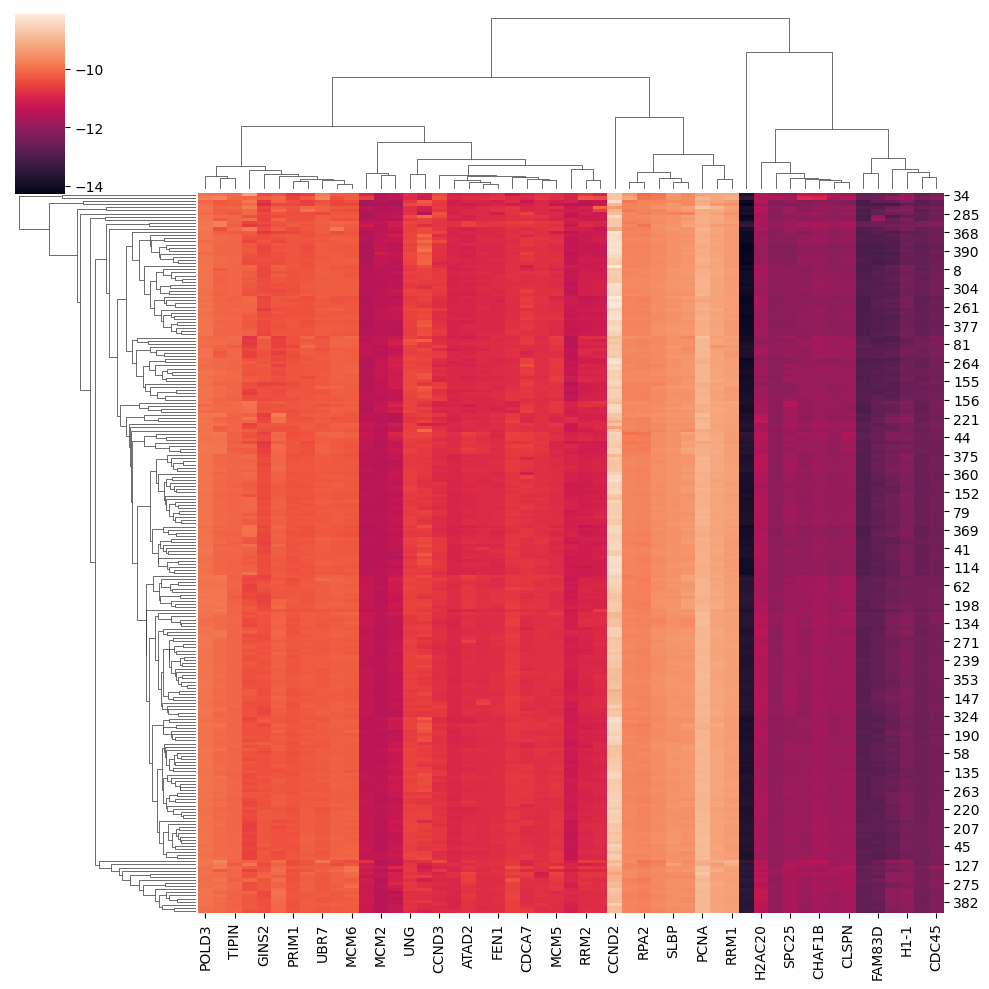

G2/M


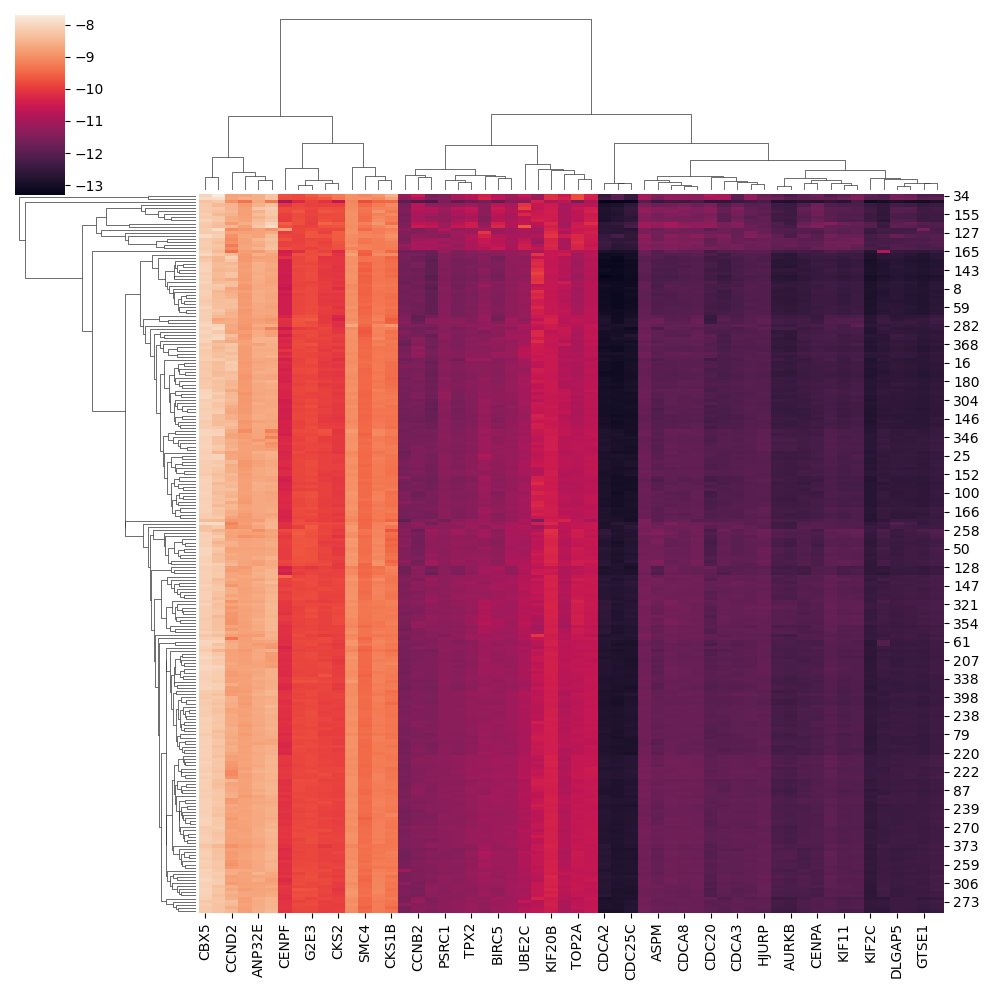

TFs


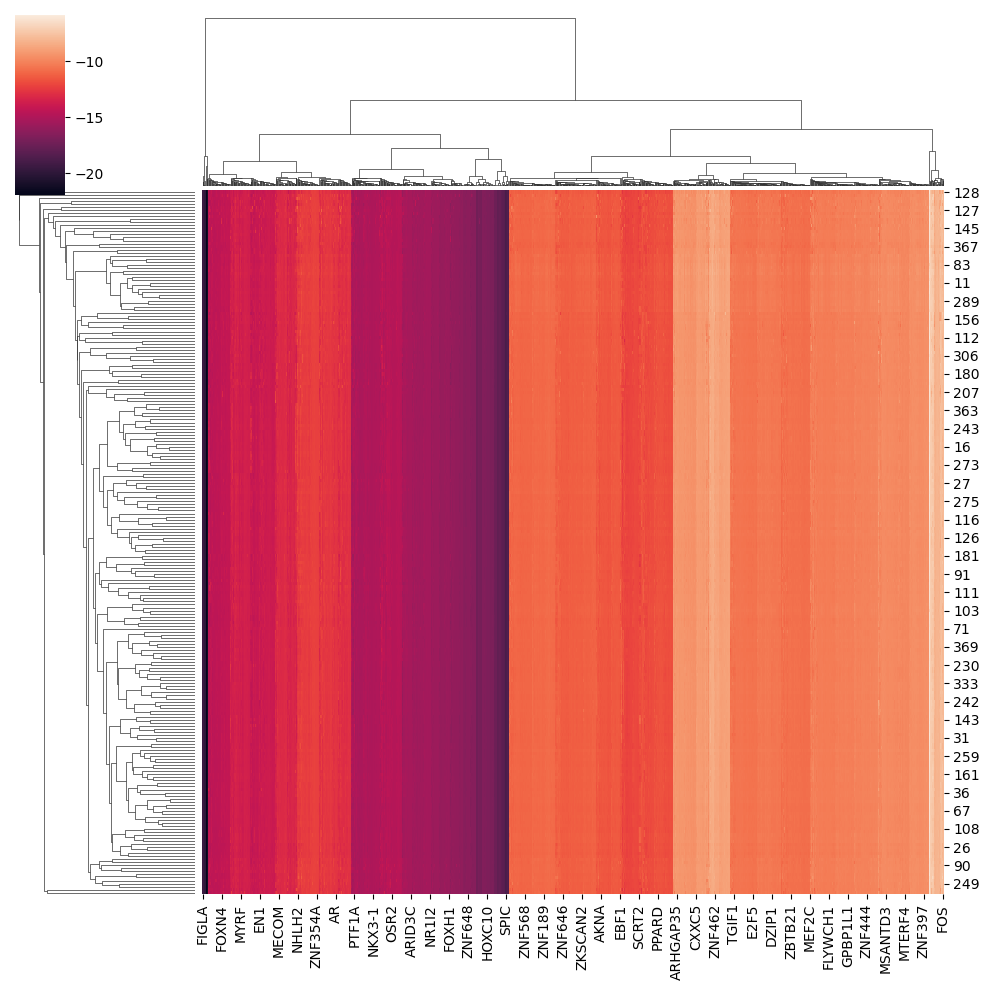

SFARI Autism


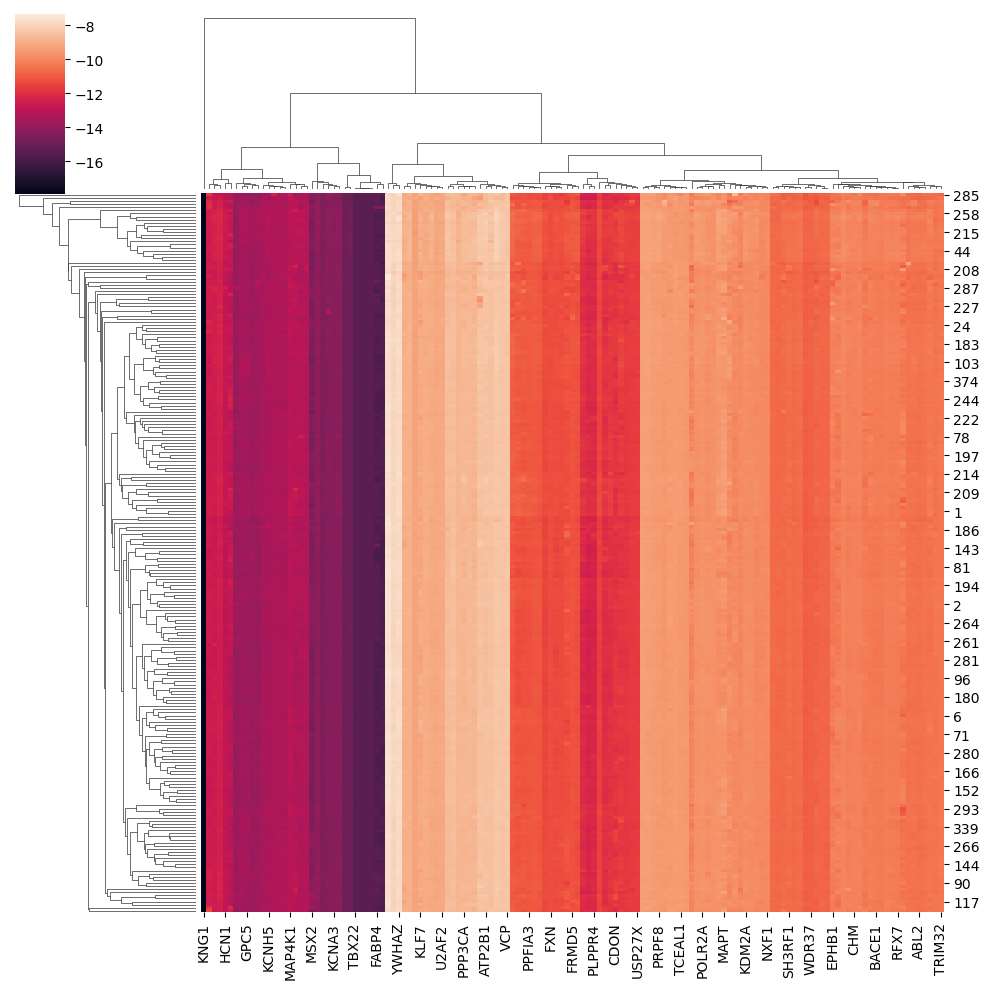

Negative Regulation Of Heterochromatin Formation


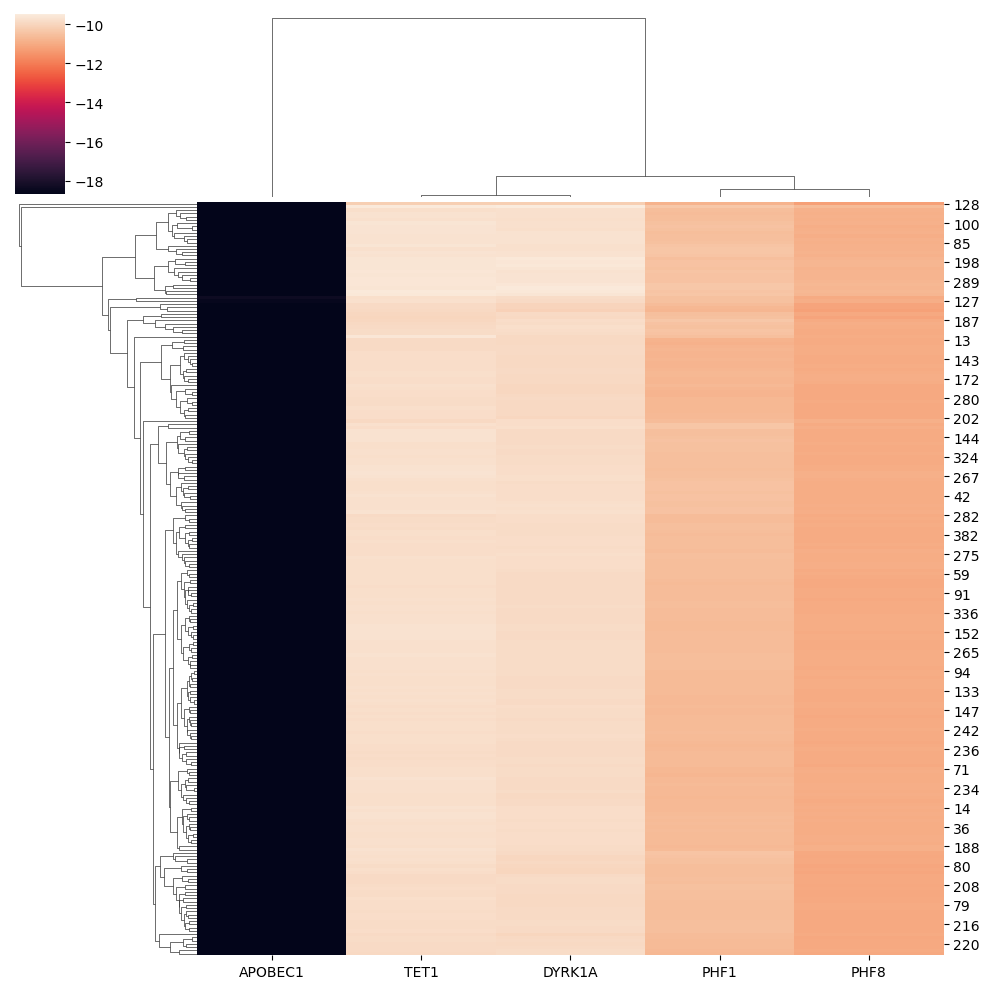

Positive Regulation Of Heterochromatin Formation


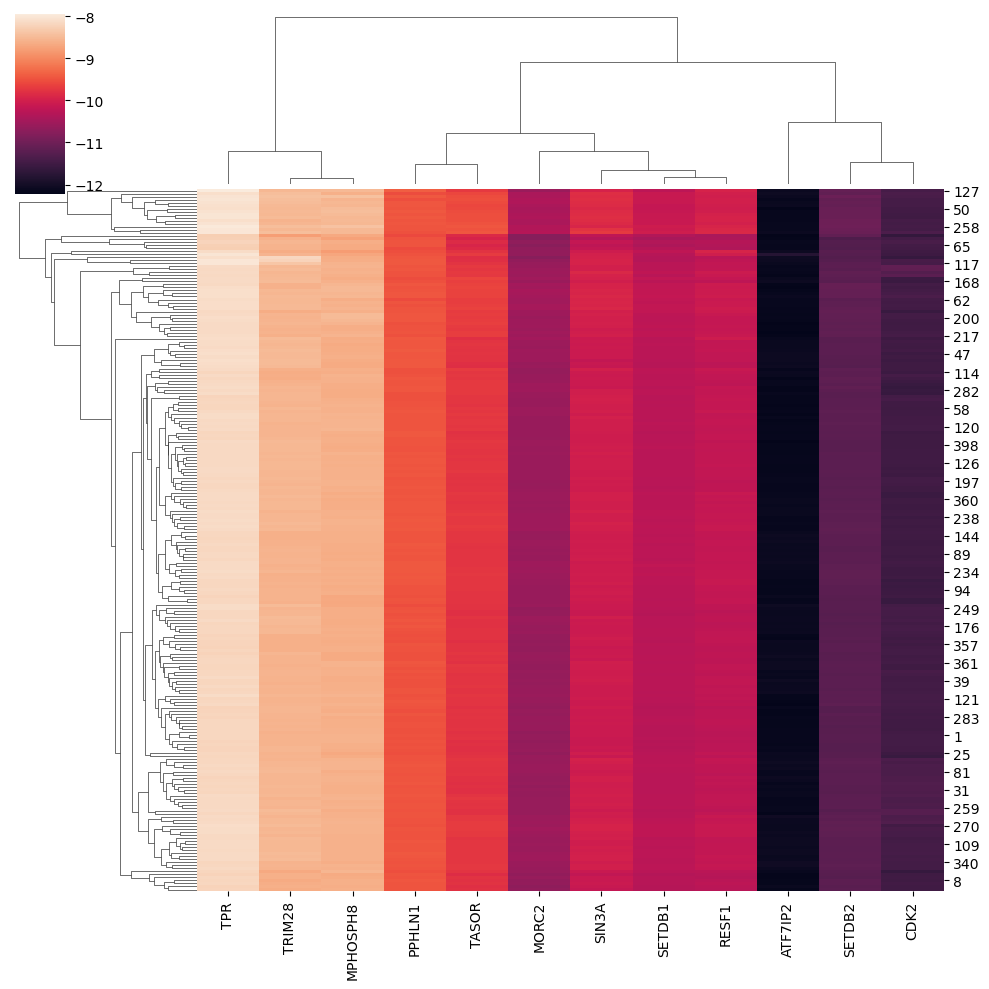

Mitochondrion Distribution


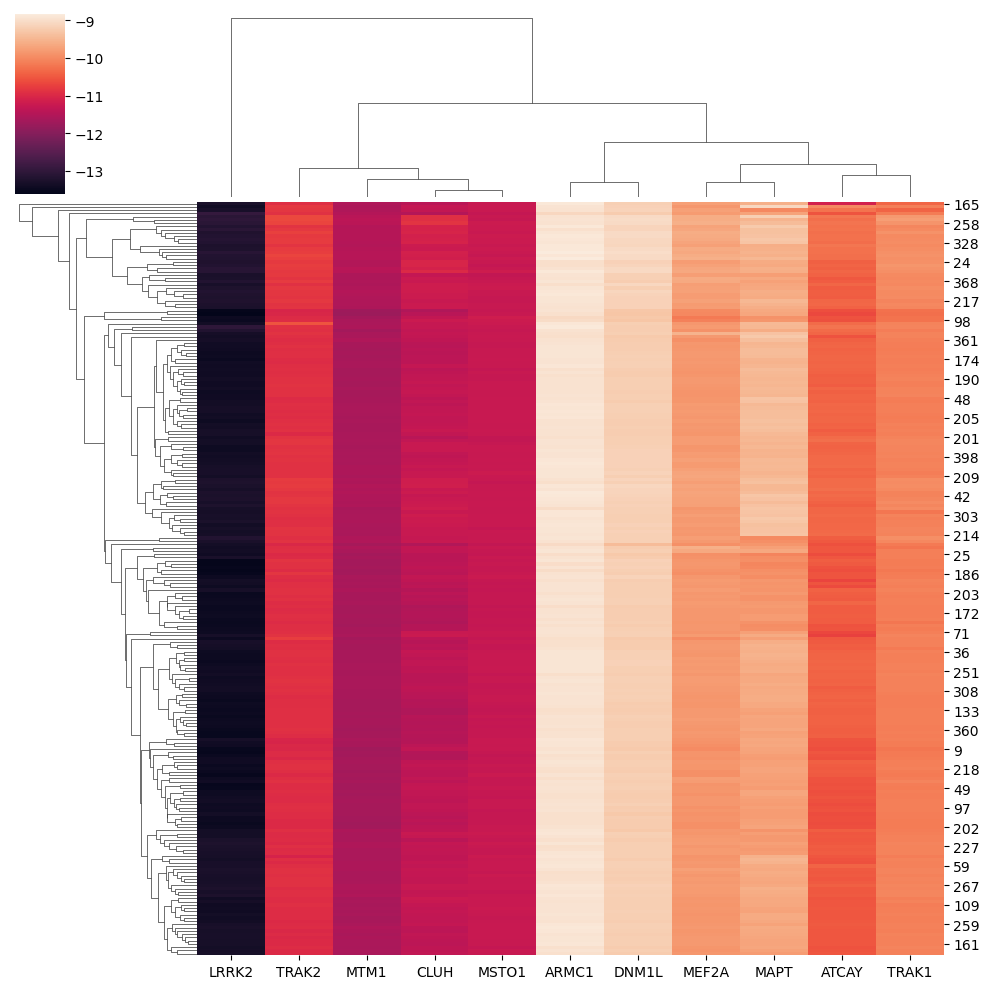

Sterol Biosynthetic Process


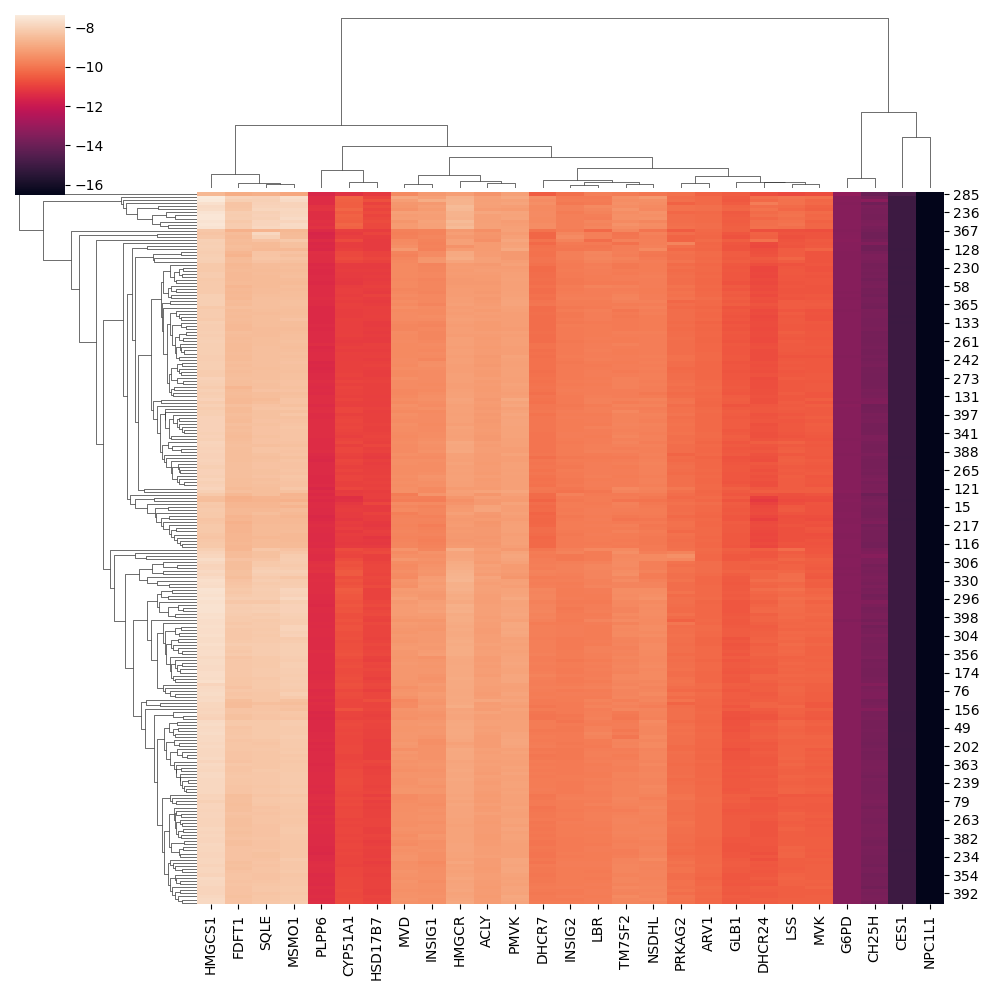

Regulation Of Cell Death


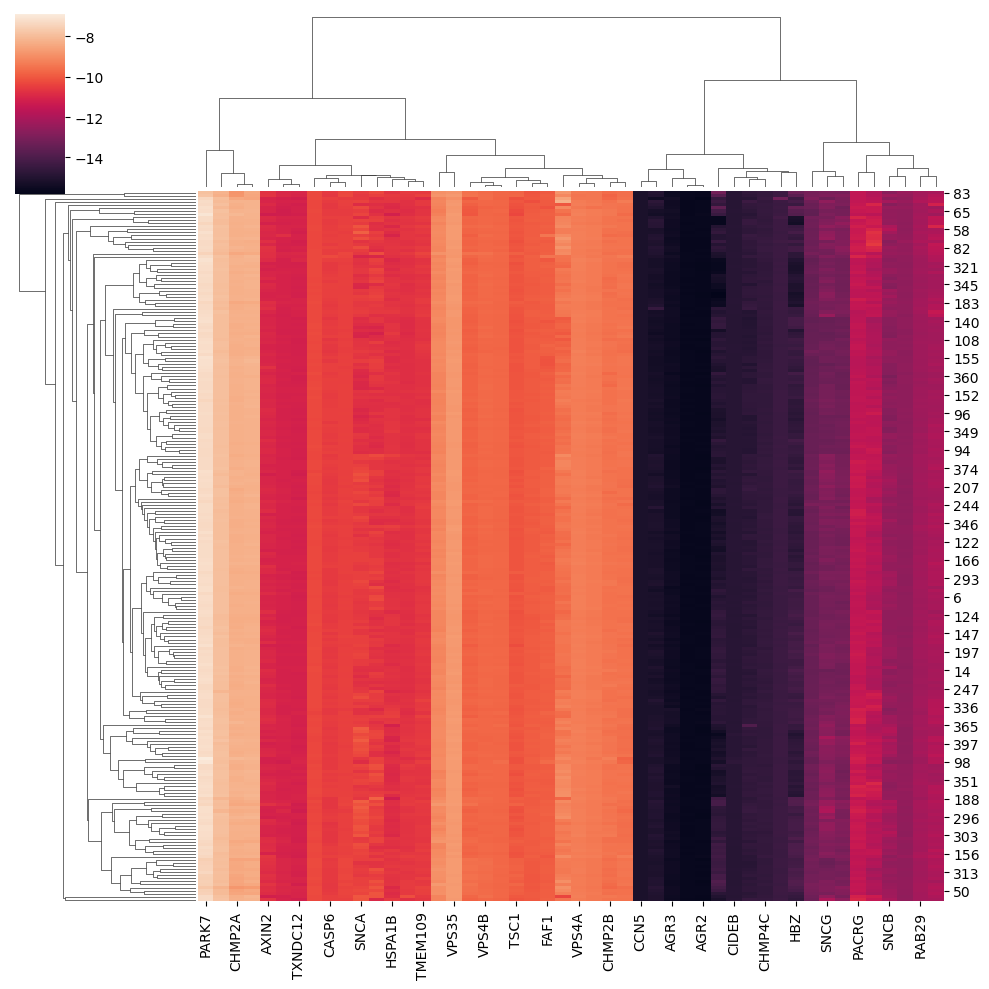

Regulation Of Cell Migration Involved In Sprouting Angiogenesis


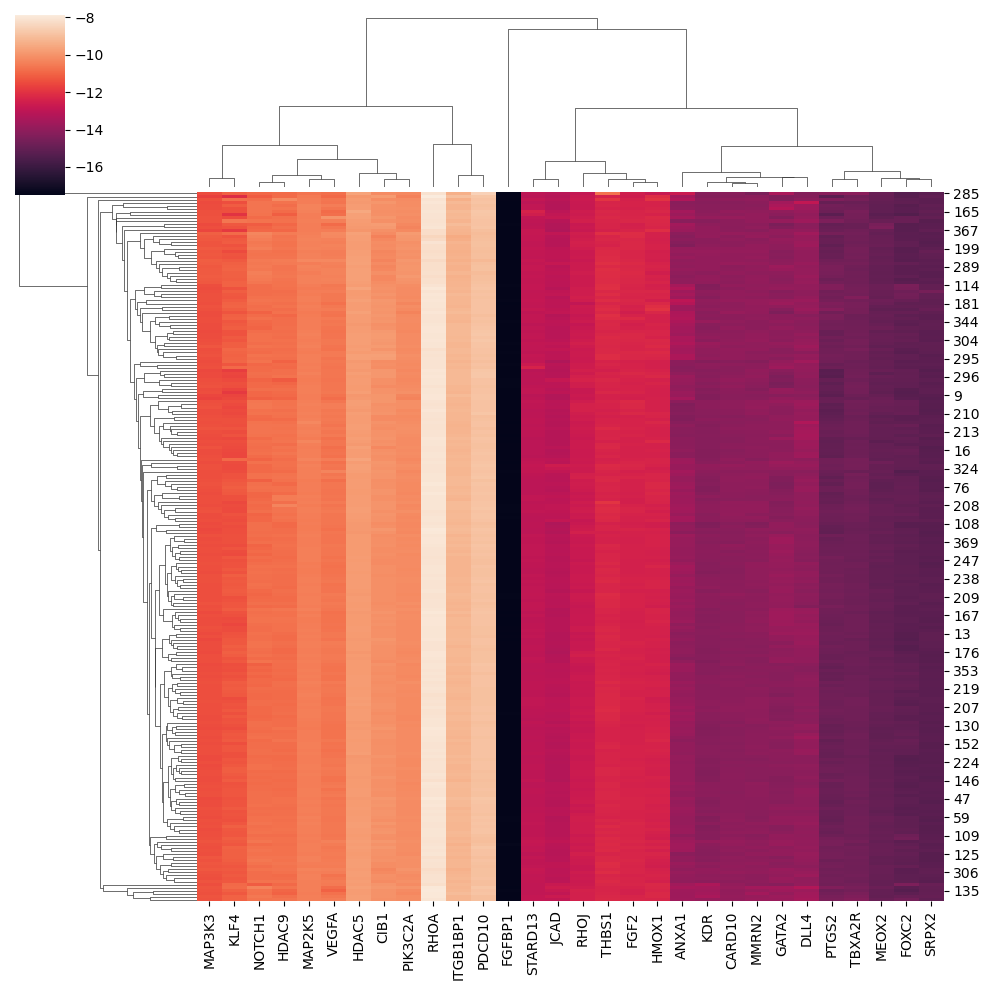

Lymphocyte Proliferation


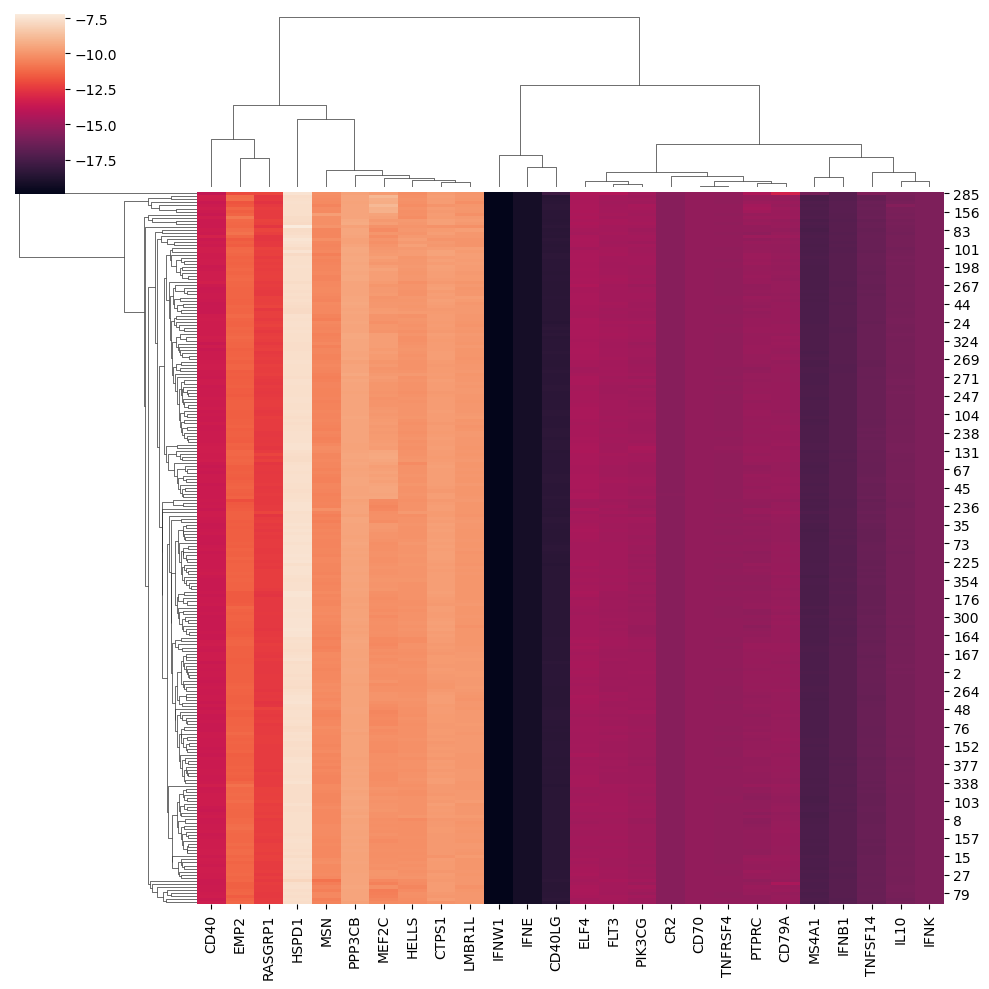

Neutral Amino Acid Transport


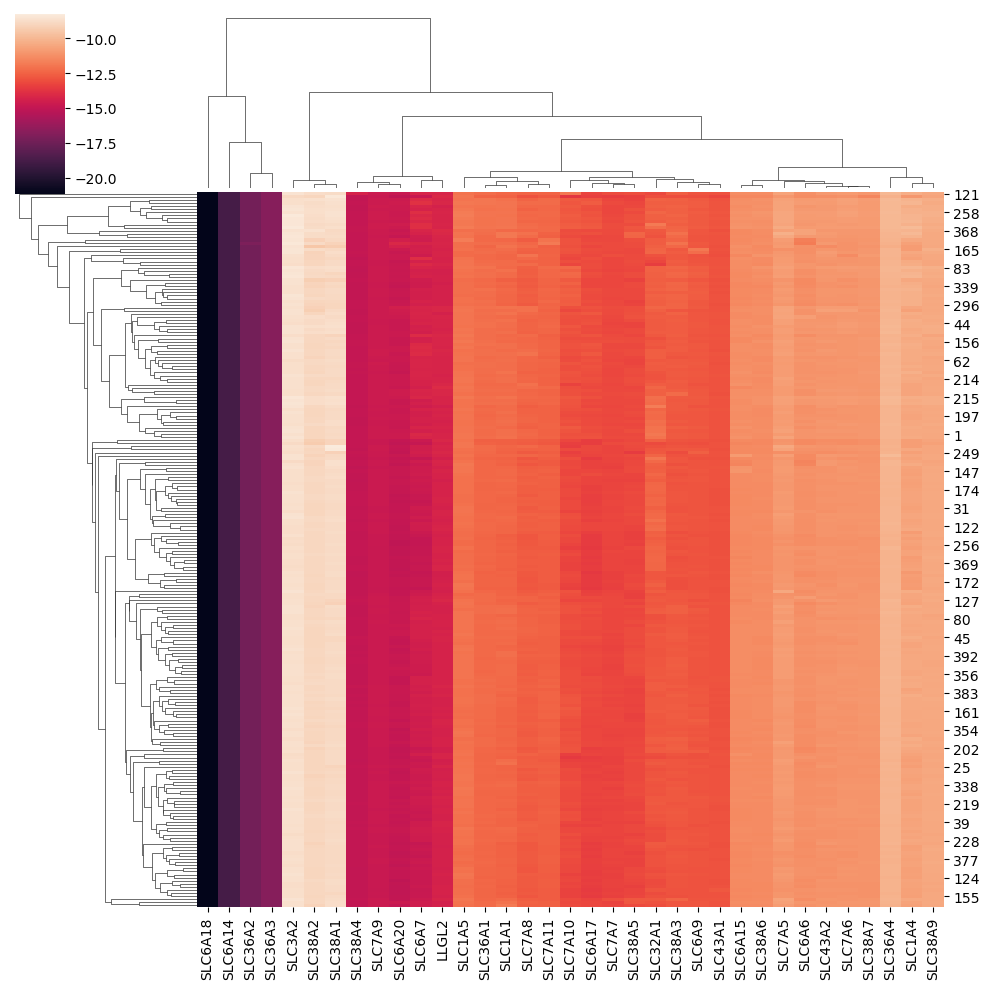

Negative Regulation Of Endothelial Cell Apoptotic Process


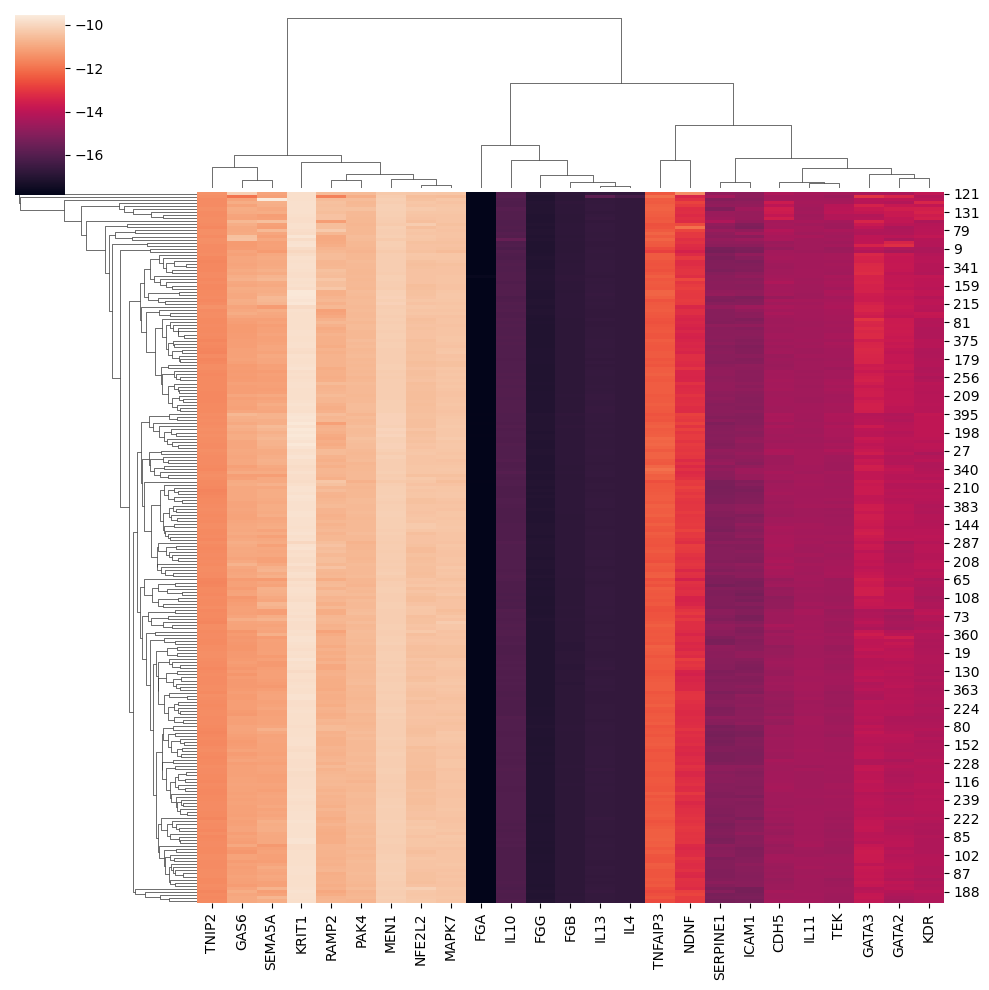

Chromosome Condensation


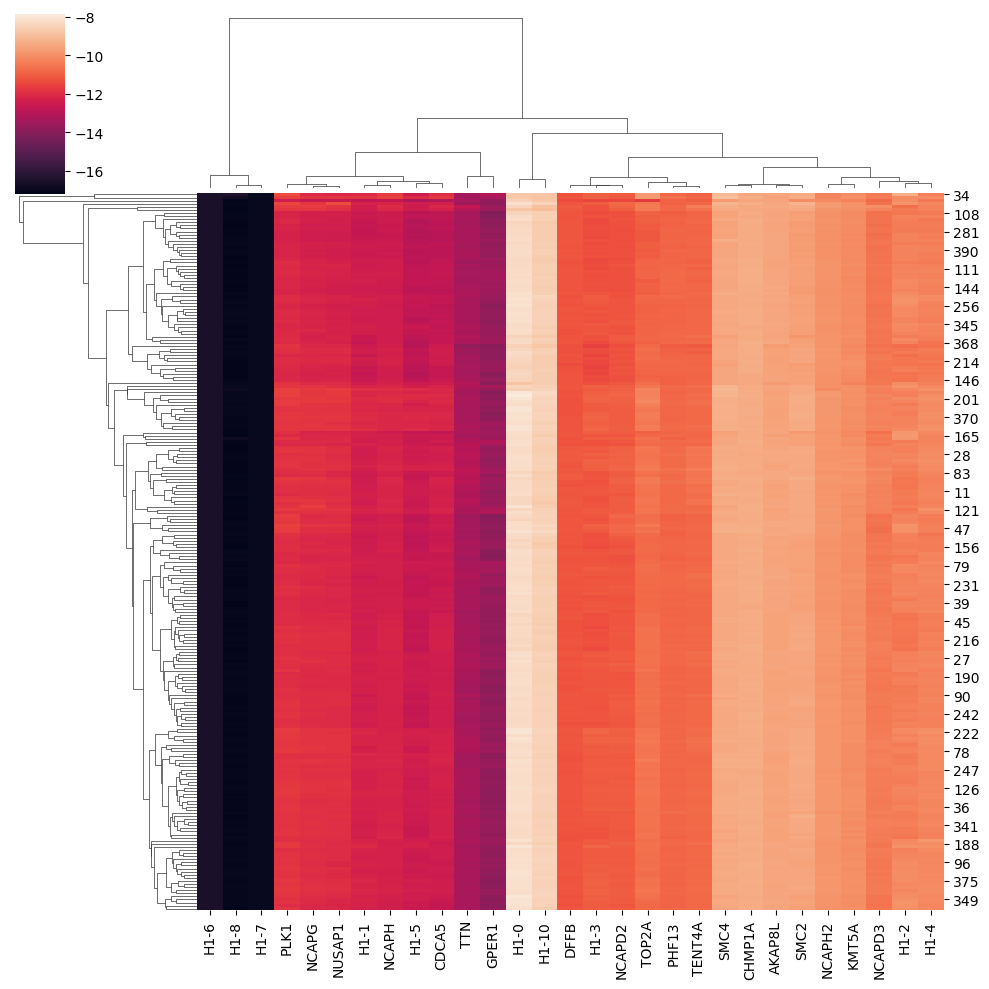

Phospholipase C-activating G Protein-Coupled Receptor Signaling Pathway


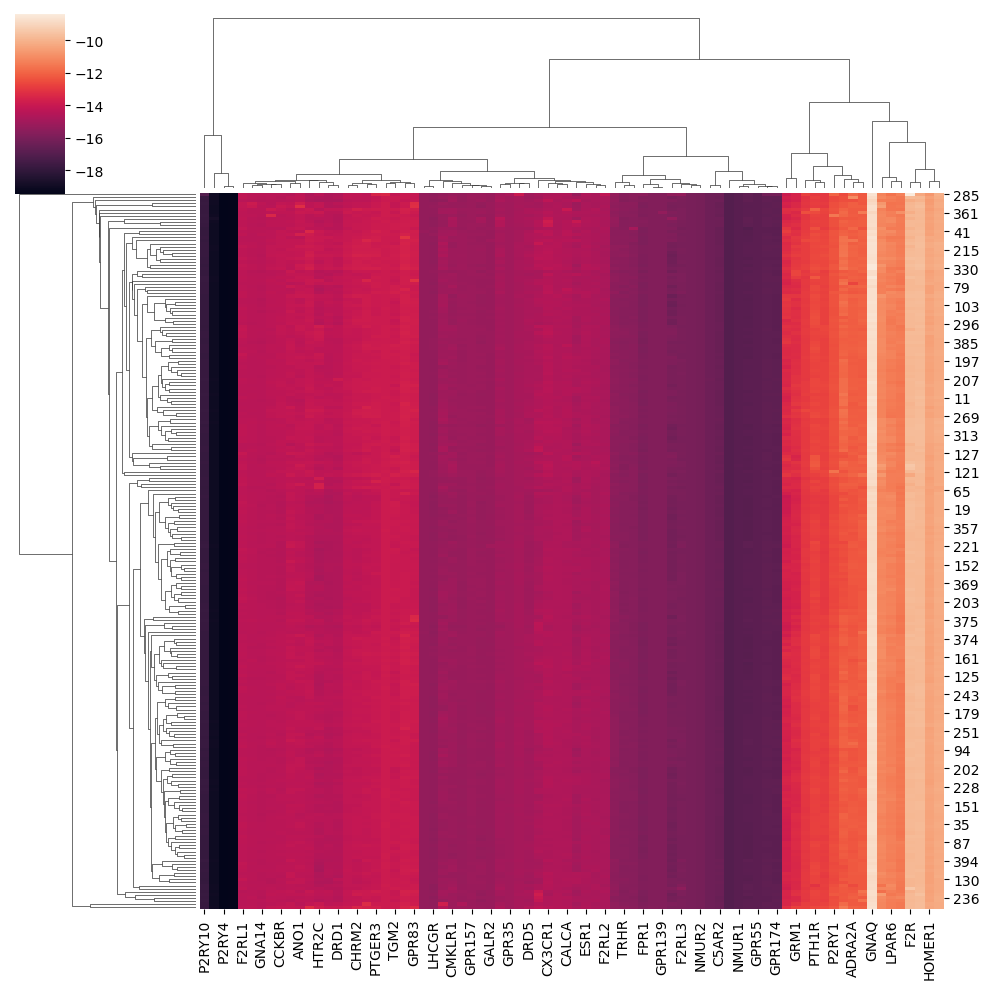

Detection Of Chemical Stimulus Involved In Sensory Perception


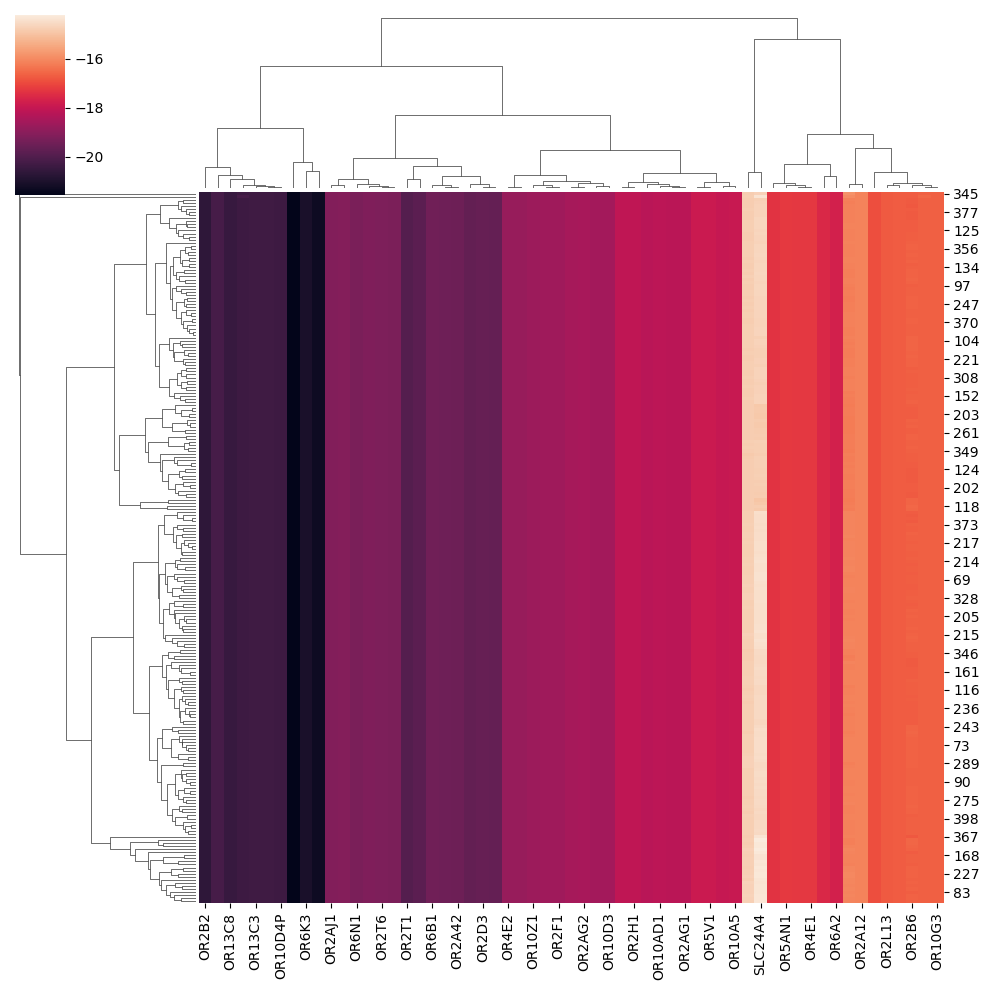

Detection Of Chemical Stimulus Involved In Sensory Perception Of Smell


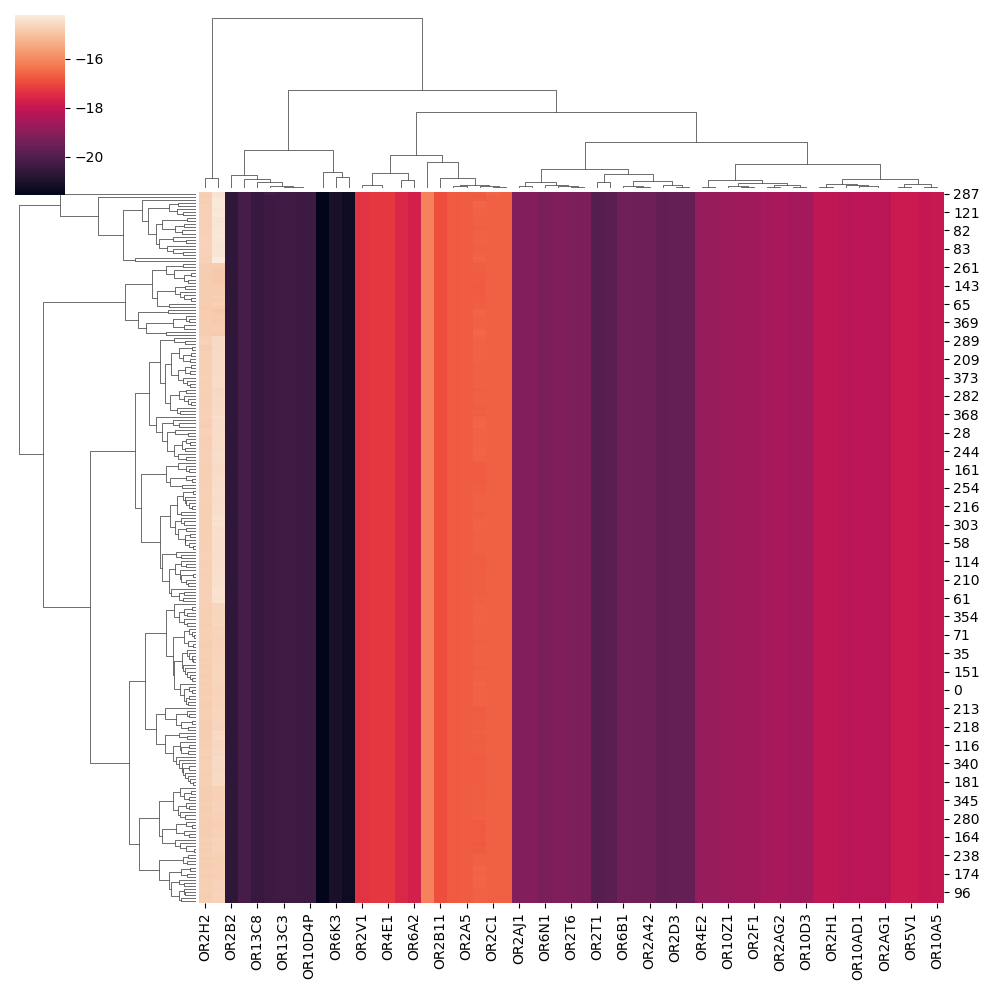

Detection Of Chemical Stimulus Involved In Sensory Perception Of Taste


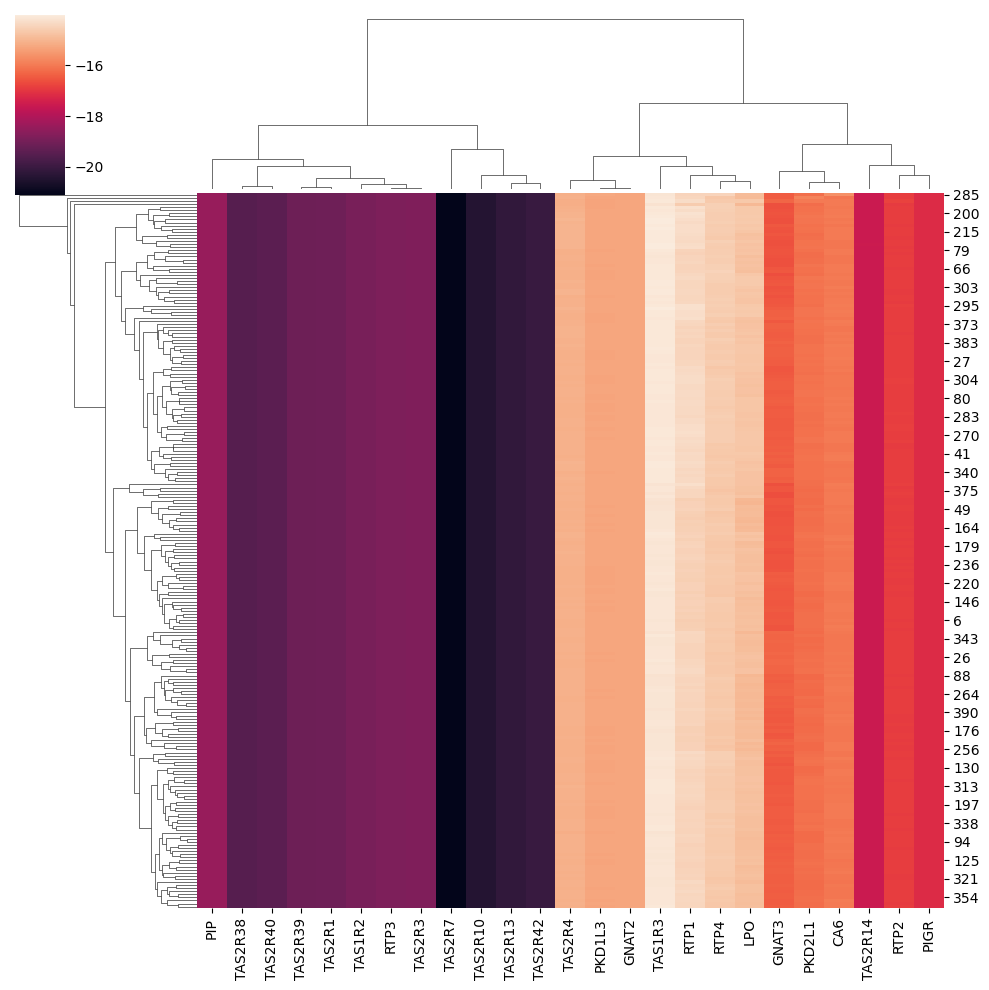

Positive Regulation Of Locomotion


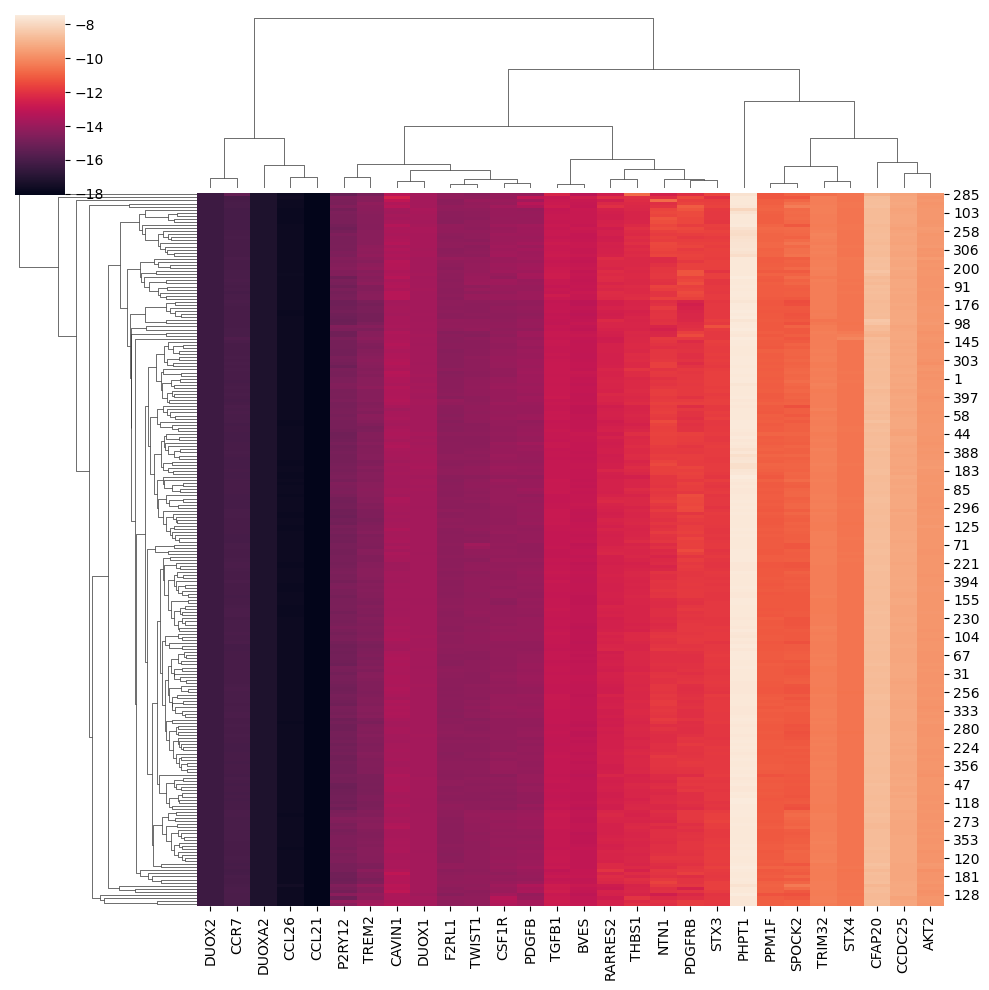

Sensory Perception Of Chemical Stimulus


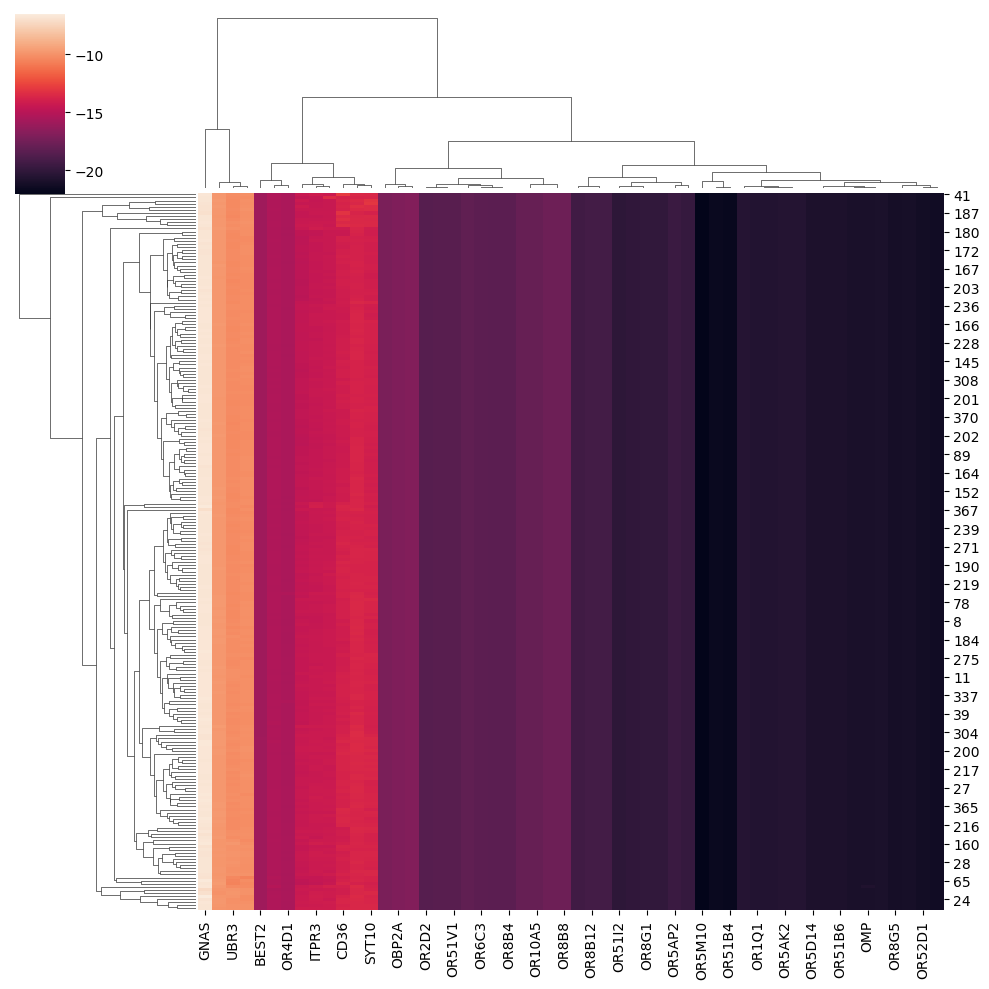

Sensory Perception Of Smell


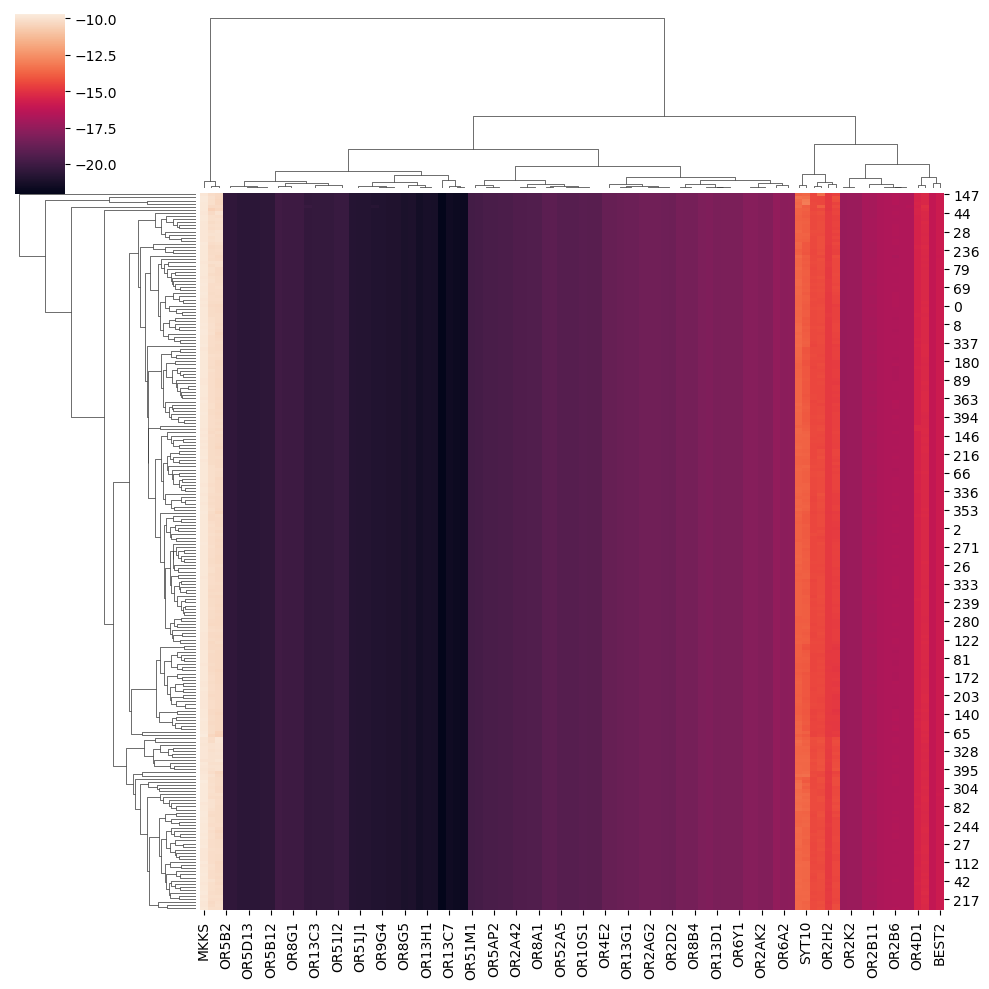

Regulation Of Interleukin-8 Production


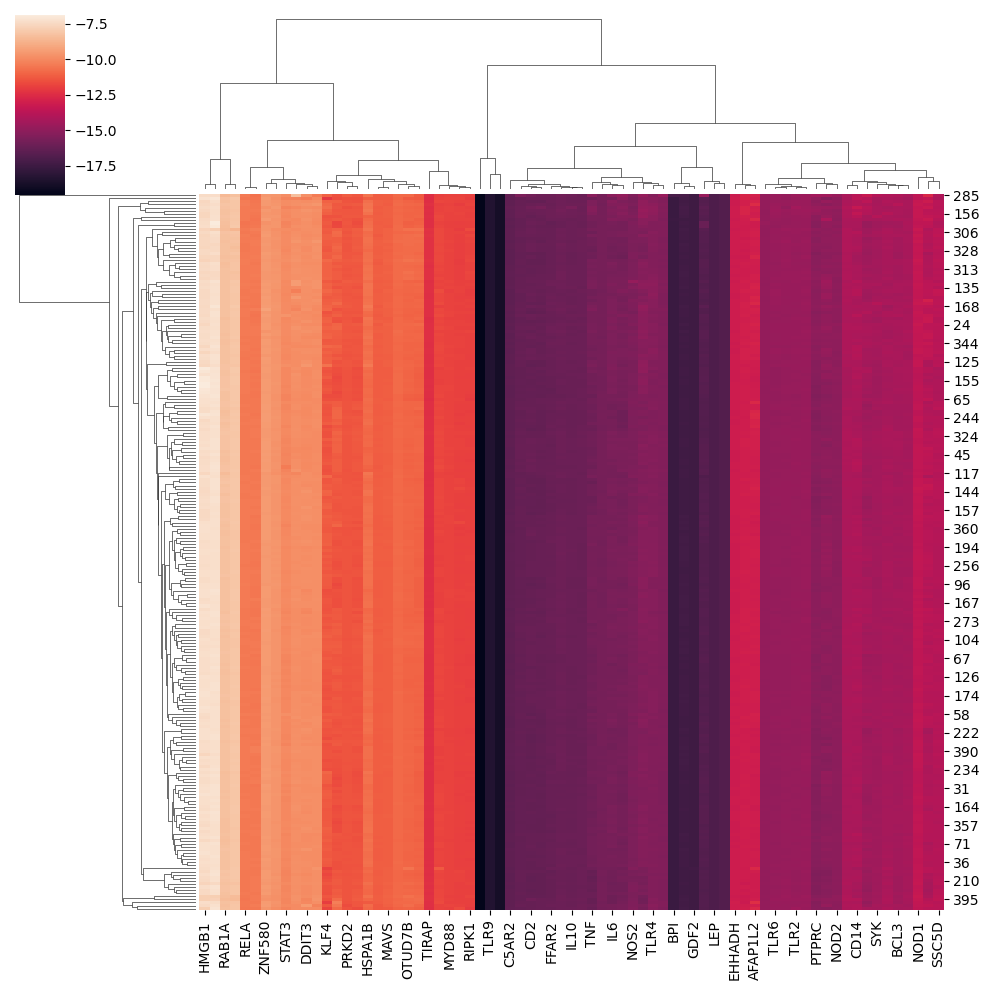

Integrated Stress Response Signaling


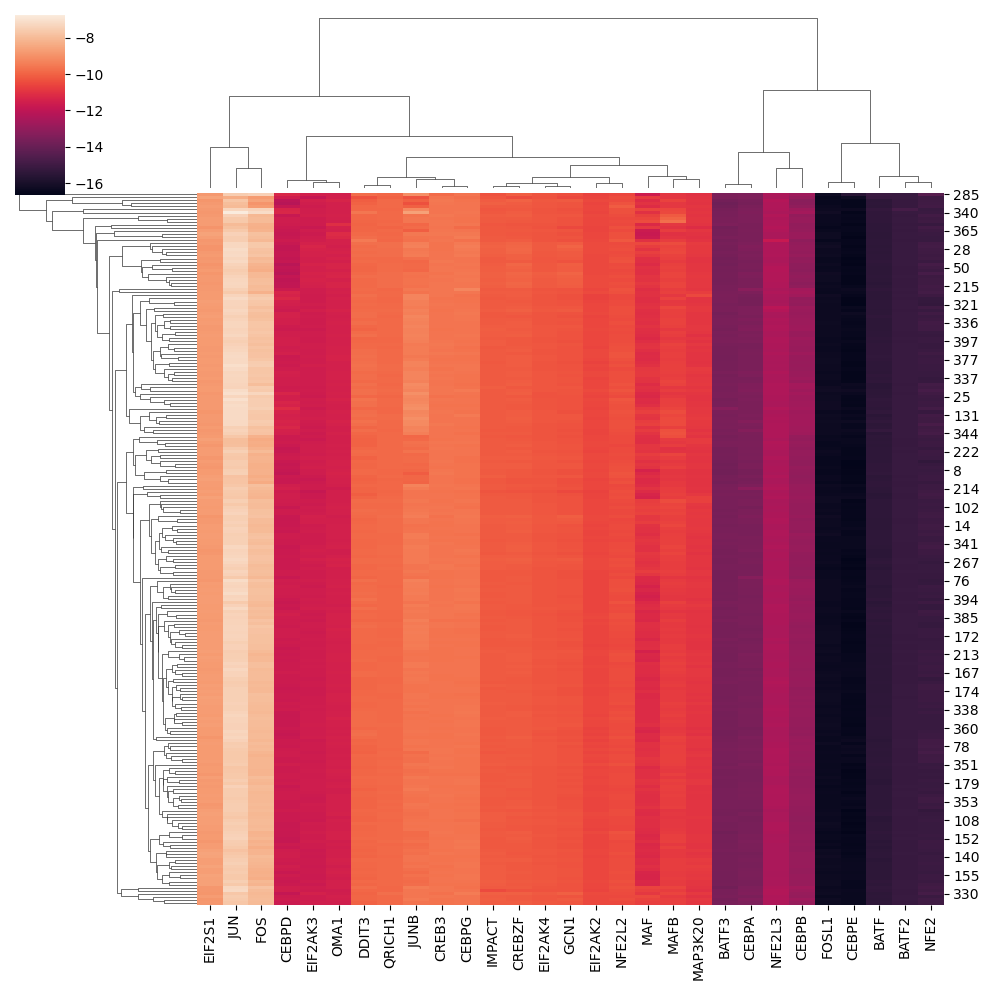

Skeletal Muscle Organ Development


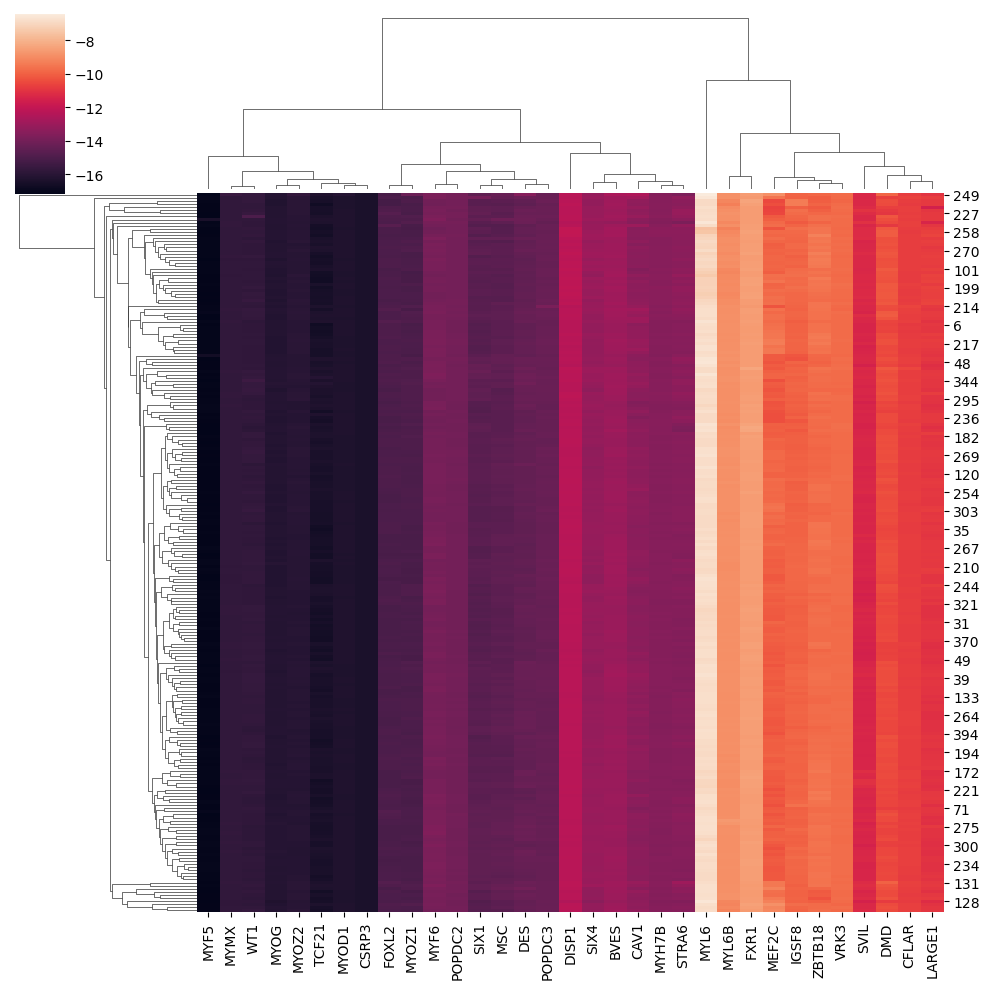

Positive Regulation Of B Cell Proliferation


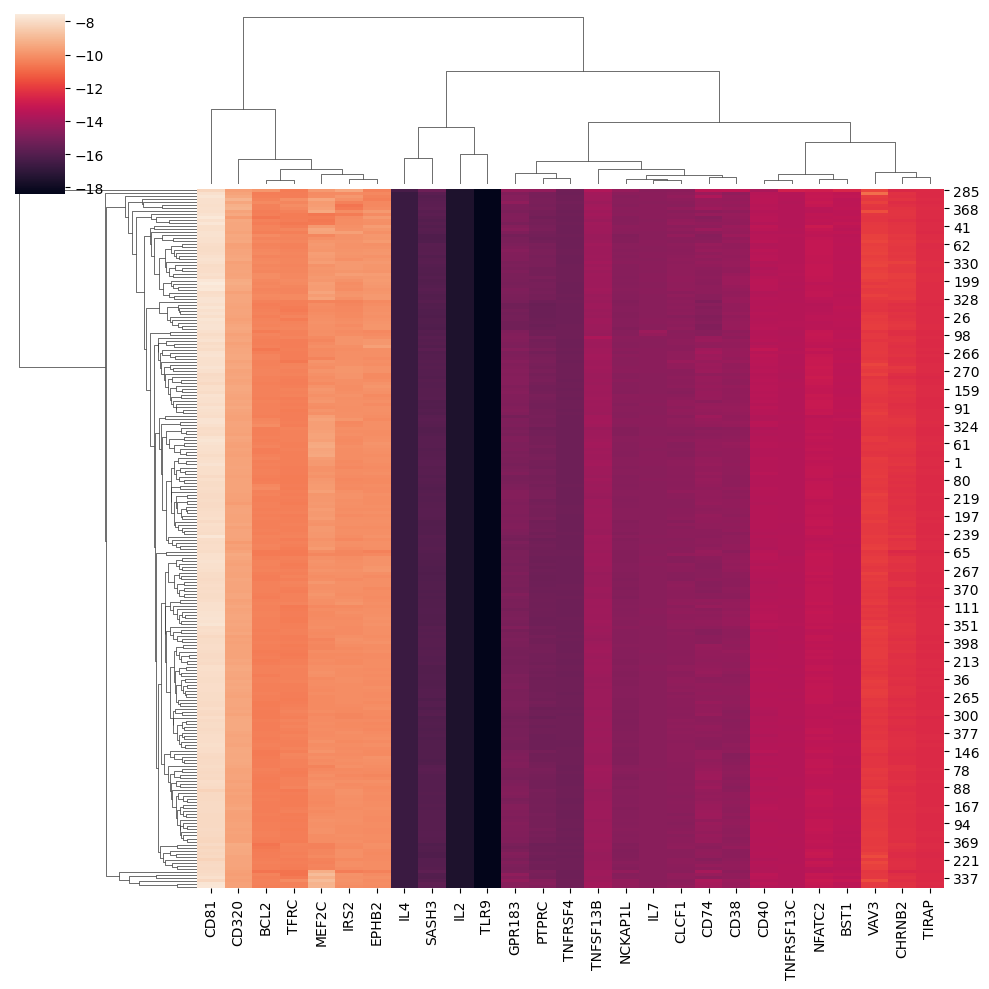

Skeletal System Morphogenesis


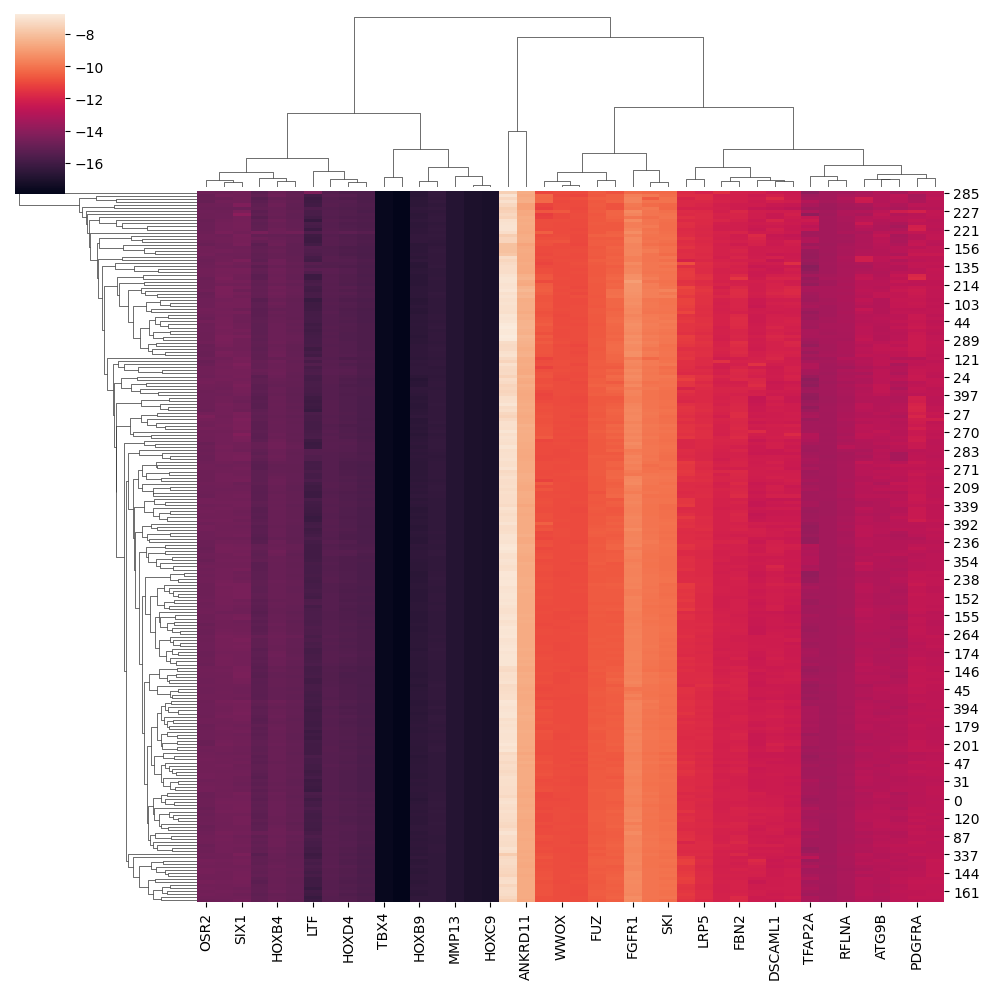

Regulation Of Cardiac Muscle Cell Contraction


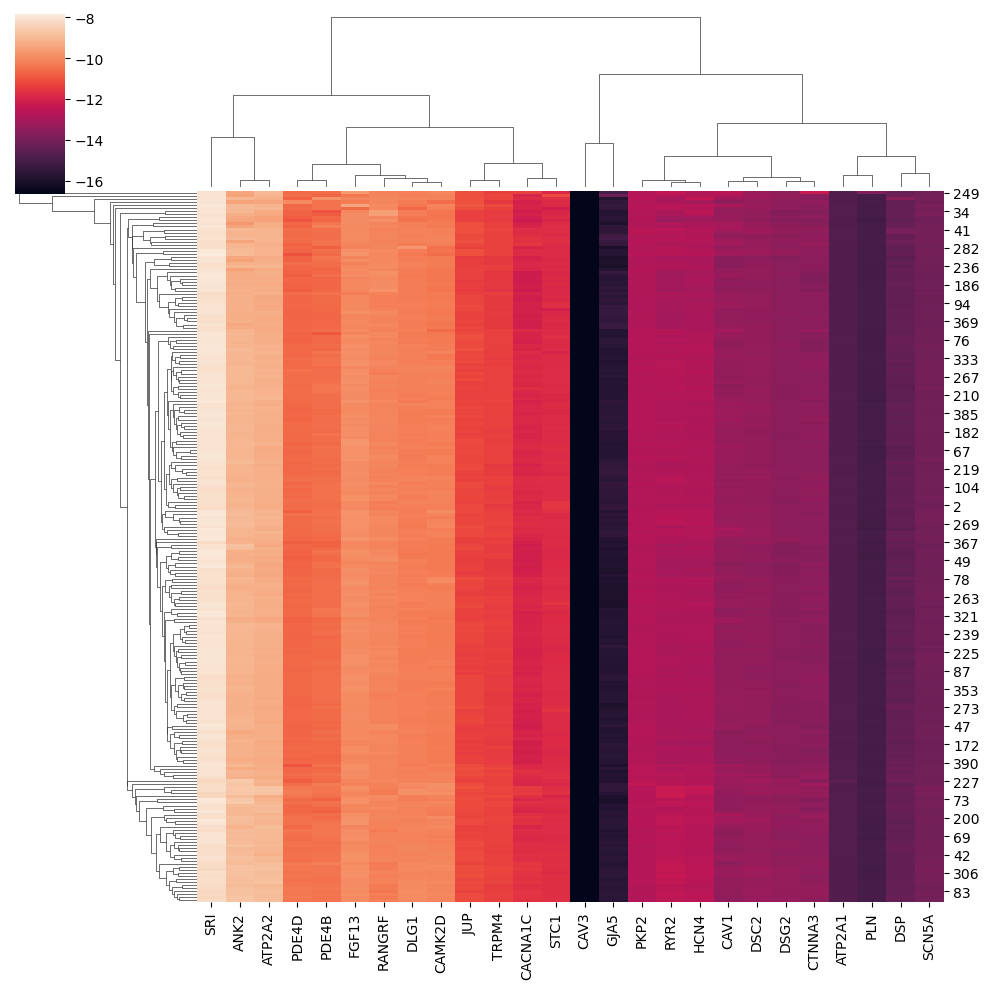

In [137]:
for k in short_gene_lists.keys():
    gene_list=short_gene_lists[k]
    gene_list=[x for x in gene_list if x in adata.var.index]
    print(k)
    seaborn.clustermap(cluster_df.loc[:,gene_list])
    plt.show()

In [138]:
term_linkage=scipy.cluster.hierarchy.linkage(prerank_out_df.T,method='average',metric='correlation')
term_linkage_order_inds=scipy.cluster.hierarchy.leaves_list(term_linkage)
term_linkage_order=pd.Series(prerank_out_df.columns)[scipy.cluster.hierarchy.leaves_list(term_linkage)].to_list()

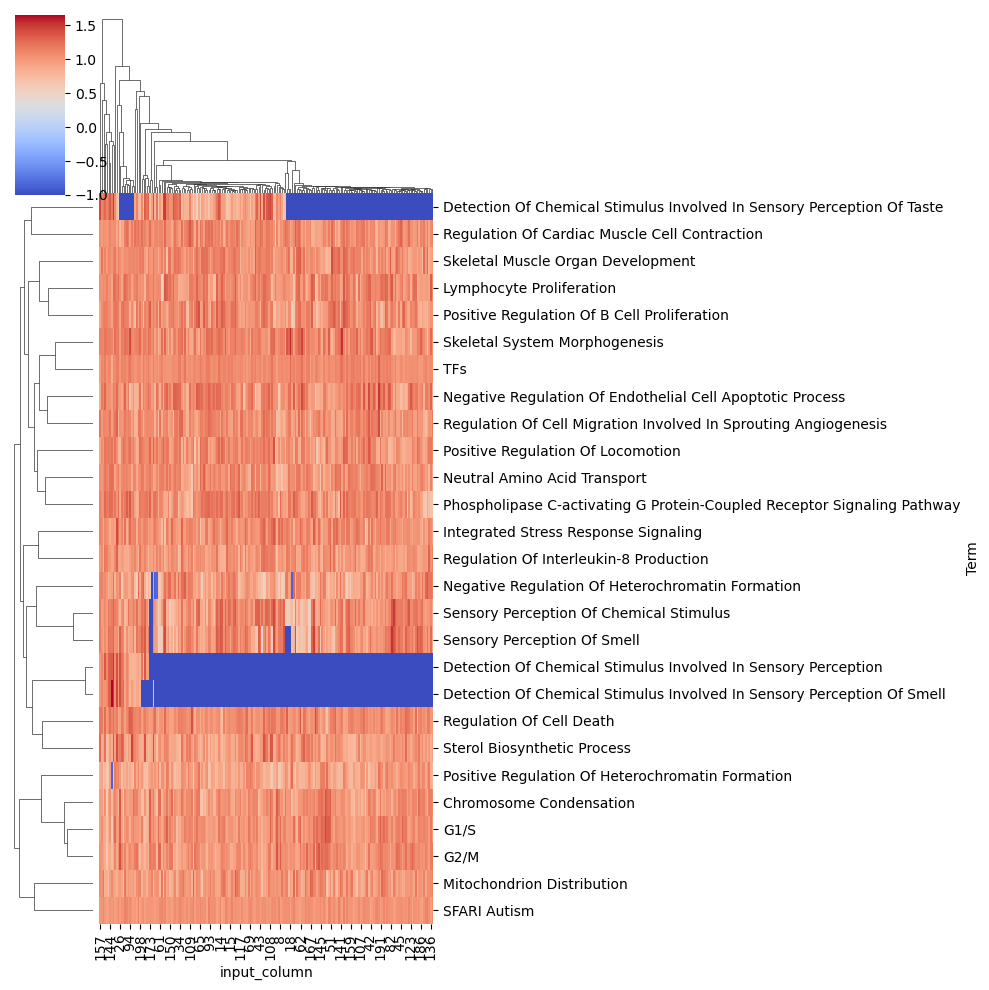

In [139]:
seaborn.clustermap(prerank_out_df.T,col_cluster=True,row_cluster=True,metric='correlation',yticklabels=True,cmap='coolwarm')

In [140]:
prerank_out_df

Term,Chromosome Condensation,Detection Of Chemical Stimulus Involved In Sensory Perception,Detection Of Chemical Stimulus Involved In Sensory Perception Of Smell,Detection Of Chemical Stimulus Involved In Sensory Perception Of Taste,G1/S,G2/M,Integrated Stress Response Signaling,Lymphocyte Proliferation,Mitochondrion Distribution,Negative Regulation Of Endothelial Cell Apoptotic Process,...,Regulation Of Cell Death,Regulation Of Cell Migration Involved In Sprouting Angiogenesis,Regulation Of Interleukin-8 Production,SFARI Autism,Sensory Perception Of Chemical Stimulus,Sensory Perception Of Smell,Skeletal Muscle Organ Development,Skeletal System Morphogenesis,Sterol Biosynthetic Process,TFs
input_column,,,,,,,,,,,,,,,,,,,,,
0,0.964991,1.098697,1.099310,1.114985,1.066814,1.001788,1.093451,1.027985,1.044264,1.183264,...,1.183942,0.989369,1.070738,1.027445,0.968454,1.015914,1.210088,1.126602,0.859115,1.102348
1,0.887568,1.213934,1.211862,-1.000000,0.923836,1.108592,1.117761,0.902776,0.895402,0.903879,...,1.161916,1.000860,0.969208,1.040402,1.050246,1.137917,0.975521,1.167647,1.321703,1.133087
10,0.941542,1.321767,1.322861,1.179192,0.855930,0.866716,1.006812,1.011861,0.722239,1.066553,...,1.069111,1.090838,1.023403,0.969895,1.186322,1.232714,1.131091,1.144378,0.782106,1.120512
100,1.025555,-1.000000,-1.000000,0.912611,0.972176,1.075108,1.231447,1.010543,1.185692,1.057836,...,1.177157,0.903380,1.029906,0.991004,1.157581,1.154315,1.075945,1.151547,0.941687,1.102503
101,1.171085,-1.000000,-1.000000,0.542926,1.204429,1.136131,0.950066,1.299951,1.090403,1.328085,...,1.062519,0.863168,1.060692,1.032304,1.235777,1.194732,1.237657,0.960113,1.049742,1.032485
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,1.055602,-1.000000,-1.000000,1.217212,0.881850,0.906093,1.111077,1.291002,0.915141,1.261134,...,1.038928,1.081519,1.212311,0.935212,1.305247,1.335043,1.135090,1.175613,0.801934,1.059093
96,0.714542,-1.000000,-1.000000,1.214706,0.897254,0.793190,1.072351,1.071594,1.053732,1.219810,...,0.977439,1.089583,1.134535,0.998798,0.862290,0.959022,1.039718,1.078174,0.738619,1.048454
97,1.205616,-1.000000,-1.000000,-1.000000,1.150647,1.364842,1.219383,1.089725,1.081522,0.835490,...,1.034525,1.191357,1.110498,1.017716,0.897301,1.249293,1.030896,1.223224,1.126064,1.048520


Starting plotting..
Starting calculating row orders..
Reordering rows..
Starting calculating col orders..
Reordering cols..
Plotting matrix..
Starting plotting HeatmapAnnotations
Starting plotting HeatmapAnnotations
Plotting legends..
Estimated legend width: 7.5 mm


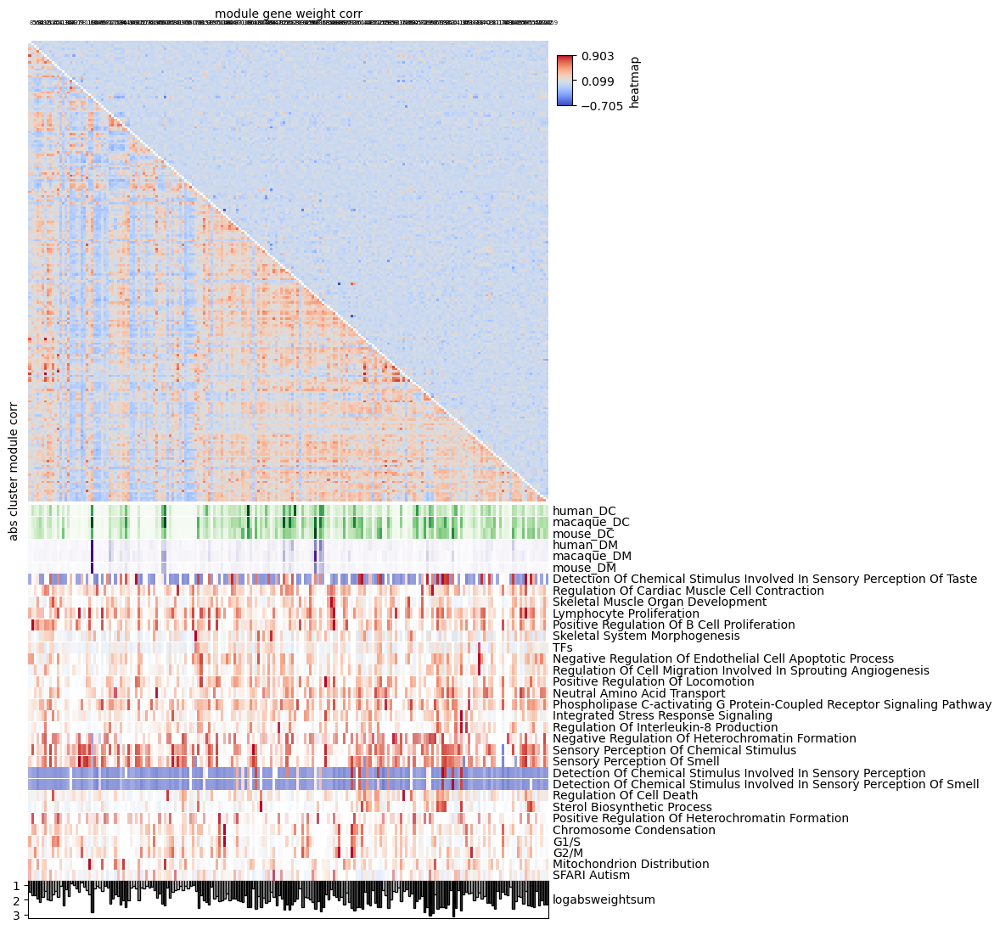

In [141]:
dtriumat=antipode.plotting.double_triu_mat(np.corrcoef(pstore['z_decoder_weight'][latent_label_order_inds,:]),np.corrcoef(np.absolute(pstore['locs']).T[latent_label_order_inds,:]))

plt.figure(figsize=(8,12))
latent_ha_dict={}
breaks=pd.DataFrame({'breaks':[str(int(np.floor(i/20))) for i in range(len(latent_label_order))]},index=latent_label_order)

column_df=dc_df.copy()
column_df.loc[:,prerank_out_df.columns]=prerank_out_df
column_df.loc[:,breaks.columns]=breaks
column_df['index']=column_df.index
column_df=column_df.loc[latent_label_order,:]

for col in dc_df.columns:
    latent_ha_dict[col+'_DC']=pch.anno_simple(column_df[col],cmap='Greens',legend=False,rasterized=True)

for col in dmt_df.columns:
    latent_ha_dict[col+'_DM']=pch.anno_simple(dmt_df[col],cmap='Purples',legend=False,rasterized=True)

for k in term_linkage_order:#gl_preranks.keys():
    latent_ha_dict[k]=pch.anno_simple(column_df[k],cmap='coolwarm',legend=False,alpha=(1-prerank_out_pval_df.loc[column_df.index,k]))#vmin=prerank_out_df[k].min(),vmax=column_df[k].max(),

#latent_ha_dict['breaks']=pch.anno_simple(column_df['breaks'])

mat_anno_df=pd.DataFrame(np.log10(1.+np.absolute(pstore['z_decoder_weight']).sum(1)),columns=['logabsweightsum'],index=latent_labels)
column_df['logabsweightsum']=mat_anno_df
latent_ha_dict['logabsweightsum']=pch.anno_barplot(mat_anno_df['logabsweightsum'], cmap='Greys',rasterized=True,legend=False)
bottom_ha = pch.HeatmapAnnotation(**latent_ha_dict,axis=1,orientation='down',plot=False)

sq_bottom_ha = pch.HeatmapAnnotation(**latent_ha_dict,axis=1,orientation='down')

cm1 = pch.ClusterMapPlotter(data=pd.DataFrame(dtriumat,index=latent_label_order,columns=latent_label_order),
                            cmap='coolwarm',row_cluster=False,col_cluster=False,bottom_annotation=sq_bottom_ha,top_annotation=top_anno,
                            xlabel_side='top',xlabel='module gene weight corr',ylabel='abs cluster module corr',
                           col_split=20,col_split_gap=20,)
plt.savefig(os.path.join(sc.settings.figdir,'ModuleCorrClustermap.svg'))
plt.show()

<Axes: ylabel='Count'>

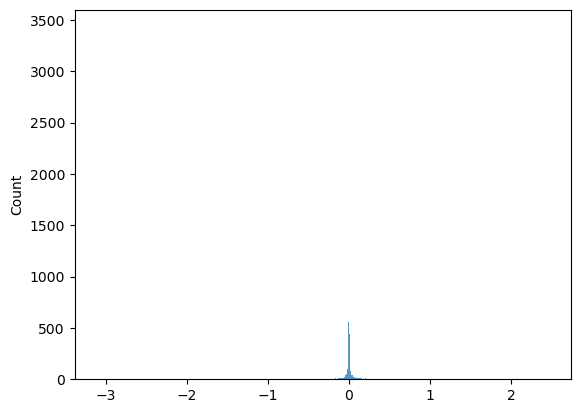

In [142]:
seaborn.histplot(pstore['locs'].flatten())

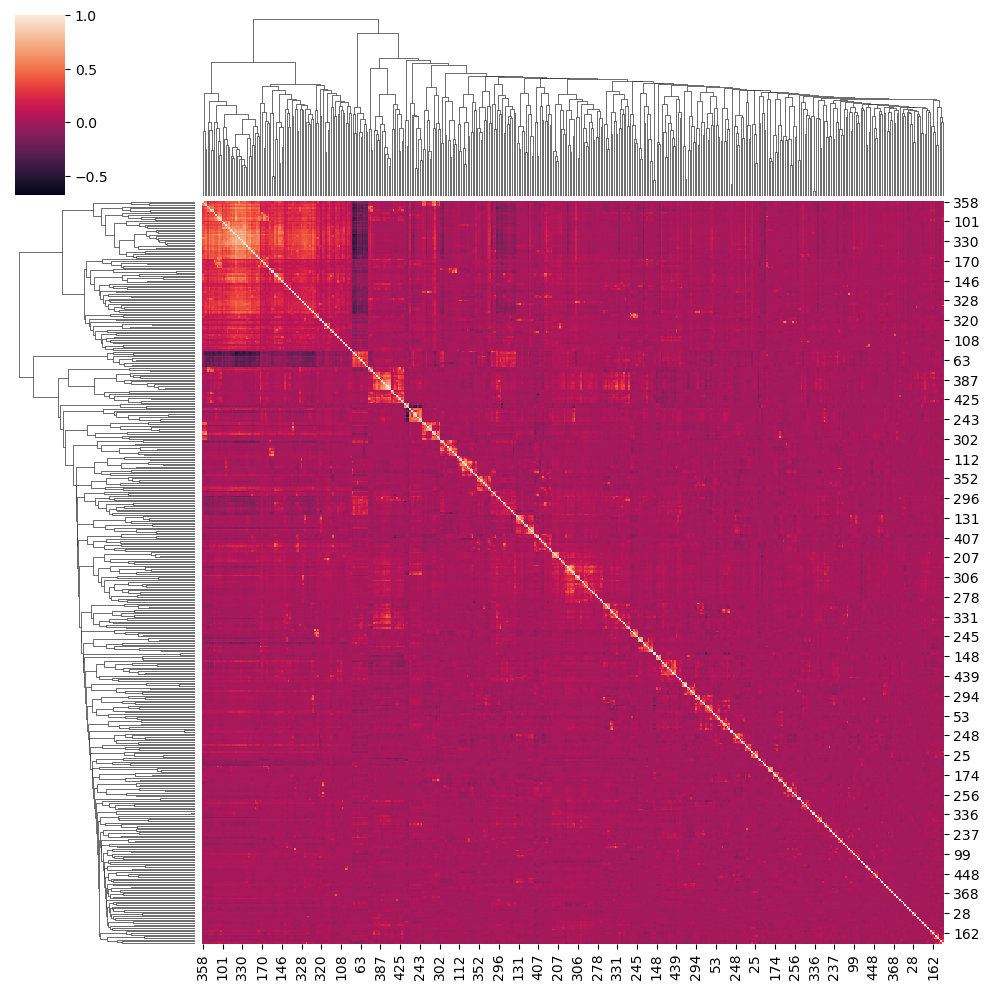

In [143]:
seaborn.clustermap(np.corrcoef(pstore['cluster_intercept']))

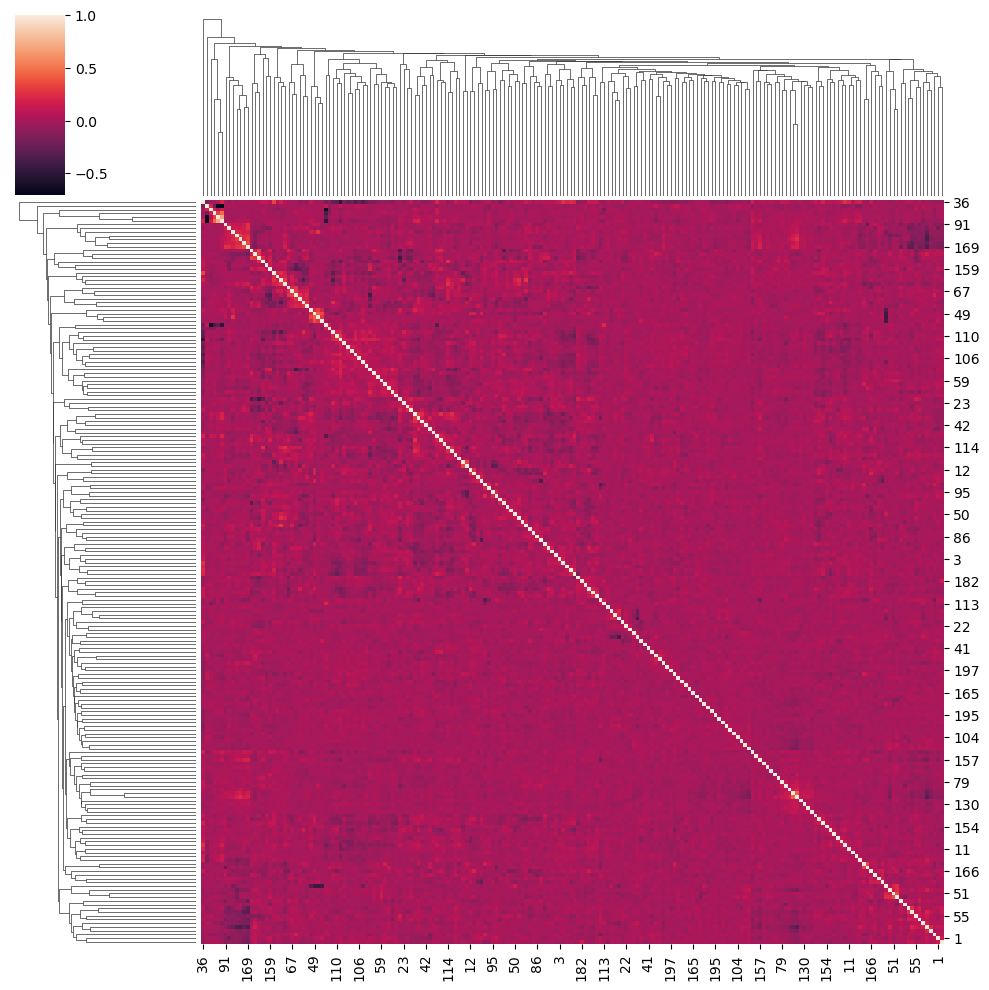

In [144]:
seaborn.clustermap(np.corrcoef(pstore['z_decoder_weight']))

<Axes: ylabel='Count'>

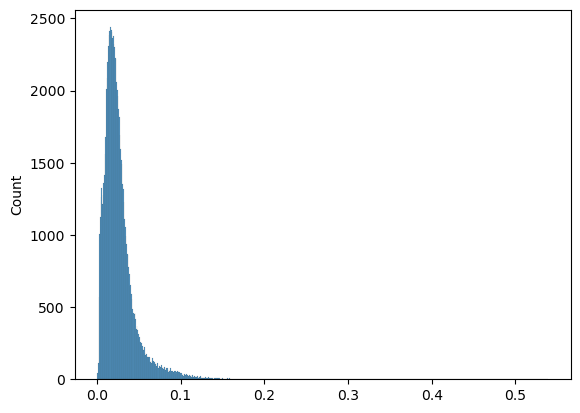

In [145]:
seaborn.histplot(np.absolute(pstore['batch_dm']).mean(0).flatten())

<Axes: ylabel='Count'>

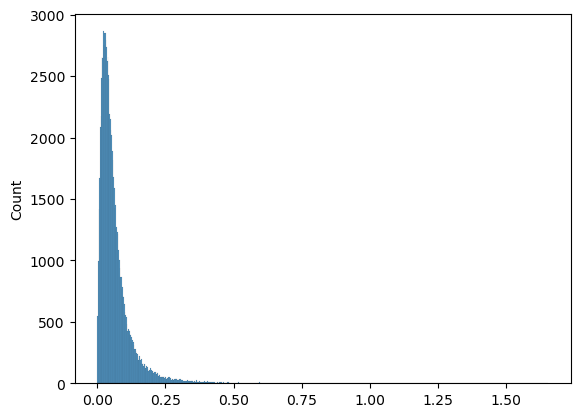

In [146]:
seaborn.histplot(np.absolute(pstore['discov_dm']).mean(0).flatten())

<Axes: ylabel='Count'>

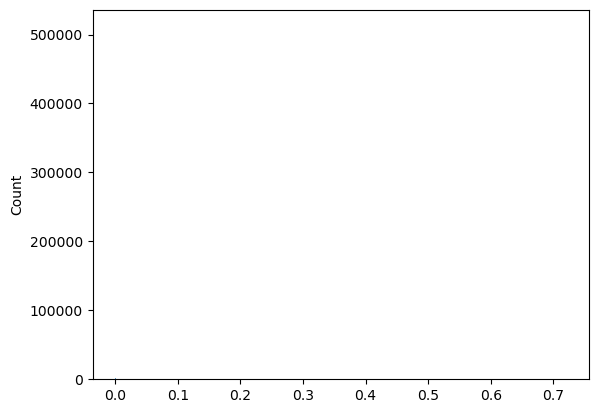

In [147]:
seaborn.histplot(np.absolute(pstore['batch_di']).mean(0).flatten())

<Axes: ylabel='Count'>

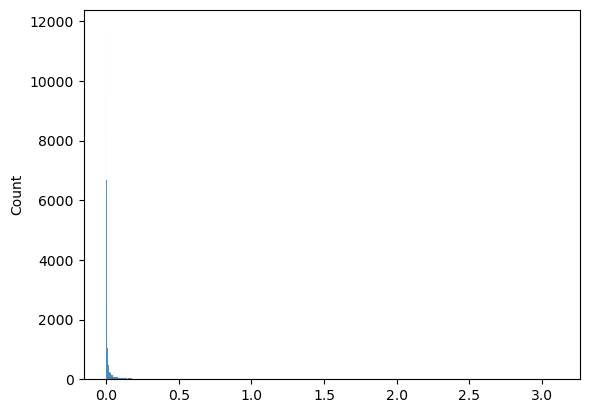

In [148]:
seaborn.histplot(np.absolute(pstore['locs']).flatten())

<Axes: ylabel='Count'>

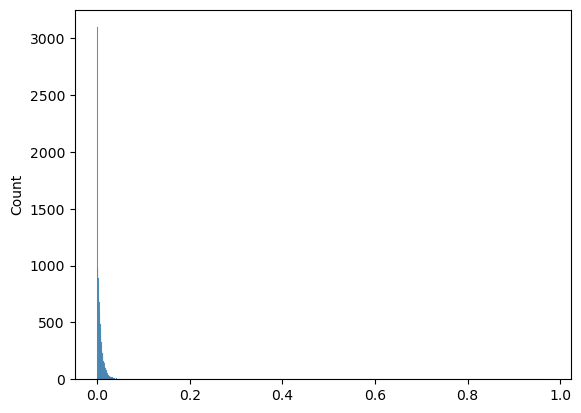

In [149]:
seaborn.histplot((prop_locs@pstore['z_decoder_weight']).var(0))

100%|██████████| 232/232 [00:00<00:00, 397.87it/s]


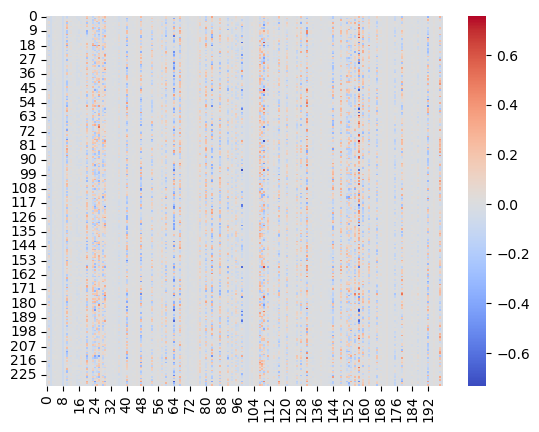

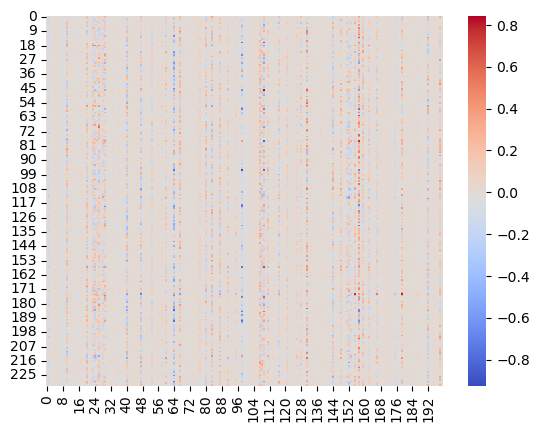

In [150]:
real_locs=antipode.model_functions.group_aggr_anndata(adata,[leaf_key],layer='X_antipode',obsm=True)
seaborn.heatmap(prop_locs[cluster_index,:],cmap='coolwarm')
plt.show()
seaborn.heatmap(real_locs[0],cmap='coolwarm')
plt.show()